In [2]:
import cv2 as cv
import random
import numpy as np
import pandas as pd
from math import hypot
pd.set_option('max_colwidth', 1000)
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from collections import defaultdict
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

import io
from IPython.display import HTML
from matplotlib.patches import Ellipse, Arc
from sklearn.cluster import KMeans
from skimage import transform as transf
from skimage.transform import ProjectiveTransform
from moviepy.editor import VideoClip
from moviepy.video.io.bindings import mplfig_to_npimage

### pitch sizes are typically 64-70m wide and 100-105m long

# Process begins here

In [3]:
def centroid_histogram(clt):
	# grab the number of different clusters and create a histogram
	# based on the number of pixels assigned to each cluster
	numLabels = np.arange(0, len(np.unique(clt.labels_)) + 1)
	(hist, _) = np.histogram(clt.labels_, bins = numLabels)
 
	# normalize the histogram, such that it sums to one
	hist = hist.astype("float")
	hist /= hist.sum()
 
	# return the histogram
	return hist

In [4]:
def plot_colors(hist, centroids):
    # initialize the bar chart representing the relative frequency
    # of each of the colors
    bar = np.zeros((50, 300, 3), dtype = "uint8")
    startX = 0
 
    # loop over the percentage of each cluster and the color of
    # each cluster
    for (percent, color) in zip(hist, centroids):
        # plot the relative percentage of each cluster
        endX = startX + (percent * 300)
        cv.rectangle(bar, (int(startX), 0), (int(endX), 50),
            color.astype("uint8").tolist(), -1)
        startX = endX

    # return the bar chart
    return bar

In [5]:
X_SIZE = 105.0
Y_SIZE = 68.0

BOX_HEIGHT = (16.5*2 + 7.32)/Y_SIZE*100
BOX_WIDTH = 16.5/X_SIZE*100

GOAL = 7.32/Y_SIZE*100

GOAL_AREA_HEIGHT = 5.4864*2/Y_SIZE*100 + GOAL
GOAL_AREA_WIDTH = 5.4864/X_SIZE*100


def draw_pitch():
    """Sets up field
    Returns matplotlib fig and axes objects.
    """
        
    fig = plt.figure(figsize=(X_SIZE/15, Y_SIZE/15))
    fig.patch.set_facecolor('#a8bc95')

    axes = fig.add_subplot(1, 1, 1, axisbg='#a8bc95')

    axes.xaxis.set_visible(False)
    axes.yaxis.set_visible(False)

    axes.set_xlim(0,100)
    axes.set_ylim(0,100)    

    axes = draw_patches(axes)
    
    return fig, axes

def draw_patches(axes):
    plt.xlim([-5,105])
    plt.ylim([-5,105])

    #pitch
    axes.add_patch(plt.Rectangle((0, 0), 100, 100,
                       edgecolor="white", facecolor="none", alpha=1))

    #half-way line
    axes.add_line(plt.Line2D([50, 50], [100, 0],
                    c='w'))
    
    #penalty areas
    axes.add_patch(plt.Rectangle((100-BOX_WIDTH, (100-BOX_HEIGHT)/2),  BOX_WIDTH, BOX_HEIGHT,
                       ec='w', fc='none'))
    axes.add_patch(plt.Rectangle((0, (100-BOX_HEIGHT)/2),  BOX_WIDTH, BOX_HEIGHT,
                               ec='w', fc='none'))                       
    
    #goal areas
    axes.add_patch(plt.Rectangle((100-GOAL_AREA_WIDTH, (100-GOAL_AREA_HEIGHT)/2),  GOAL_AREA_WIDTH, GOAL_AREA_HEIGHT,
                       ec='w', fc='none'))
    axes.add_patch(plt.Rectangle((0, (100-GOAL_AREA_HEIGHT)/2),  GOAL_AREA_WIDTH, GOAL_AREA_HEIGHT,
                               ec='w', fc='none'))       
    
    #penalty arcs
    axes.add_patch(Arc((100-BOX_WIDTH,50),7,18, theta1 = 90, theta2 =270, edgecolor='w'))
    axes.add_patch(Arc((BOX_WIDTH,50),7,18, theta1 = 270, theta2 =90, edgecolor='w'))


    #goals
    axes.add_patch(plt.Rectangle((100, (100-GOAL)/2),  1, GOAL,
                       ec='w', fc='none'))
    axes.add_patch(plt.Rectangle((0, (100-GOAL)/2),  -1, GOAL,
                               ec='w', fc='none'))                       
    
    
    #halfway circle
    axes.add_patch(Ellipse((50, 50), 2*9.15/X_SIZE*100, 2*9.15/Y_SIZE*100,
                                    ec='w', fc='none'))

    return axes

In [6]:
def get_dominant_colors(image, clusters):
    # Reshape the image to be a list of pixels
    if image.shape[1] != 3:
        image = cv.resize(image, (20, 80));
        image = image.reshape((image.shape[0] * image.shape[1], 3))
    else:
        pass
    # Clusters the pixels
    clt = KMeans(clusters)
    clt.fit(image)
    
    hist = centroid_histogram(clt)
    #indices of sorted histogram size 
    idx = np.argsort(hist)[::-1]
    #clusters sorted by size, most dominant is first
    sorted_clusters = clt.cluster_centers_[idx]
    
    bar = plot_colors(hist, clt.cluster_centers_[idx])
 
    #show our color bart
#     plt.figure()
#     plt.axis("off")
#     plt.imshow(bar)
#     plt.show()
    
    return sorted_clusters

In [7]:
def get_color_similarity(color1, color2):
    diffred = abs(color1[0] - color2[0])
    diffgreen = abs(color1[1] - color2[1])
    diffblue = abs(color1[2] - color2[2])

    pctdiffred = diffred/255
    pctdiffgreen = diffgreen/255
    pctdiffblue = diffblue/255

    return ((pctdiffred+pctdiffgreen+pctdiffblue) / 3)*100

In [8]:
def pen_box_coords(contour):
    cnt = contour.reshape(contour.shape[0], 2)
    top_pt_idx = np.argmin([coord[0] for coord in cnt])
    bot_pt_idx = np.argmax([coord[1] for coord in cnt])
    top_pt = list(cnt[top_pt_idx])
    bot_pt = list(cnt[bot_pt_idx])
    
    return top_pt, bot_pt

In [9]:
def get_hsv_edges(img):
    
    hsvarr = np.array([33, 62, 153])
    lower=np.array([hsvarr[0]-10,62,154])
    upper=np.array([hsvarr[0]+10,100,220])
    kernel = np.ones((15,15))
    
    
    #hsv for detection
    hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
    #blur for line detection
    mask=cv.inRange(hsv,lower,upper)
    edges = cv.Canny(mask,100,250,apertureSize = 3)
    grayedges = cv.blur(edges, (15,15))
    erode = cv.erode(grayedges, kernel)
    dilate = cv.dilate(erode, kernel)
    return dilate

In [10]:
def getAngle(x1,y1,x2,y2):
    return np.rad2deg(np.arctan2(y2 - y1, x2 - x1))

def distance(x1,y1,x2,y2):
    return hypot(x2-x1, y2-y1)

In [11]:
def line_groups(lines):
    line_dict = defaultdict(list)

    hough_lines = lines.reshape(lines.shape[0], 4)

    firstxy = hough_lines[0]
    line_dict["group1"].append([firstxy[0], firstxy[1], firstxy[2], firstxy[3]])

    for line in hough_lines[1:]:
        new_cluster = True
        keys = list(line_dict.keys())
        line_angle = getAngle(line[0], line[1], line[2], line[3])
        for k in keys:
            #first line in existing group
            startx,starty,endx, endy = line_dict[k][0][0], line_dict[k][0][1], line_dict[k][0][2], line_dict[k][0][3]
            #angle of line being assigned
            dict_angle = getAngle(line_dict[k][0][0], line_dict[k][0][1],line_dict[k][0][2], line_dict[k][0][3])
            #if line being assigned is similar to a line in an existing group
            if ((abs(startx-line[0]) < 50) and (abs(starty-line[1]) < 50) 
            and (abs(endx-line[2]) < 50) and (abs(endy-line[3]) < 50)):
                line_dict[k].append([line[0], line[1], line[2], line[3]])
                new_cluster = False
                break
        if new_cluster:
            line_dict["group%s" % (len(keys)+1)].append([line[0], line[1], line[2], line[3]])
    return line_dict

In [12]:
def final_lines(line_dict):
    line_len_75p = np.percentile([len(v) for k,v in line_dict.items()], 75)
    lines_to_draw = [k for k,v in line_dict.items() if len(v) > line_len_75p]
    final = []
    for group in lines_to_draw:
        avg = [int(sum(col)/len(col)) for col in zip(*line_dict[group])]
        final.append(avg)
    for line in final:
        if getAngle(line[0], line[1], line[2], line[3]) < 10:
            final.remove(line)
    for line in final:
        if distance(line[0], line[1], line[2], line[3]) < 250:
            final.remove(line)
    return final

In [13]:
def get_sixyd_points(line_points): 
    ###this function references penalty box coords that are created prior to this function being called
    possible_sixyd_points = []

    for line in line_points:
        far_from_pen_box = distance(line[0], line[1], top_pen_pt[0], top_pen_pt[1]) > 200
        bounded = ((line[0] > top_pen_pt[0]) and (line[1] > top_pen_pt[1]) and (line[2] > bot_pen_pt[0]) and (line[3] < bot_pen_pt[1]))
        #line is long enough to be 6ydbox, and line doesnt start near the penalty box
        if far_from_pen_box and bounded:
            possible_sixyd_points.append([line[0], line[1], line[2], line[3]])
    #in the rare case where there are still multiple points, just pick the rightmost one
    idx = np.argmax([pts[0] for pts in possible_sixyd_points])
    return [possible_sixyd_points[idx][0], possible_sixyd_points[idx][1]], [possible_sixyd_points[idx][2], possible_sixyd_points[idx][3]] 

In [13]:
video = cv.VideoCapture('example.mp4')

In [14]:
frame_width = int(video.get(3)) #get frame width from vid
frame_height= int(video.get(4)) #get frame height from vid
fps = video.get(5)
font = cv.FONT_HERSHEY_COMPLEX

In [15]:
out = cv.VideoWriter('coords.avi',cv.VideoWriter_fourcc('M','J','P','G'), fps, (frame_width,frame_height))

In [16]:
boxPoints = defaultdict(list)

In [17]:
### Export video with circles
while(video.isOpened()):
    try:
        ok, img = video.read()
        if not ok:
            break
        else:
            #frame number in video
            vidframe = int(video.get(1))-1
            #rgb
            frame = cv.cvtColor(img, cv.COLOR_BGR2RGB)
            #get edges
            dilate = get_hsv_edges(img)

            _, contours, _= cv.findContours(dilate, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
            areas = defaultdict(int)
            for i in range(len(contours)):
                area = cv.contourArea(contours[i])
                areas[i] = area
                
            #only draw the largest contours
            contours_to_draw = [k for k,v in areas.items() if v > np.percentile(list(areas.values()), 95)]
            for i in contours_to_draw:
                cv.drawContours(frame, contours, i, (255,0,0), 2)
                
            #find the leftmost points and right most points among all contours
            #which normally indicate the penalty box coords
            all_cnt = contours[contours_to_draw[0]]
            for i in range(1, len(contours_to_draw)-1):
                all_cnt = np.concatenate((all_cnt,contours[contours_to_draw[i]]), axis = 0);

            top_pen_pt, bot_pen_pt = pen_box_coords(all_cnt)
            boxPoints[vidframe].append(top_pen_pt)
            boxPoints[vidframe].append(bot_pen_pt)
            #draw lines from contoured frame
            frame_contoured = cv.inRange(frame, np.array([255,0,0]), np.array([255,0,0]))
            lines = cv.HoughLinesP(frame_contoured,1,np.pi/180, 250, maxLineGap = 50)
            if lines is not None:
                try:
                    line_points = final_lines(line_groups(lines))
                    top_sixyd_pt, bot_sixyd_pt = get_sixyd_points(line_points)
                    boxPoints[vidframe].append(top_sixyd_pt)
                    boxPoints[vidframe].append(bot_sixyd_pt)
                    cv.circle(frame, (top_sixyd_pt[0], top_sixyd_pt[1]), 5, (0,255,0), 5)
                    cv.circle(frame, (bot_sixyd_pt[0], bot_sixyd_pt[1]), 5, (0,255,0), 5)
                except:
                    pass

            cv.circle(frame, (top_pen_pt[0], top_pen_pt[1]), 5, (0,255,0), 5)
            cv.circle(frame, (bot_pen_pt[0], bot_pen_pt[1]), 5, (0,255,0), 5)

            out.write(cv.cvtColor(frame, cv.COLOR_BGR2RGB))

    except KeyboardInterrupt:
        video.release()

video.release()
out.release()

In [18]:
boxPoints

defaultdict(list,
            {0: [[641, 459], [1086, 624]],
             1: [[644, 459], [1088, 624]],
             2: [[644, 459], [1095, 624]],
             3: [[646, 461], [1128, 624]],
             4: [[646, 461], [1128, 624]],
             5: [[649, 459], [1081, 623]],
             6: [[649, 458], [1081, 623]],
             7: [[652, 456], [1045, 620]],
             8: [[652, 456], [1036, 619]],
             9: [[654, 456], [1092, 622]],
             10: [[654, 456], [1092, 622]],
             11: [[656, 456], [1148, 622]],
             12: [[656, 456], [1131, 622]],
             13: [[658, 456], [1042, 617]],
             14: [[658, 455], [1042, 617]],
             15: [[660, 454], [1104, 620]],
             16: [[1072, 601], [1105, 620]],
             17: [[1074, 600], [1113, 619]],
             18: [[662, 452], [1105, 619]],
             19: [[663, 454], [1145, 619]],
             20: [[663, 454], [1145, 619]],
             21: [[665, 450], [1065, 655]],
             22: [[665

In [19]:
#first frame that the six yard box is drawn
first_frame_to_draw = min([k for k,v in boxPoints.items() if len(v) >2])
#average six yard box positions across frames that have the six yard box detected
avg_sixyd_top = list(np.mean([v[2]for v in boxPoints.values() if len(v) > 2], axis = 0))
avg_sixyd_bot = list(np.mean([v[3]for v in boxPoints.values() if len(v) > 2], axis = 0))
# since the sixyd box is not detected in every frame, we want to fill in with the average position
# after the first frame where it is detected
for k,v in boxPoints.items():
    if k >= first_frame_to_draw and len(v) <= 2:
        boxPoints[k].append(avg_sixyd_top)
        boxPoints[k].append(avg_sixyd_bot)

### Exploration of Point Detection Stability

In [136]:
to_draw = {k: v for k, v in boxPoints.items() if k>=first_frame_to_draw}

Pen Box Top

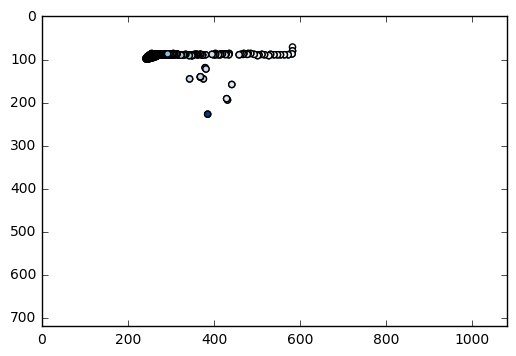

In [137]:
frames = [k for k in to_draw.keys()]
x = [x[0][0] for x in to_draw.values()]
y = [x[0][1] for x in to_draw.values()]
plt.xlim(0,1080)
plt.ylim(720,0)
plt.scatter(x,y, c = frames, cmap = 'Blues')

In [138]:
diff_pen_box_top = [distance(x[i], y[i], x[i+1], y[i+1]) for i in range(len(frames)-1)]

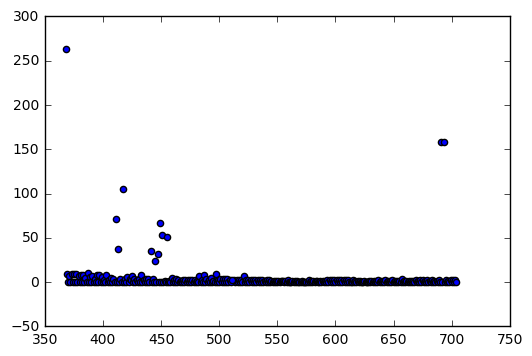

In [139]:
plt.scatter(frames[1:], diff_pen_box_top)

In [140]:
print(np.mean(x))
print(np.mean(y))

331.127596439
93.8011869436


Pen Box Bot

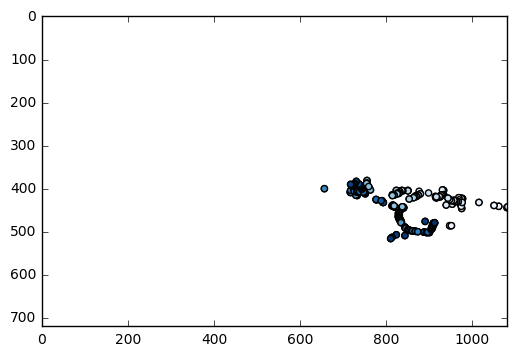

In [141]:
frames = [k for k in to_draw.keys()]
x = [x[1][0] for x in to_draw.values()]
y = [x[1][1] for x in to_draw.values()]
plt.xlim(0,1080)
plt.ylim(720,0)
plt.scatter(x,y, c = frames, cmap = 'Blues')

In [142]:
diff_pen_box_bot = [distance(x[i], y[i], x[i+1], y[i+1]) for i in range(len(frames)-1)]

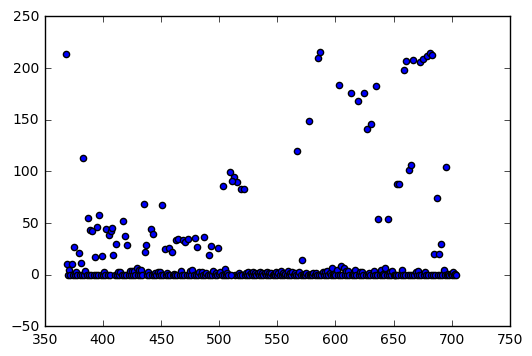

In [143]:
plt.scatter(frames[1:], diff_pen_box_bot)

In [144]:
print(np.mean(x))
print(np.mean(y))

854.578635015
439.727002967


SixYd Top

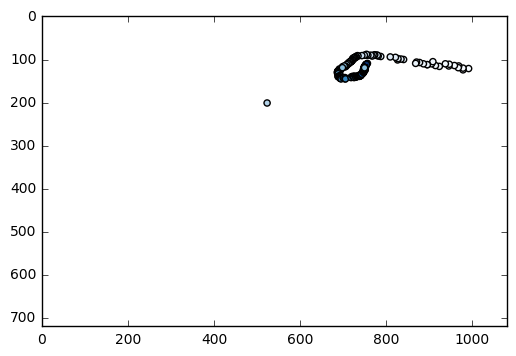

In [145]:
frames = [k for k in to_draw.keys()]
x = [x[2][0] for x in to_draw.values()]
y = [x[2][1] for x in to_draw.values()]
plt.xlim(0,1080)
plt.ylim(720,0)
plt.scatter(x,y, c = frames, cmap = 'Blues')

In [146]:
diff_six_yd_box_top = [distance(x[i], y[i], x[i+1], y[i+1]) for i in range(len(frames)-1)]

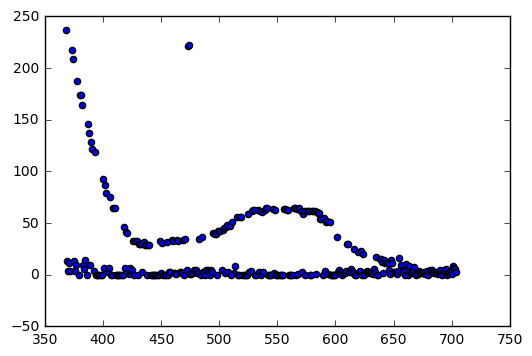

In [147]:
plt.scatter(frames[1:], diff_six_yd_box_top)

In [148]:
print(np.mean(x))
print(np.mean(y))

749.365482234
119.187817259


SixYd Bot

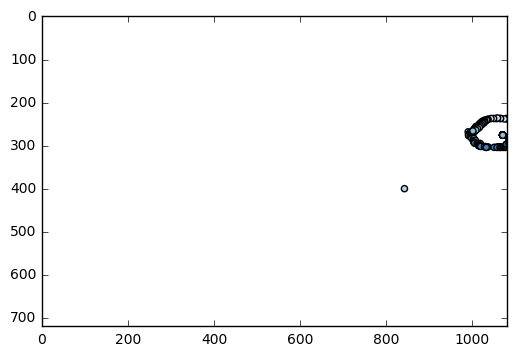

In [149]:
frames = [k for k in to_draw.keys()]
x = [x[3][0] for x in to_draw.values()]
y = [x[3][1] for x in to_draw.values()]
plt.xlim(0,1080)
plt.ylim(720,0)
plt.scatter(x,y, c = frames, cmap = 'Blues')

In [150]:
diff_six_yd_box_bot = [distance(x[i], y[i], x[i+1], y[i+1]) for i in range(len(frames)-1)]

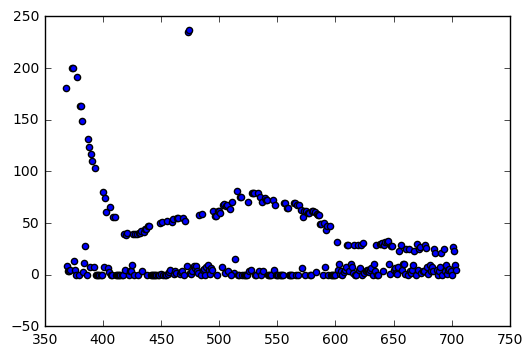

In [151]:
plt.scatter(frames[1:], diff_six_yd_box_bot)

In [152]:
print(np.mean(x))
print(np.mean(y))

1070.30964467
275.751269036


# Visualizing the projective transformation

In [59]:
rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

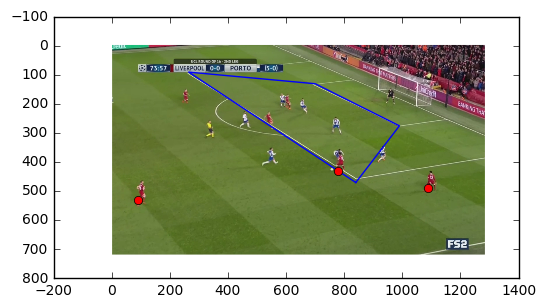

In [60]:
from skimage import transform as transf

#these are coordinates of the four corners!
bottom_left = [840, 470]
top_left = [265, 90]
top_right = [700, 130]
bottom_right = [990, 275]
#We instantiate a ProjectiveTransform and 
#ask it to find the projective transformation mapping points inside the quadrilateral to the unit square:

from skimage.transform import ProjectiveTransform
t = ProjectiveTransform()
src = np.asarray(
    [bottom_left, top_left, top_right, bottom_right])
#unit matrix
dst = np.asarray([[100-BOX_WIDTH, 20], [100-BOX_WIDTH, 80], [95, (100+GOAL_AREA_HEIGHT)/2], [95, (100-GOAL_AREA_HEIGHT)/2]])
#dst = np.asarray([[0,0], [0,1], [1,1], [1,0]])

if not t.estimate(src, dst): raise Exception("estimate failed")
#Of course, by changing dst above, you can scale to a different rectangle than the unit square 
#or even to an entirely different quadrilateral).

data = np.asarray([
    [90, 530], [780,430], [1090, 490]
])
data_local = t(data)
#We plot the input data and the transformed data to see the transformation working:
plt.figure()
plt.imshow(rgb)
plt.plot(src[[0,1,2,3,0], 0], src[[0,1,2,3,0], 1], '-')
plt.plot(data.T[0], data.T[1], 'o', color = 'r');


In [61]:
data_local

array([[ 69.26145044,  26.24338473],
       [ 84.29631944,  24.29902148],
       [ 88.51366133,  14.57402195]])

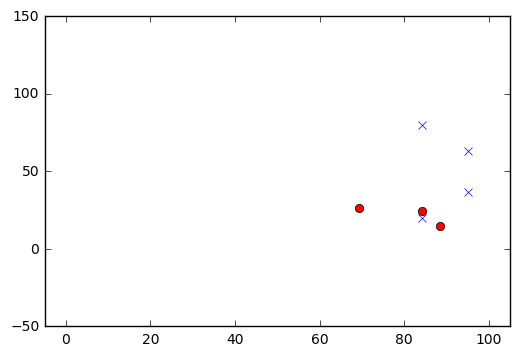

In [69]:
#84.3 is the leftmost x coord of the penalty box, 20 is the bottommost y coord of the penaltybox
# this works if they are going TO THE RIGHT
for coord in data_local:
    ax.add_artist(Ellipse((coord[0], coord[1]), 3/X_SIZE*100, 3/Y_SIZE*100,
                                  edgecolor='#9F0000',
                                  linewidth=2,
                                  facecolor='white',
                                  alpha=1,
                                  zorder=20))
    

#where is the player IN THE UNIT MATRIX
plt.figure()
plt.xlim(-5, 105)
plt.ylim(-50,150)
plt.plot(dst.T[0], dst.T[1], 'x')
plt.plot(data_local.T[0], data_local.T[1], 'o', color = 'r')
plt.show()

# DETECTING PLAYERS AND THEIR TEAM

In [25]:
video = cv.VideoCapture('example.mp4')

In [26]:
frame_width = int(video.get(3)) #get frame width from vid
frame_height= int(video.get(4)) #get frame height from vid
fps = video.get(5)
font = cv.FONT_HERSHEY_COMPLEX

In [27]:
out = cv.VideoWriter('colortracking.avi',cv.VideoWriter_fourcc('M','J','P','G'), fps, (frame_width,frame_height))

In [28]:
colors = []
player_coords = defaultdict(list)

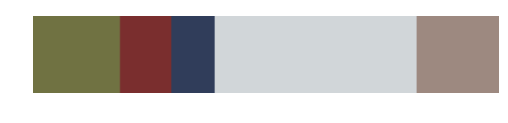

0


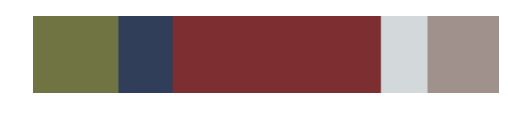

1


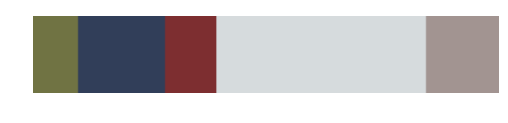

2


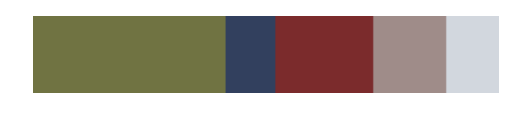

3


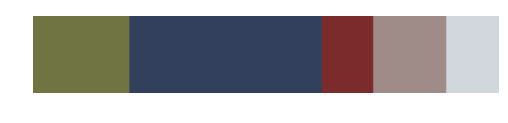

4


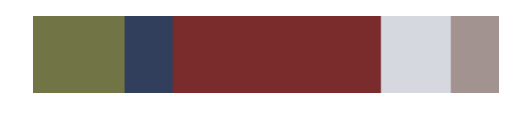

5


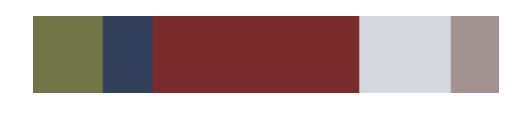

6


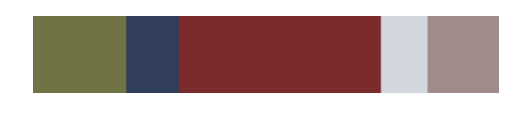

7


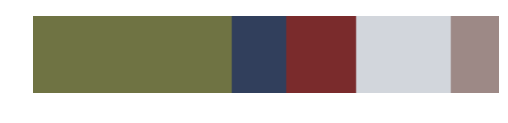

8


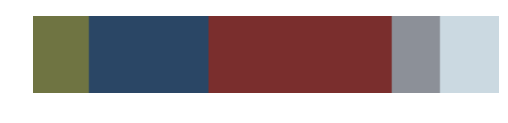

9


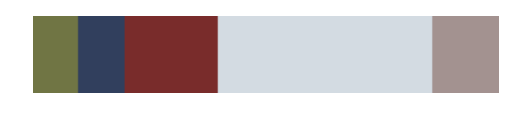

10


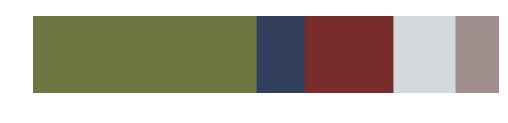

11


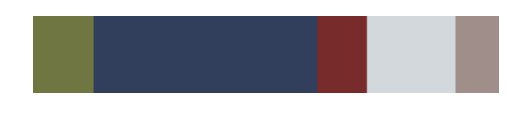

12


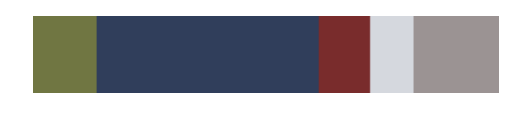

13


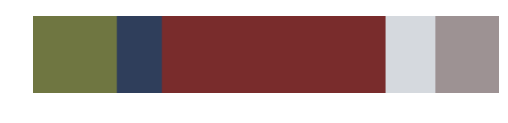

14


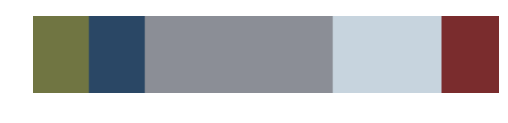

15


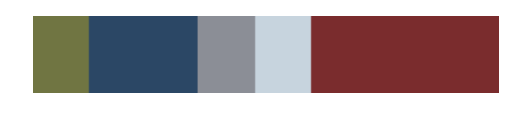

16


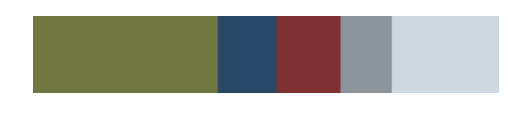

17


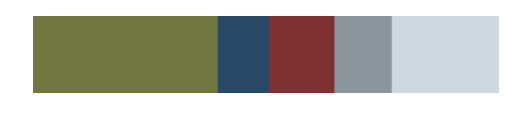

18


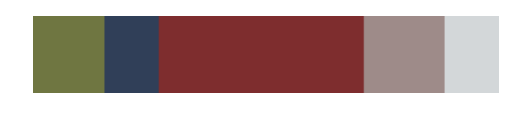

19


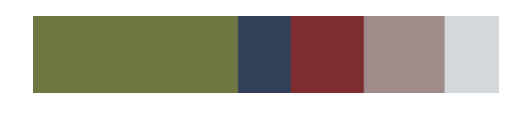

20


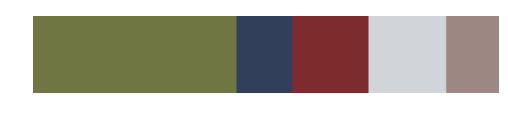

21


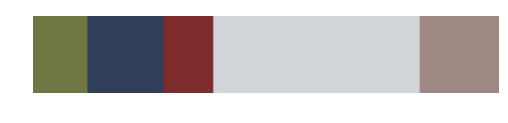

22


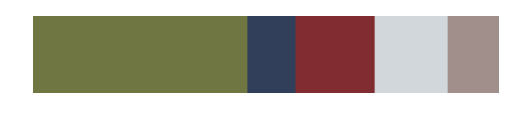

23


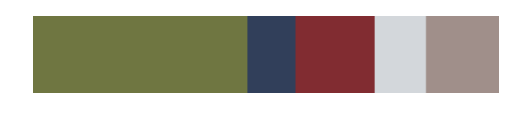

24


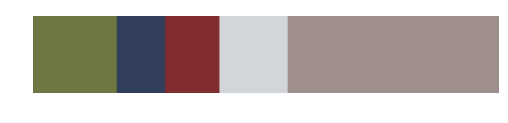

25


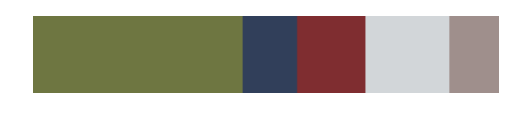

26


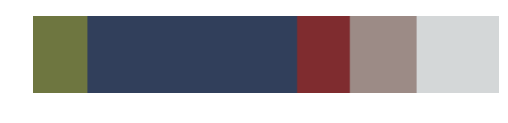

27


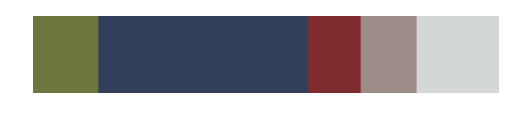

28


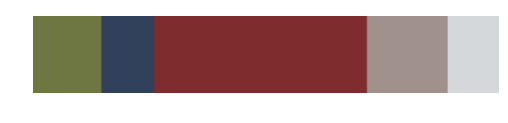

29


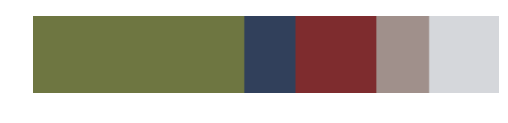

30


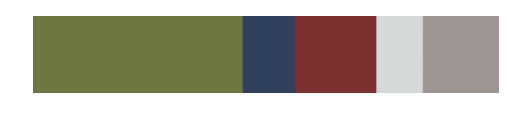

31


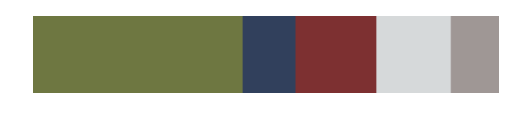

32


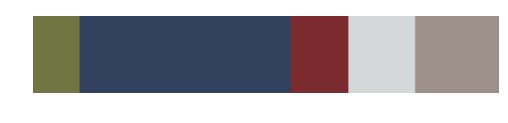

33


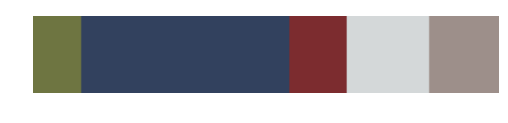

34


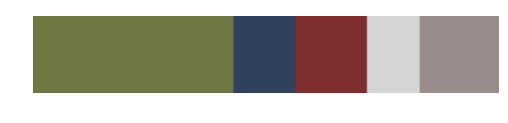

35


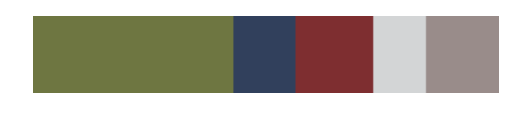

36


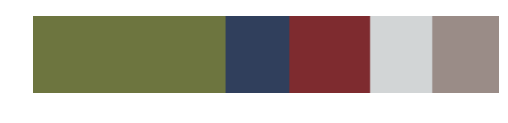

37


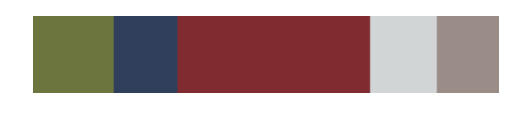

38


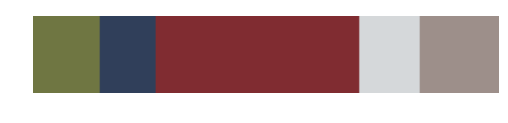

39


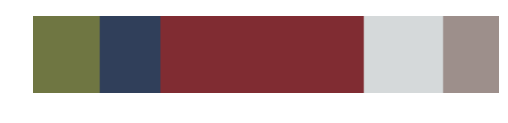

40


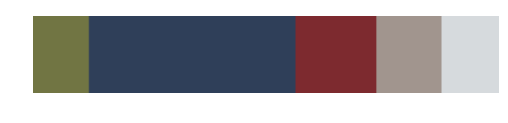

41


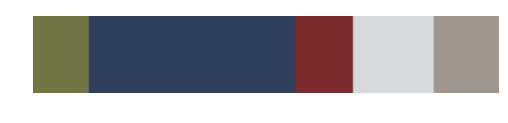

42


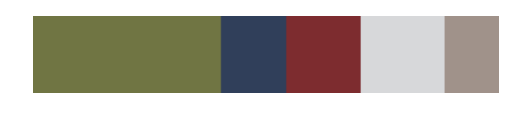

43


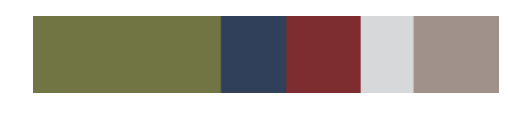

44


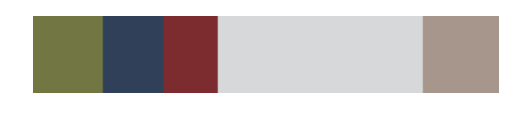

45


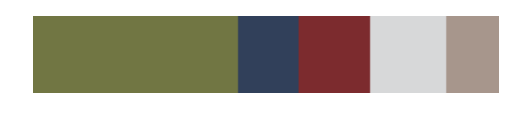

46


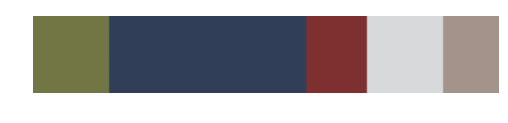

47


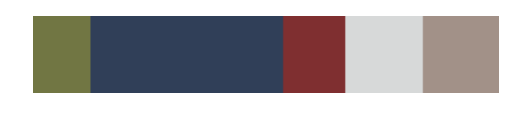

48


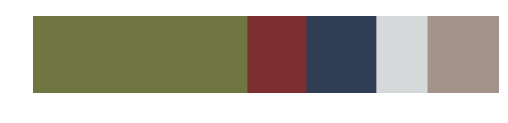

49


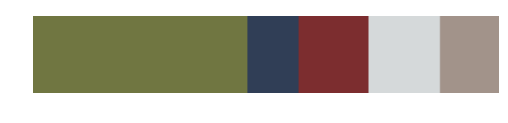

50


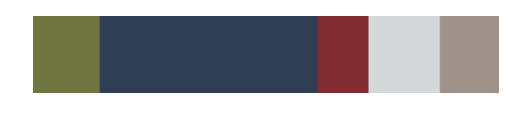

51


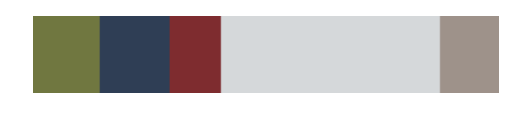

52


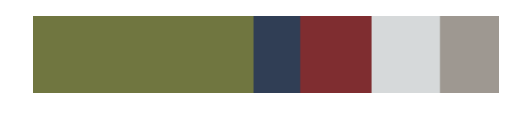

53


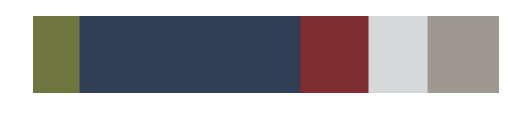

54


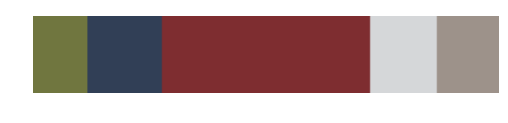

55


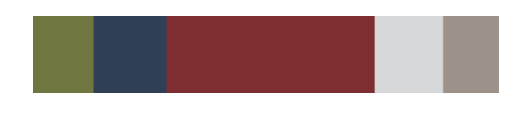

56


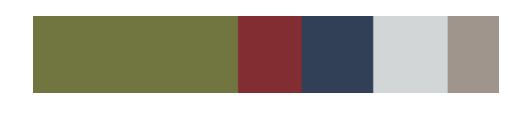

57


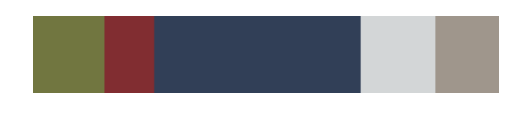

58


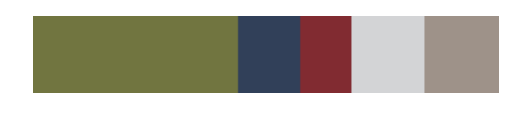

59


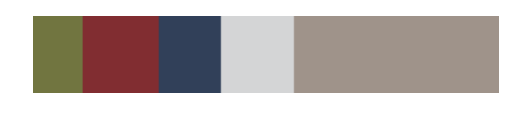

60


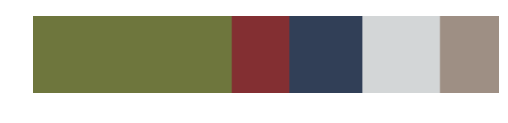

61


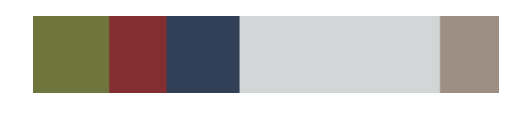

62


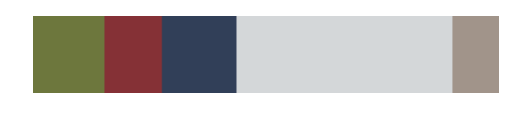

63


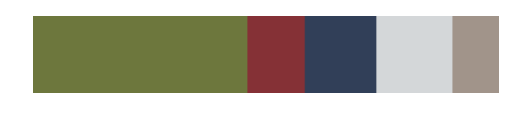

64


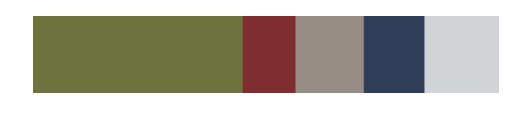

65


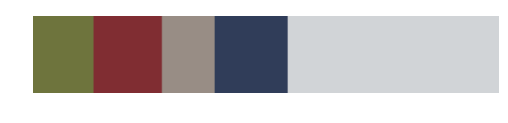

66


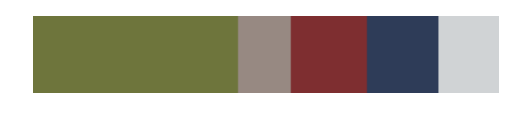

67


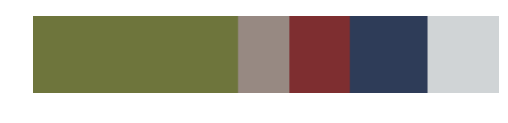

68


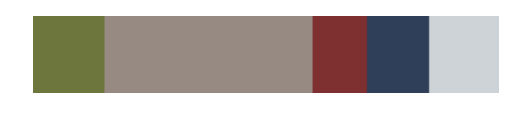

69


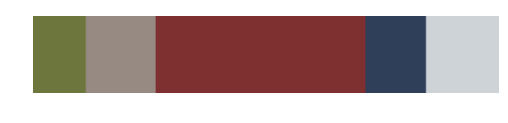

70


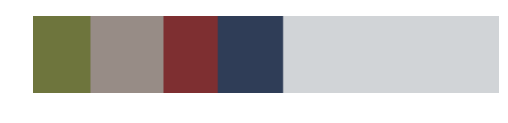

71


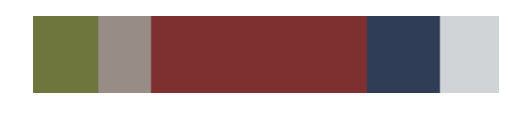

72


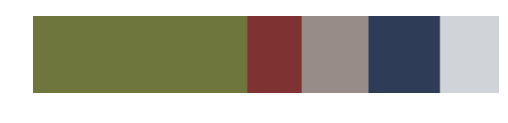

73


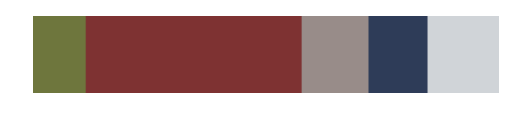

74


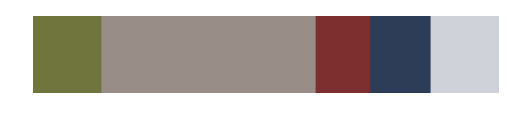

75


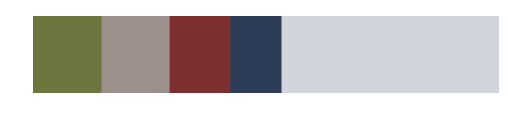

76


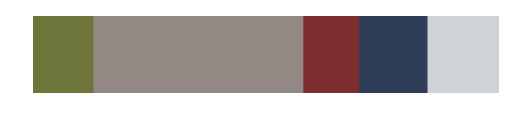

77


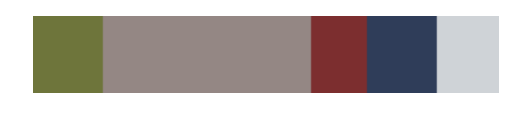

78


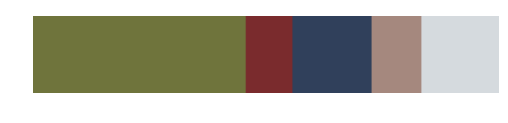

79


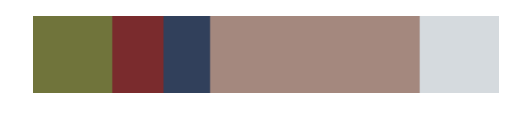

80


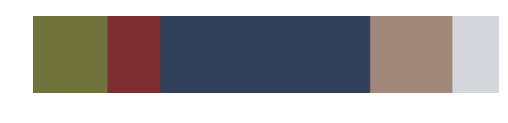

81


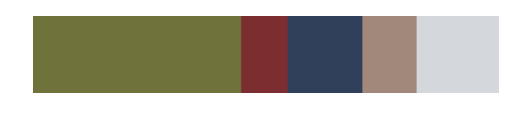

82


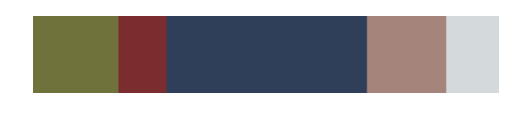

83


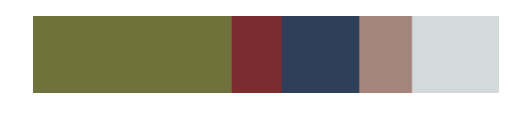

84


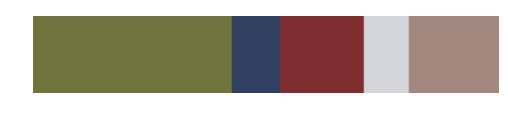

85


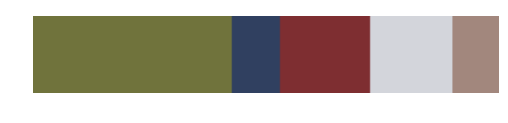

86


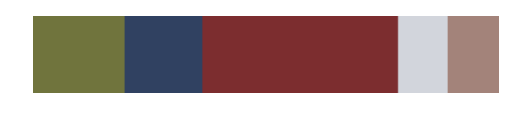

87


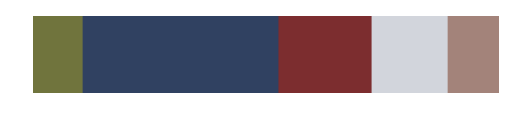

88


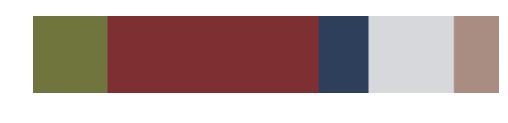

89


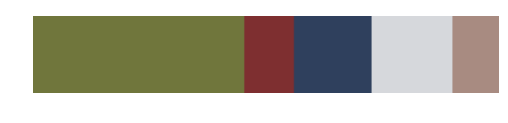

90


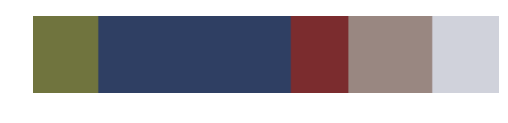

91


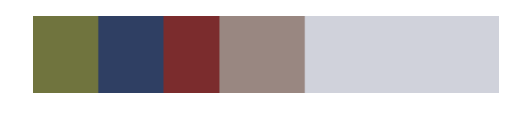

92


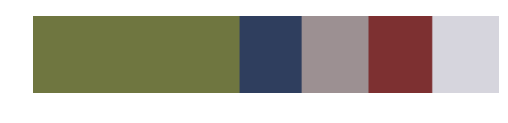

93


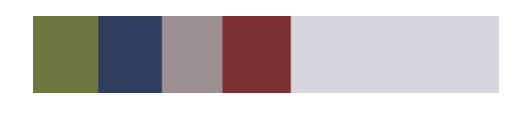

94


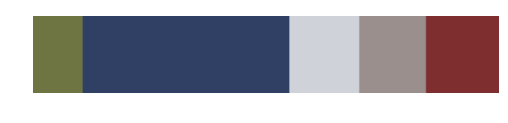

95


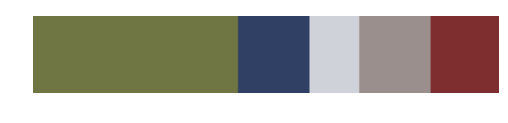

96


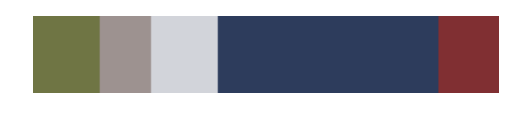

97


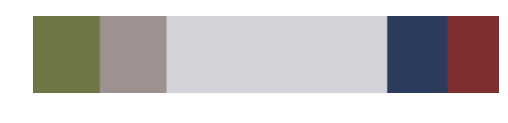

98


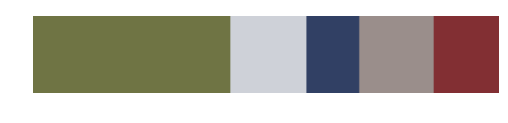

99


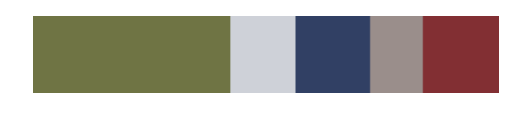

100


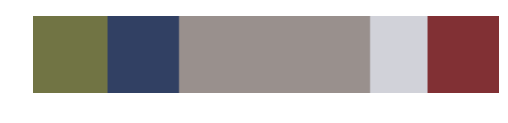

101


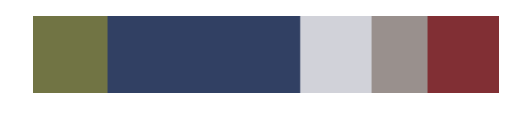

102


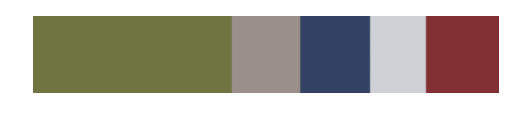

103


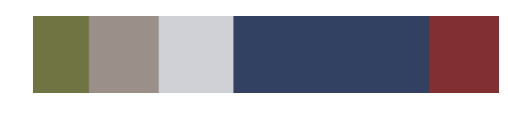

104


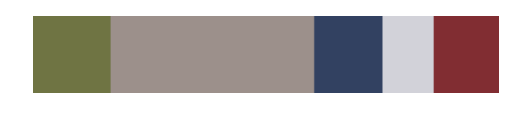

105


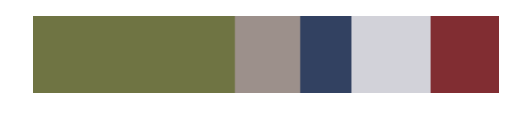

106


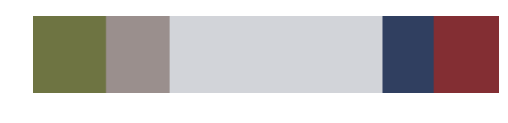

107


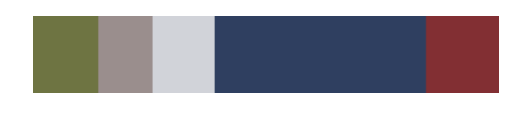

108


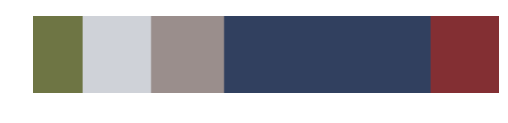

109


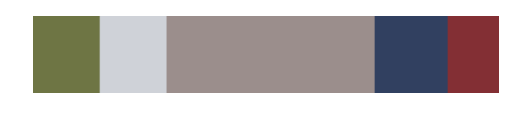

110


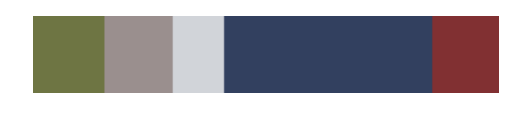

111


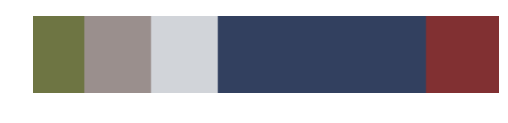

112


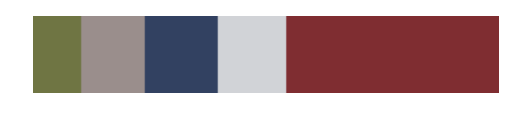

113


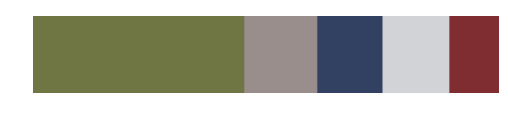

114


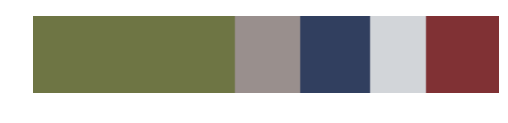

115


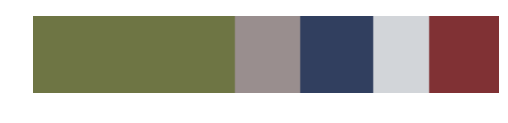

116


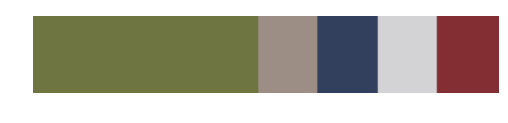

117


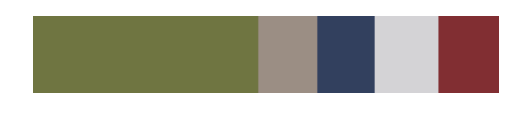

118


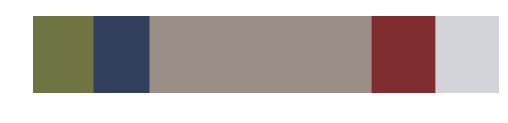

119


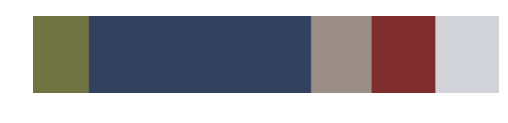

120


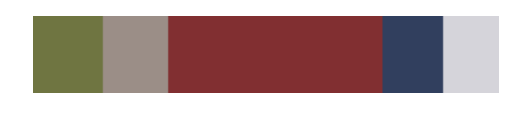

121


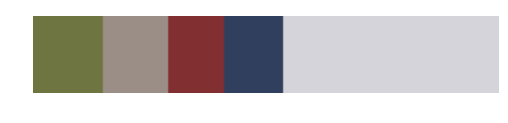

122


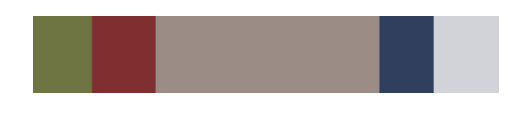

123


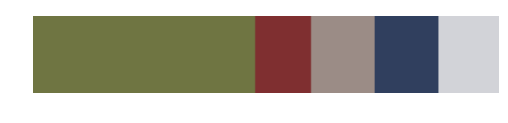

124


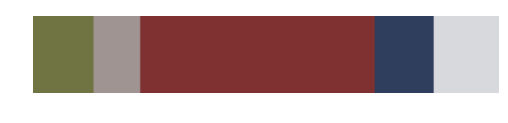

125


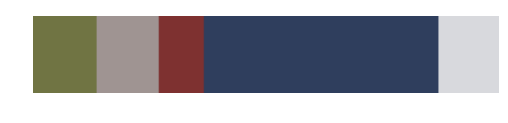

126


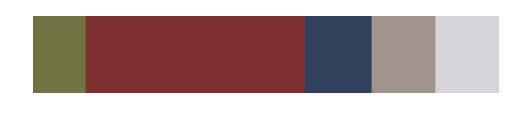

127


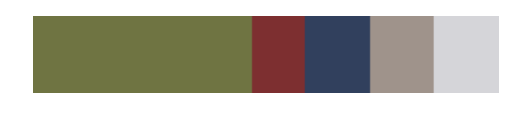

128


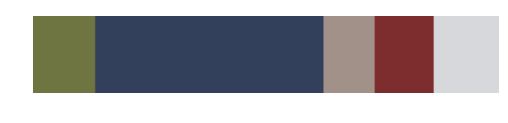

129


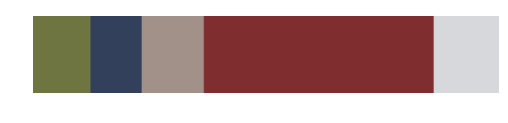

130


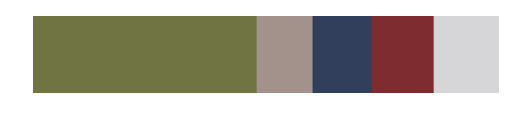

131


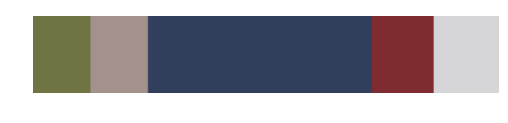

132


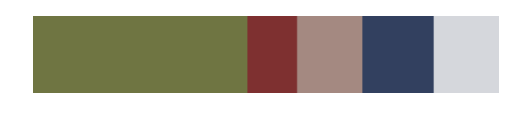

133


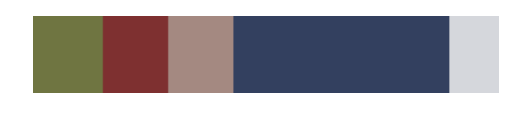

134


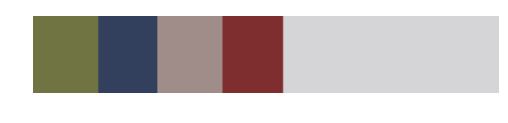

135


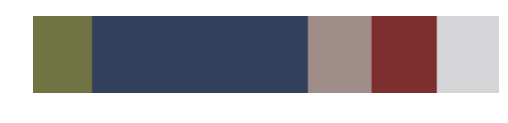

136


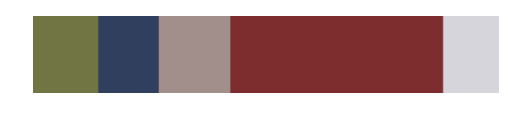

137


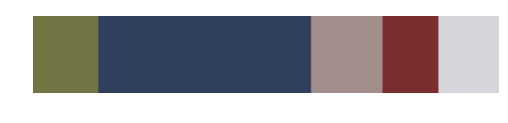

138


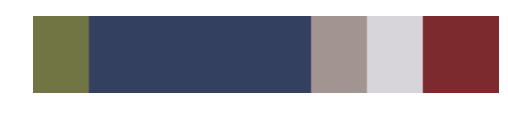

139


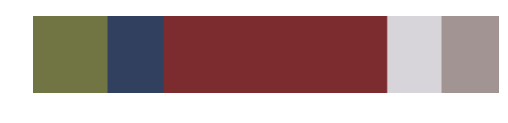

140


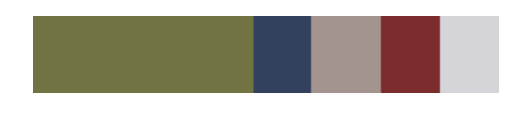

141


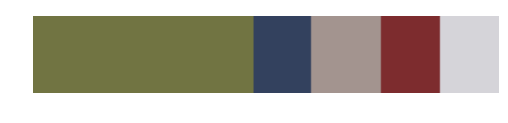

142


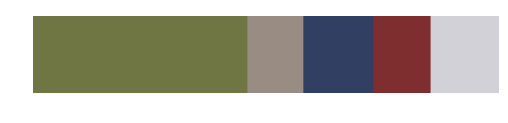

143


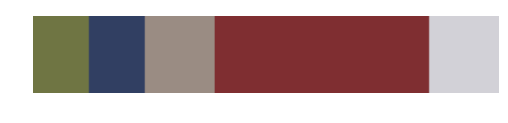

144


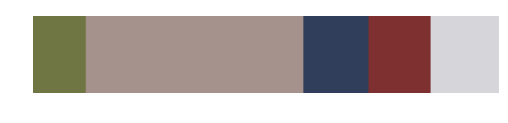

145


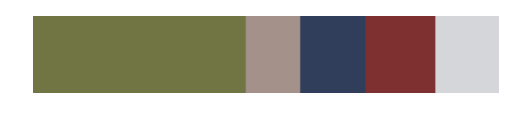

146


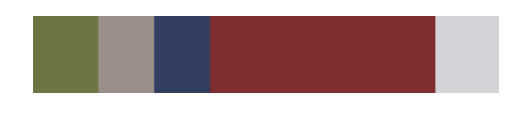

147


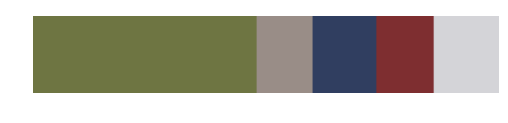

148


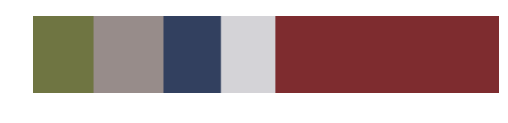

149


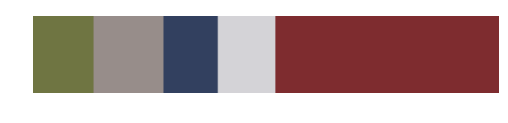

150


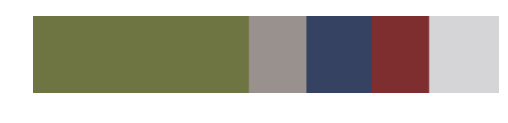

151


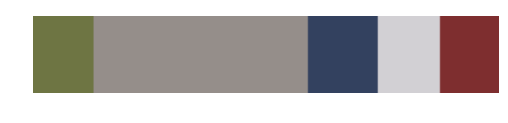

152


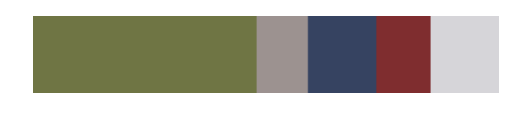

153


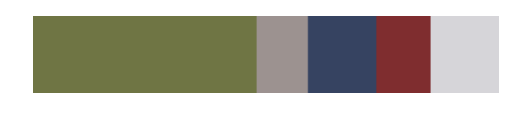

154


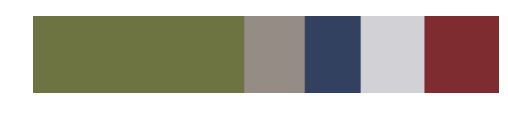

155


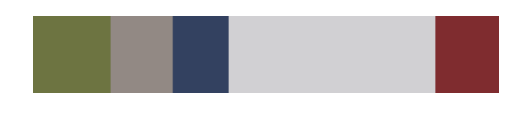

156


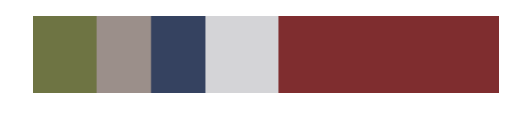

157


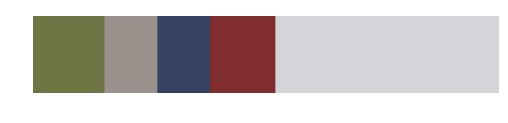

158


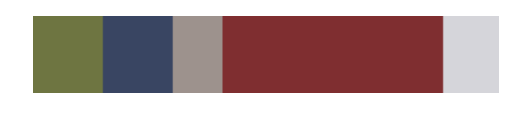

159


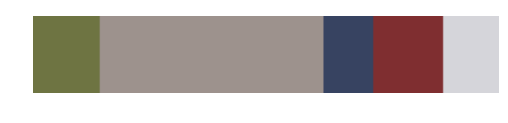

160


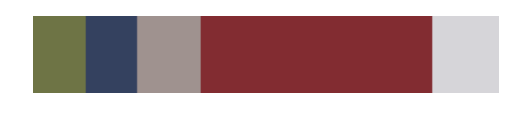

161


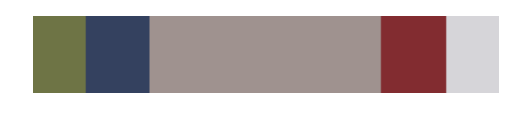

162


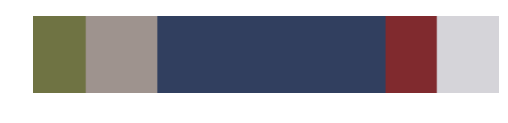

163


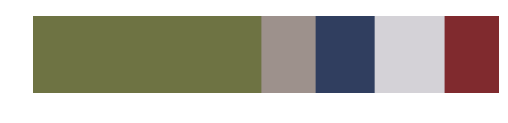

164


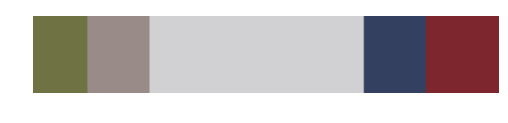

165


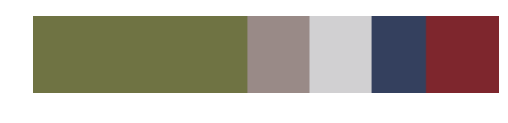

166


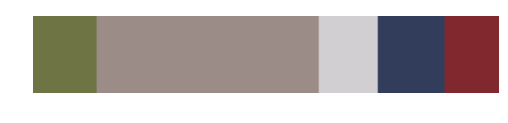

167


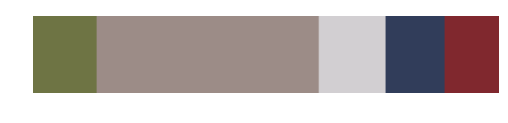

168


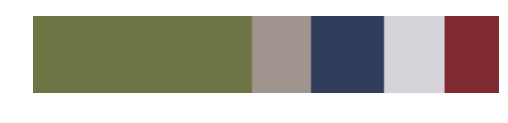

169


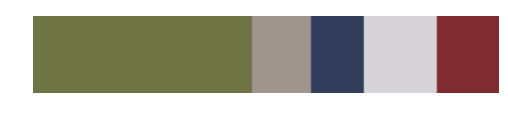

170


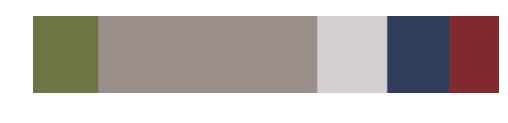

171


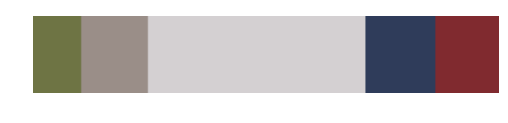

172


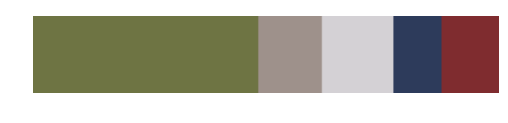

173


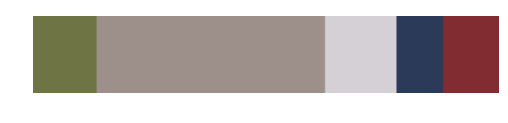

174


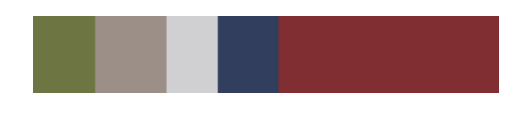

175


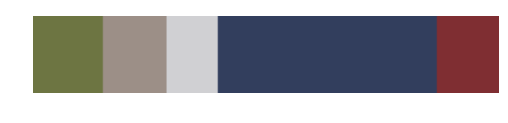

176


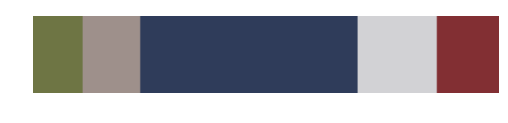

177


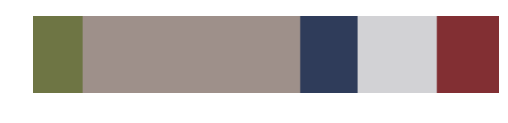

178


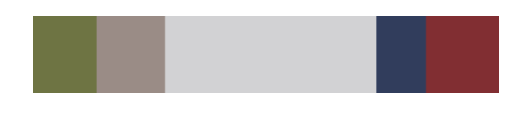

179


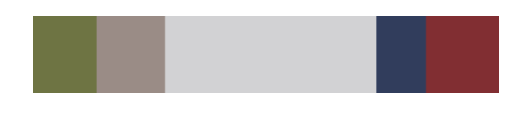

180


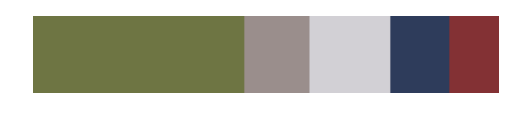

181


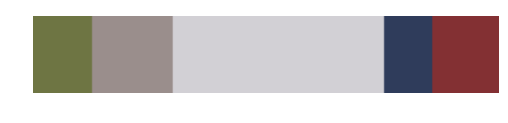

182


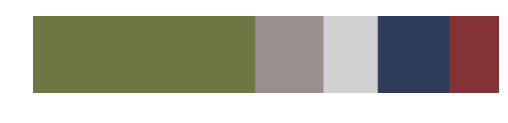

183


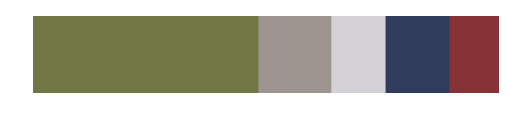

184


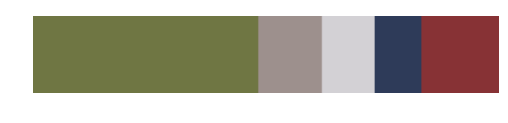

185


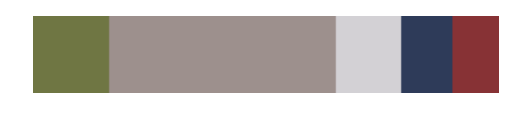

186


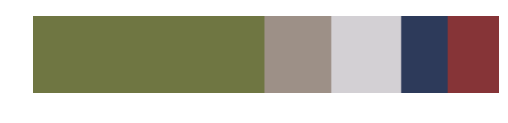

187


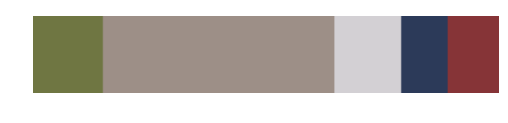

188


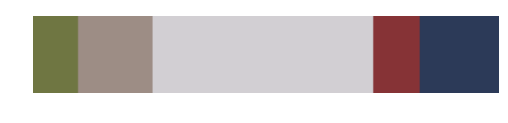

189


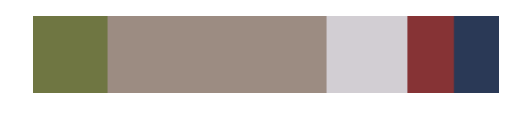

190


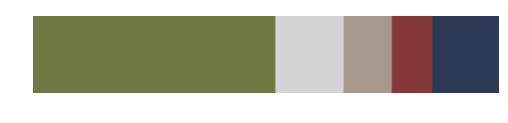

191


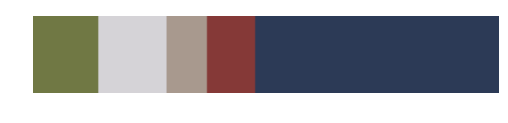

192


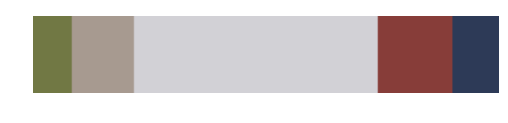

193


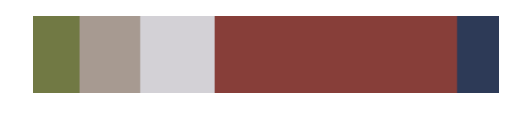

194


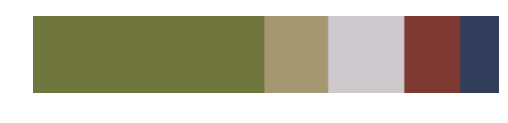

195


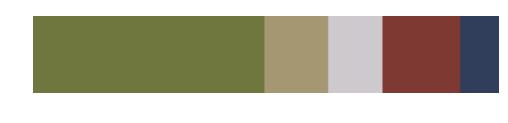

196


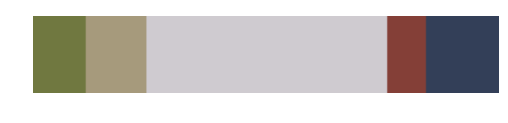

197


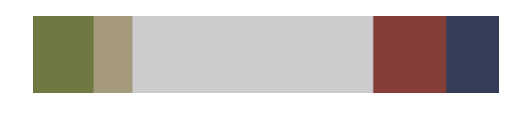

198


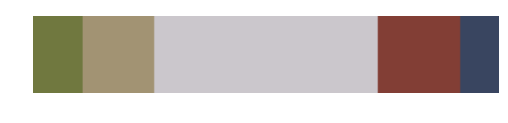

199


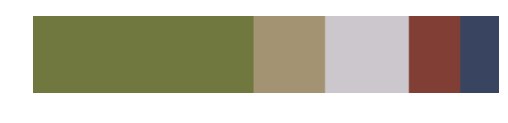

200


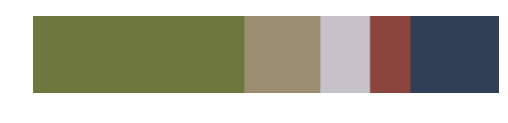

201


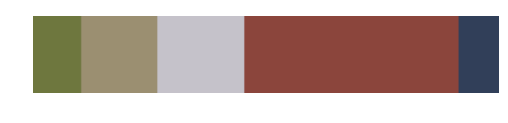

202


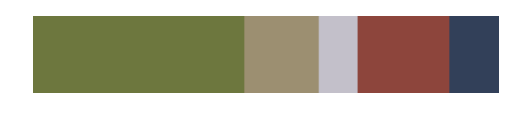

203


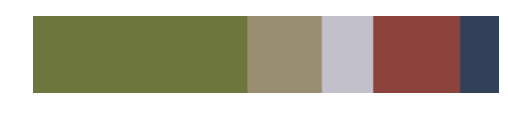

204


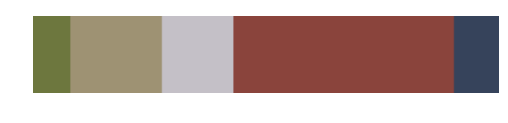

205


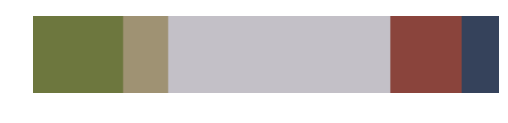

206


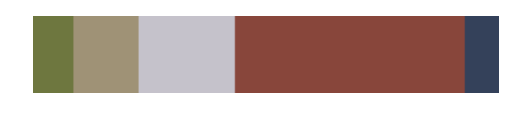

207


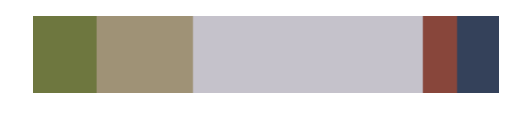

208


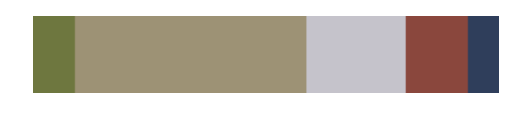

209


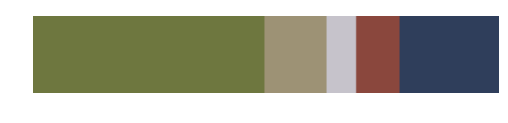

210


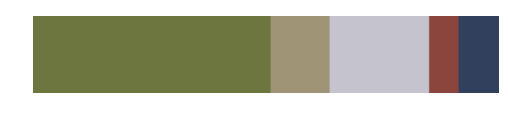

211


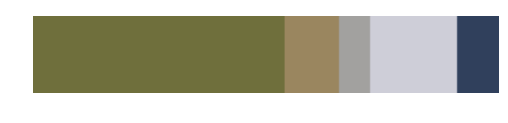

212


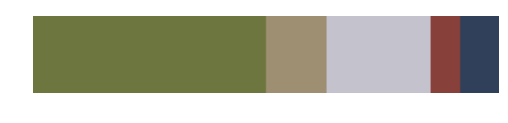

213


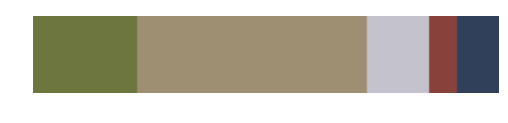

214


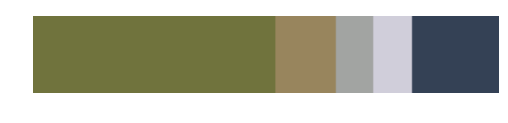

215


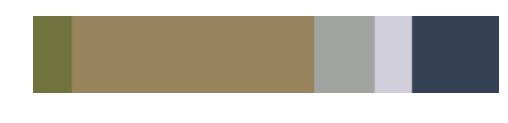

216


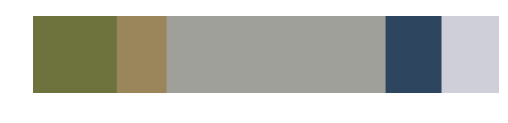

217


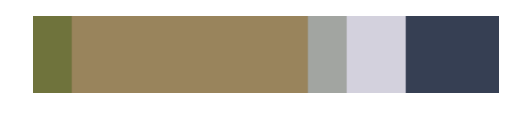

218


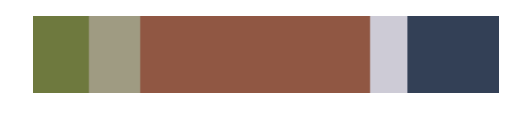

219


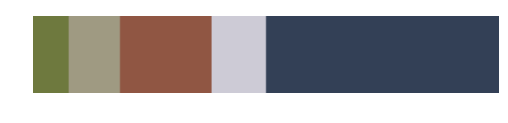

220


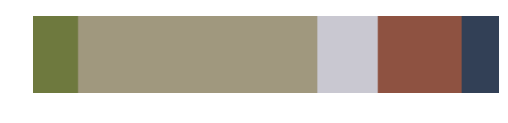

221


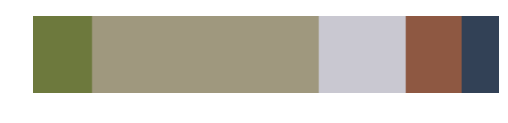

222


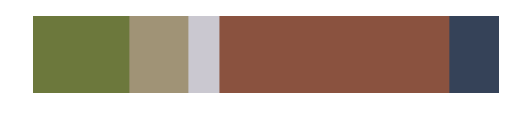

223


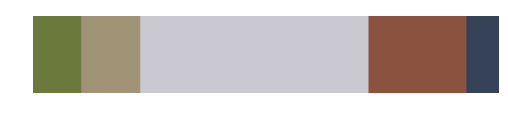

224


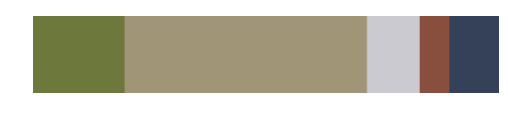

225


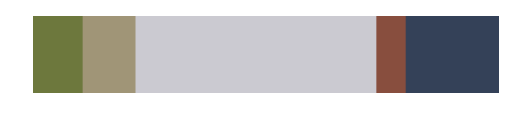

226


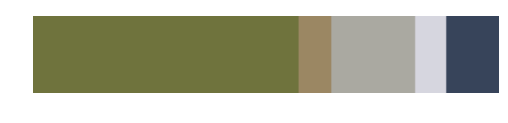

227


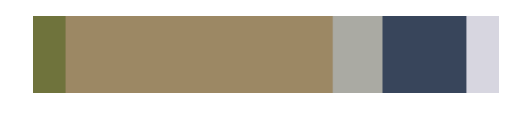

228


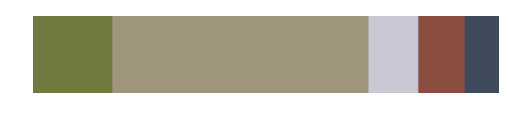

229


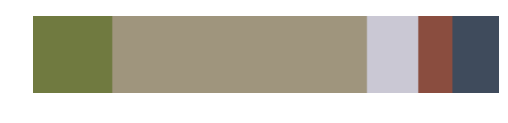

230


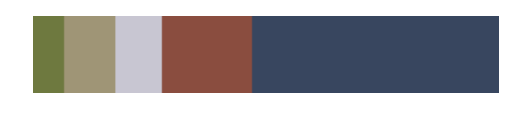

231


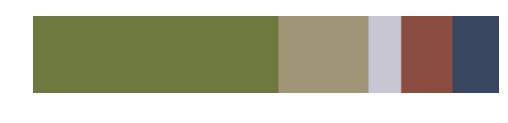

232


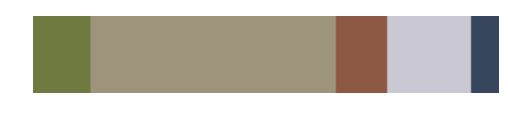

233


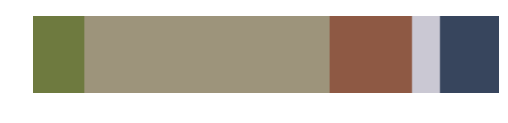

234


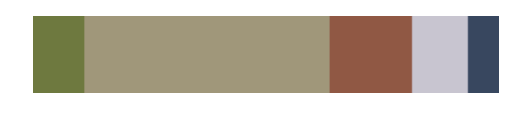

235


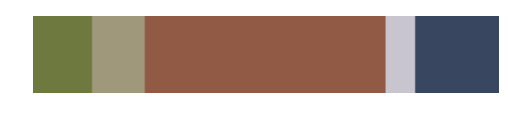

236


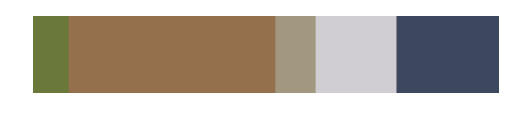

237


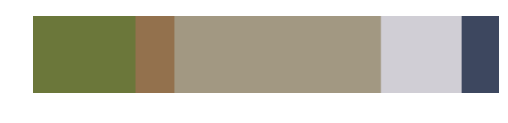

238


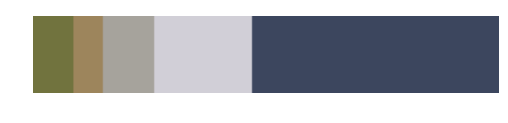

239


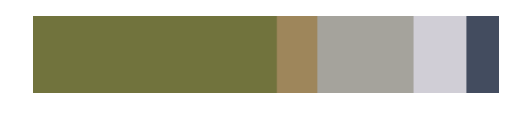

240


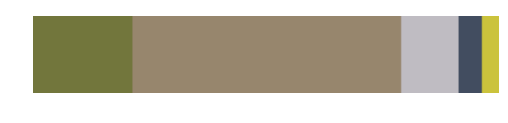

241


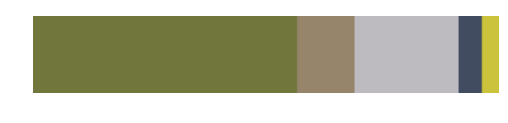

242


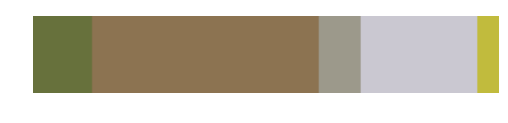

243


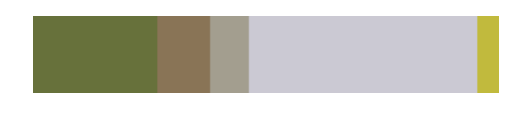

244


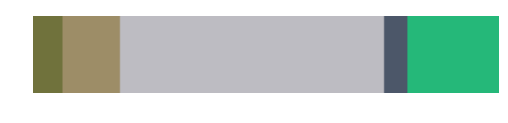

245


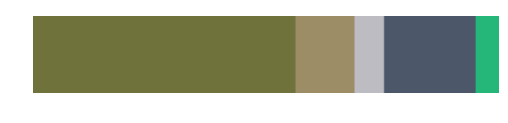

246


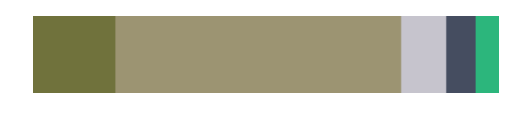

247


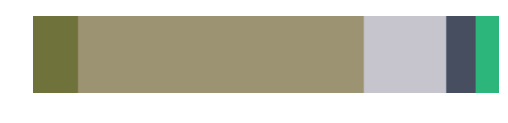

248


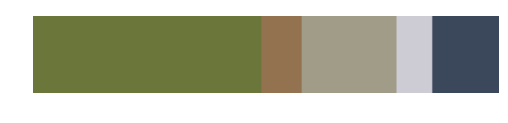

249


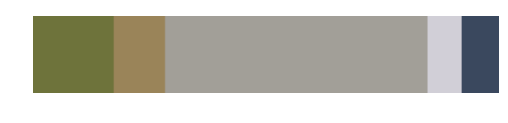

250


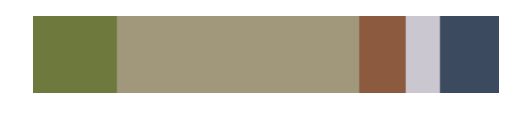

251


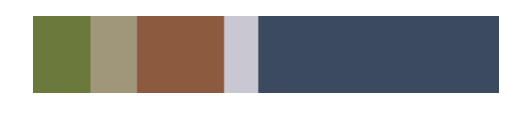

252


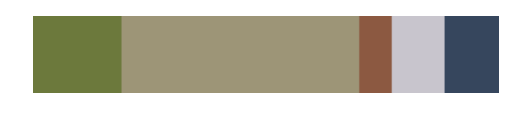

253


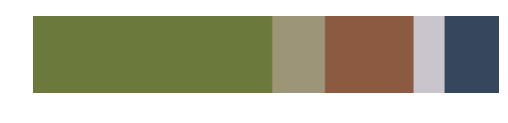

254


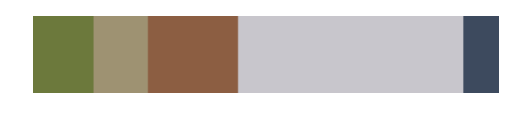

255


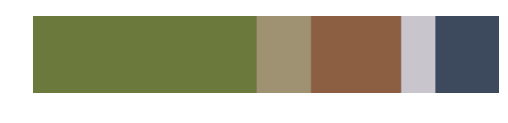

256


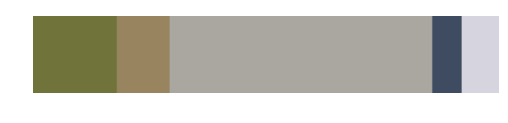

257


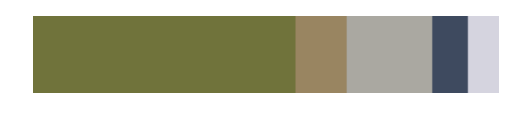

258


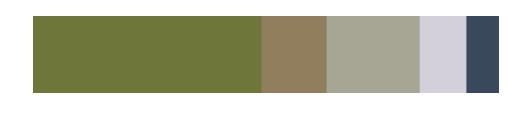

259


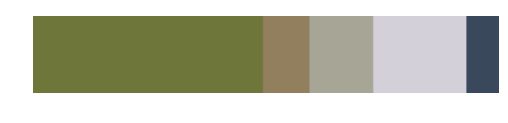

260


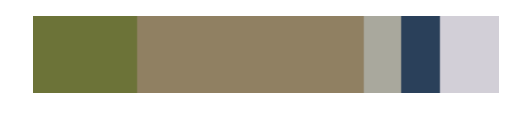

261


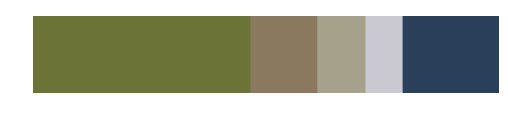

262


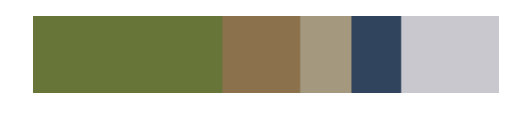

263


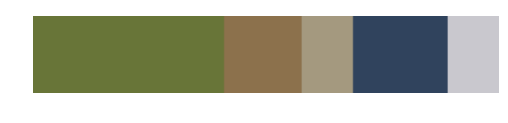

264


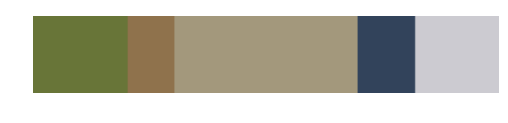

265


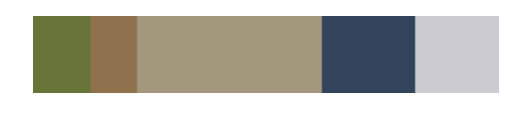

266


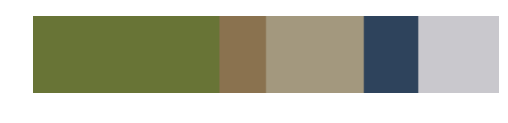

267


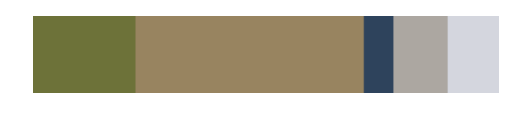

268


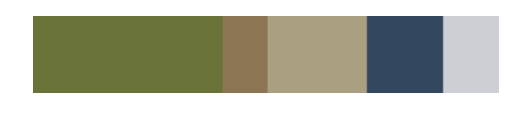

269


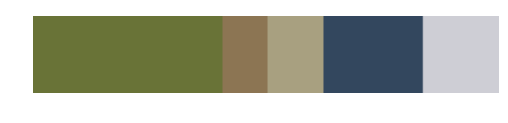

270


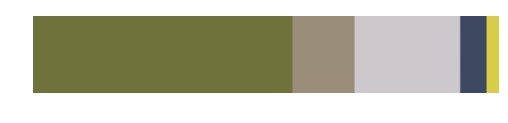

271


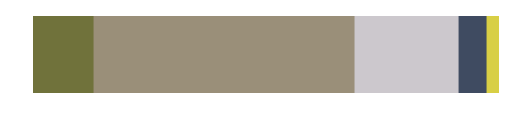

272


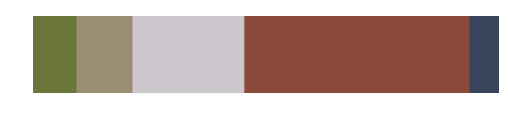

273


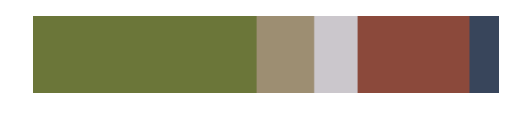

274


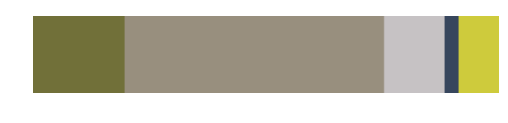

275


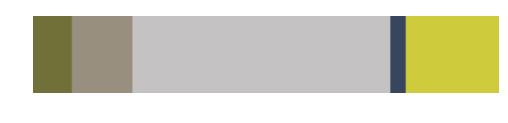

276


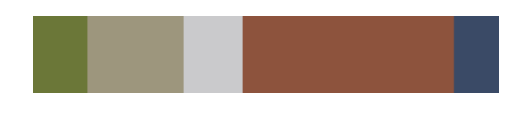

277


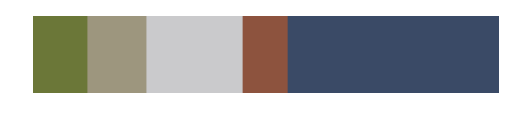

278


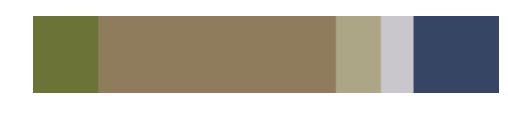

279


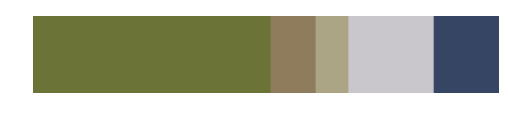

280


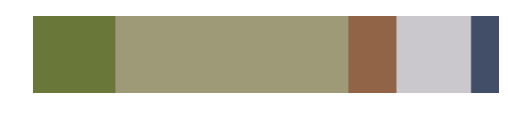

281


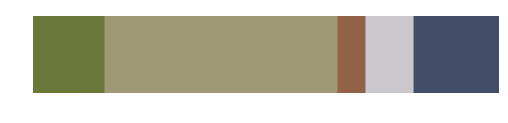

282


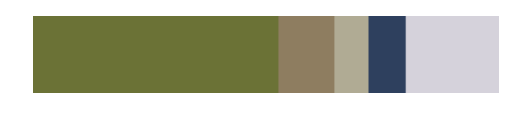

283


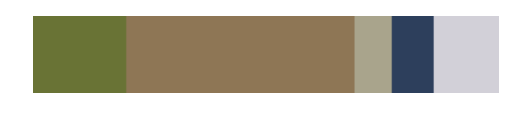

284


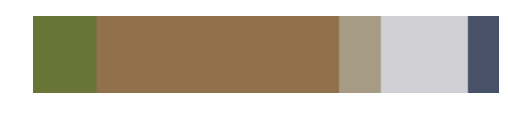

285


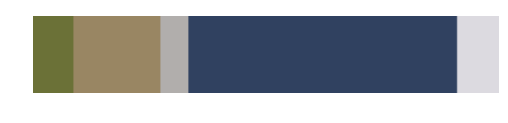

286


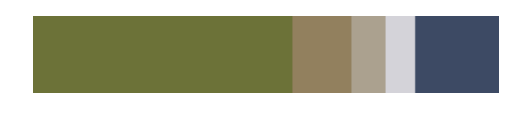

287


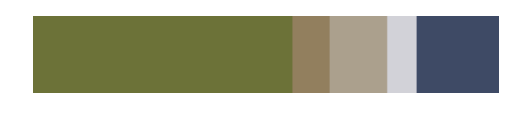

288


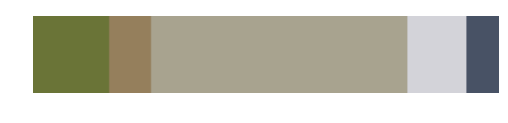

289


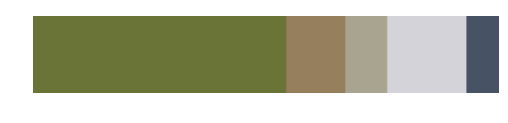

290


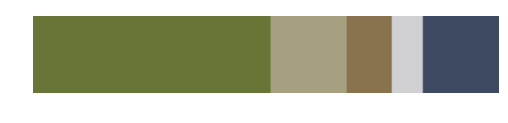

291


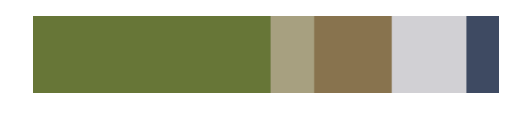

292


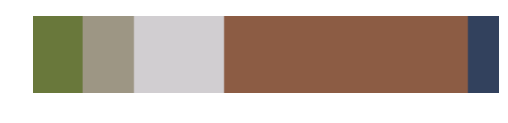

293


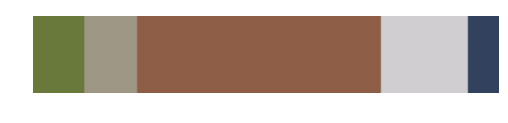

294


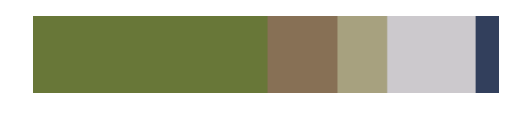

295


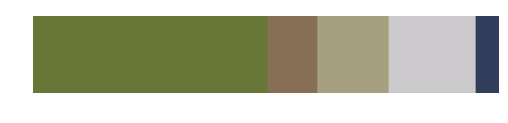

296


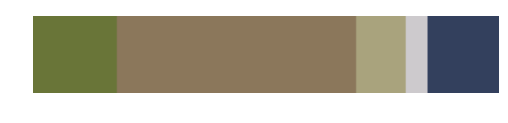

297


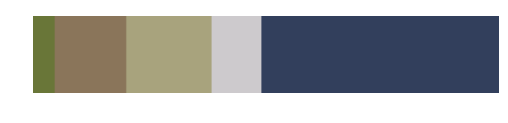

298


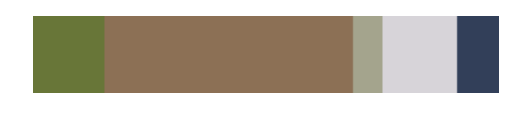

299


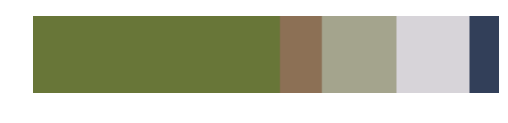

300


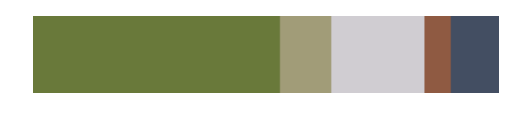

301


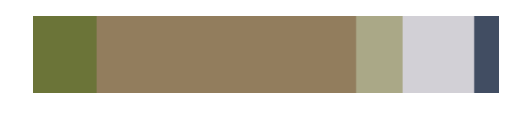

302


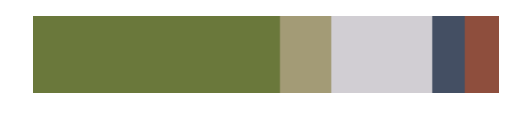

303


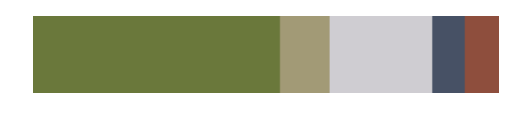

304


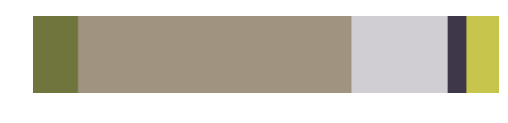

305


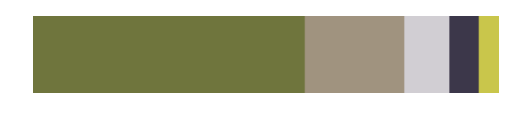

306


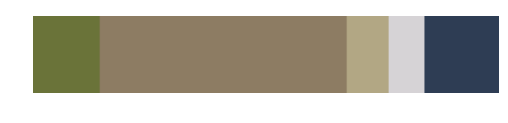

307


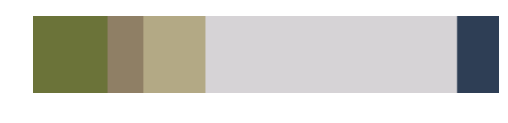

308


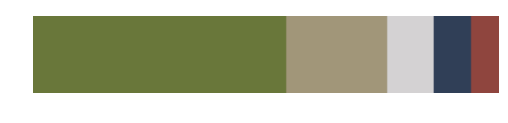

309


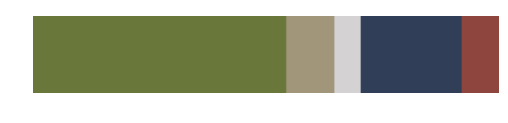

310


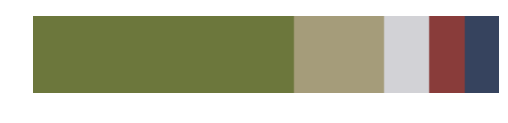

311


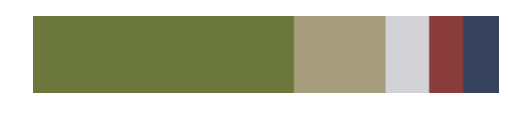

312


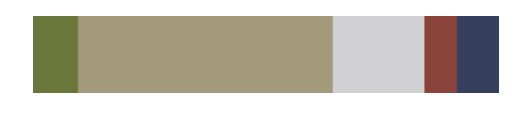

313


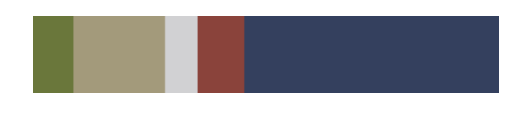

314


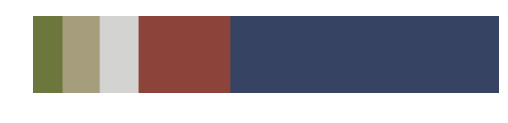

315


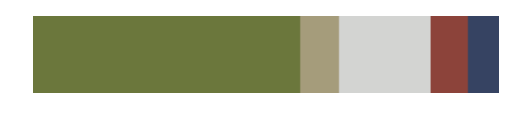

316


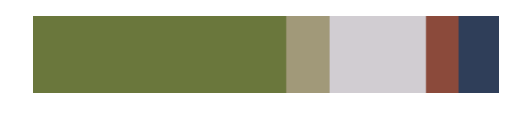

317


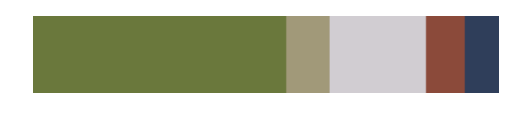

318


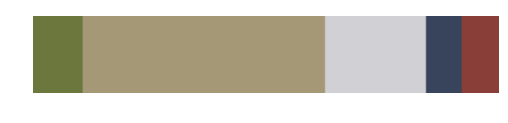

319


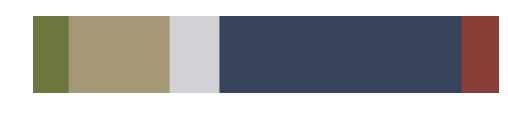

320


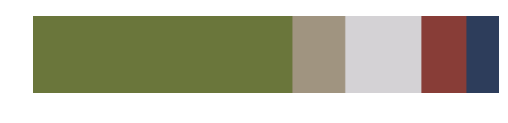

321


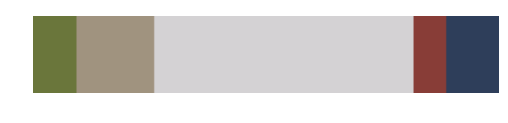

322


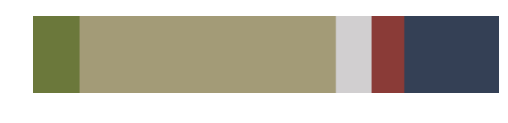

323


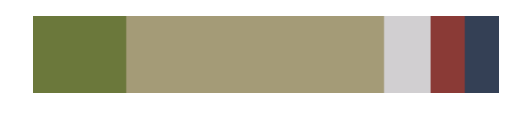

324


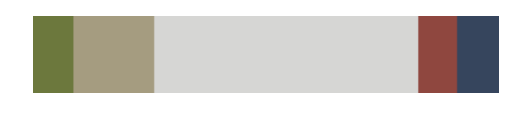

325


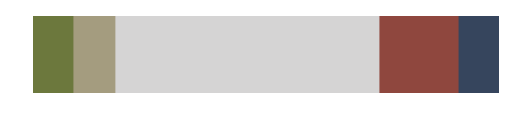

326


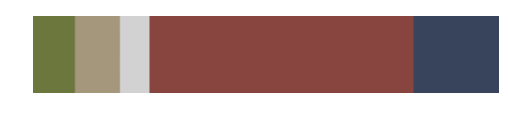

327


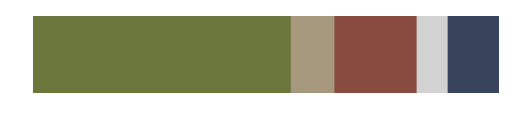

328


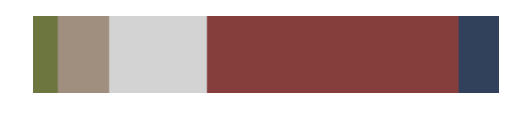

329


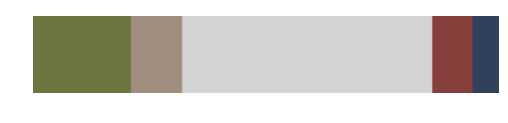

330


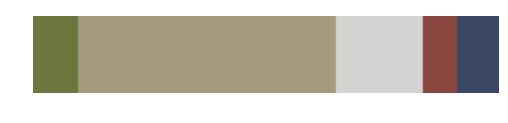

331


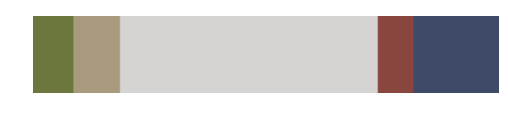

332


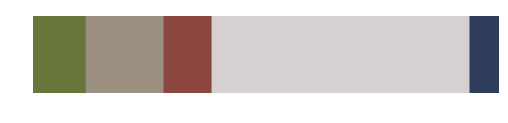

333


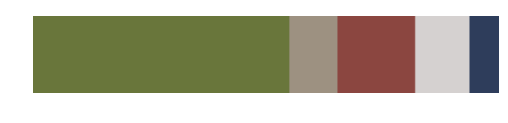

334


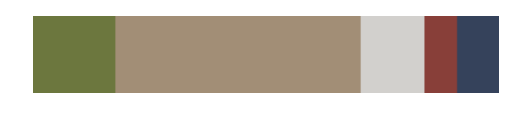

335


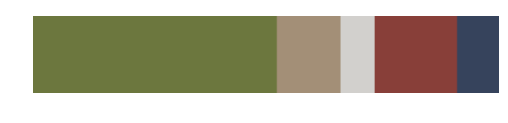

336


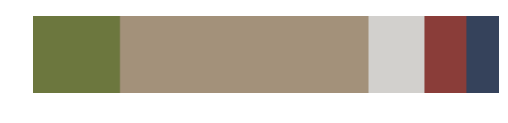

337


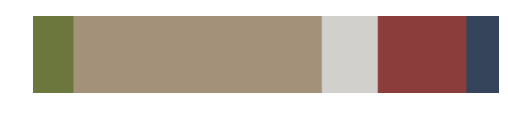

338


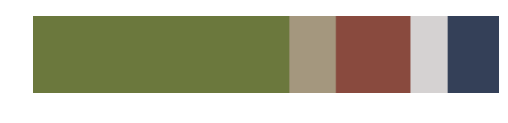

339


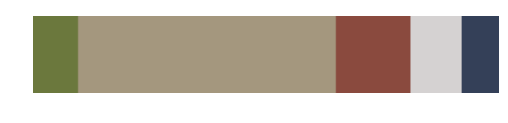

340


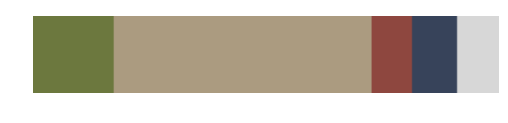

341


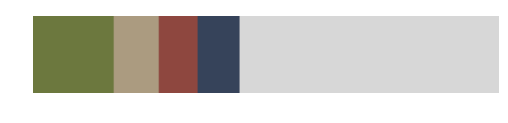

342


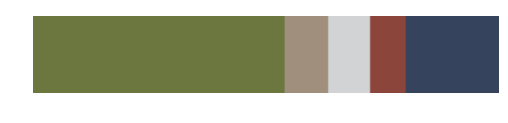

343


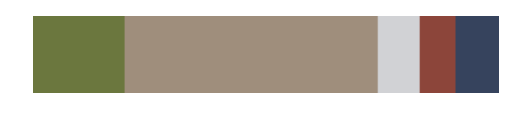

344


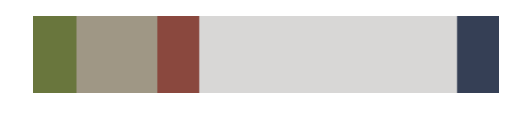

345


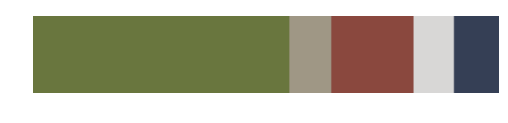

346


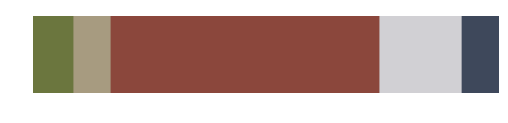

347


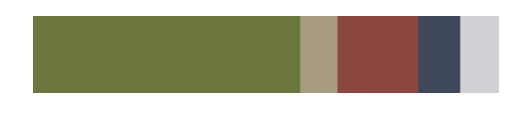

348


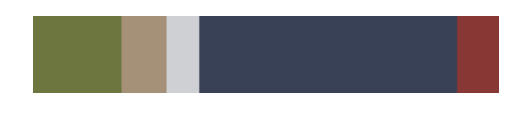

349


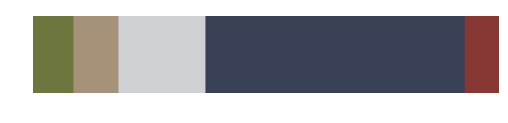

350


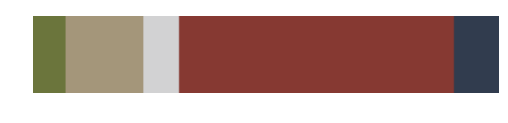

351


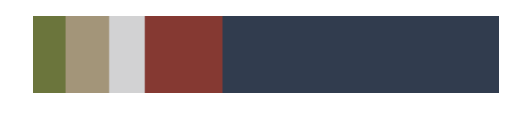

352


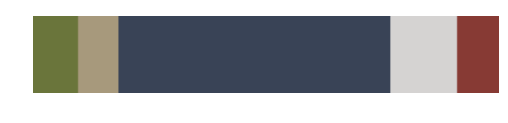

353


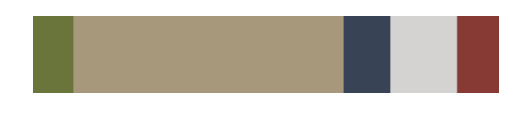

354


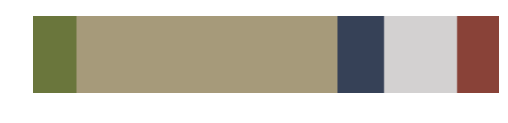

355


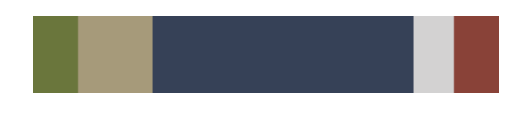

356


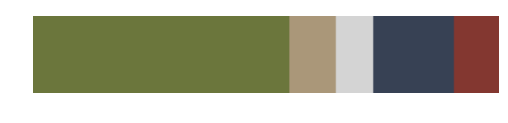

357


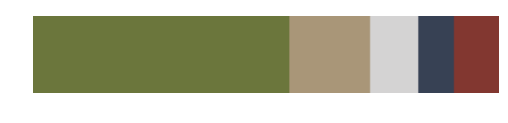

358


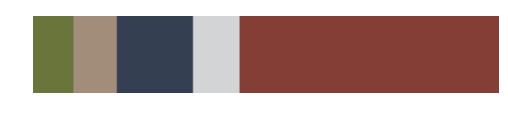

359


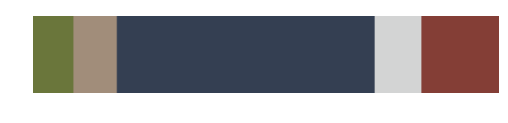

360


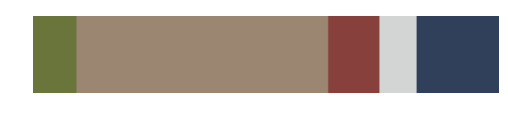

361


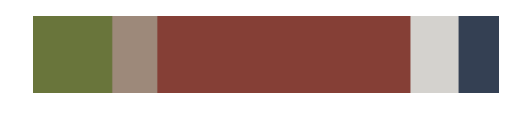

362


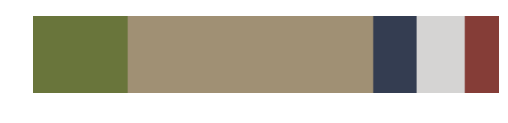

363


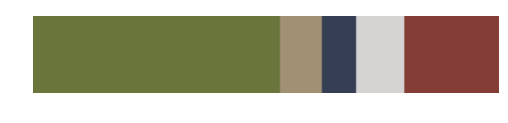

364


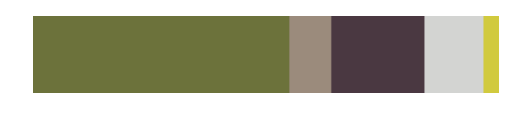

365


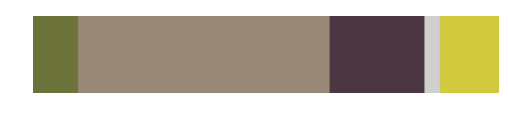

366


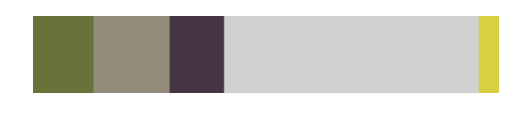

367


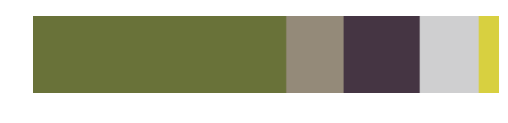

368


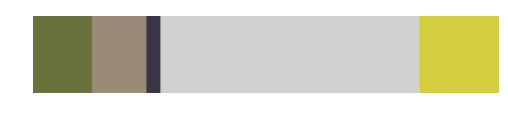

369


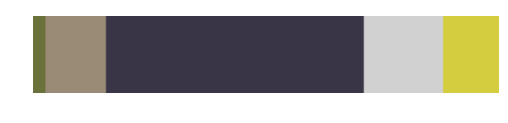

370


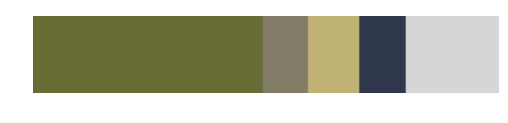

371


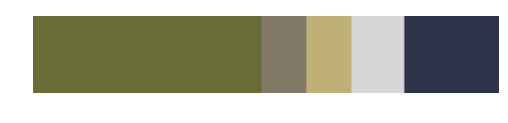

372


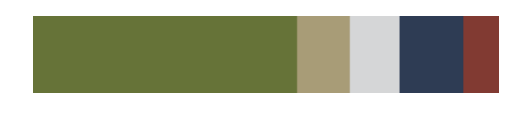

373


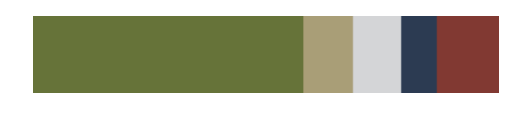

374


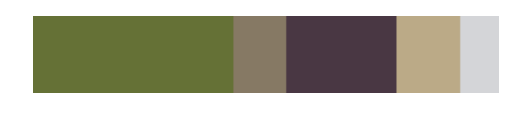

375


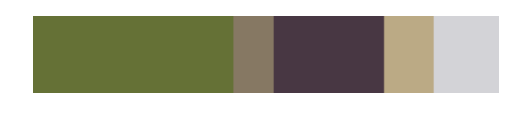

376


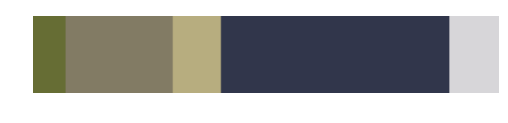

377


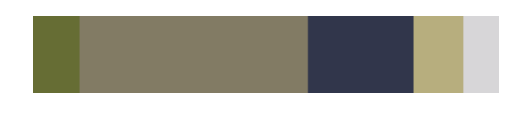

378


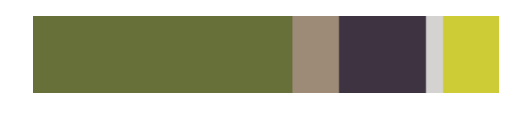

379


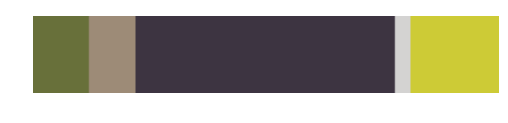

380


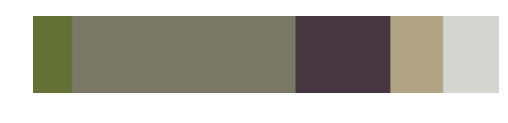

381


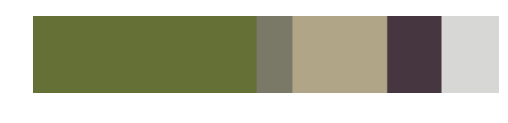

382


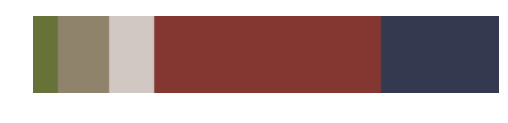

383


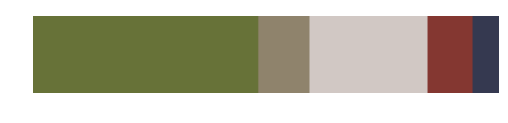

384


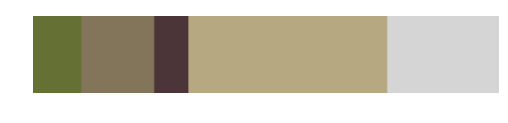

385


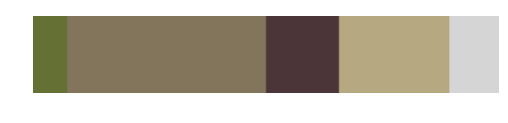

386


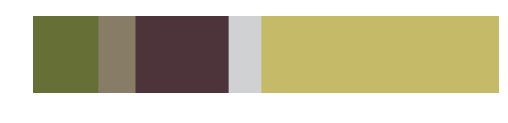

387


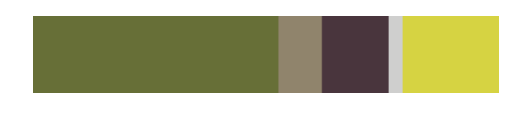

388


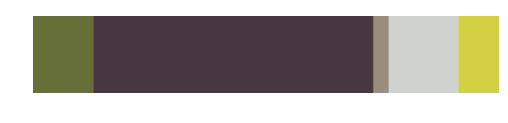

389


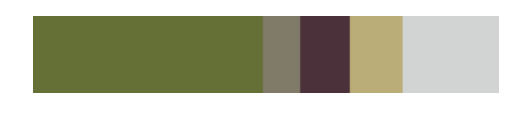

390


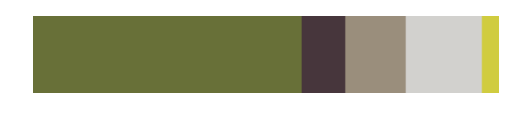

391


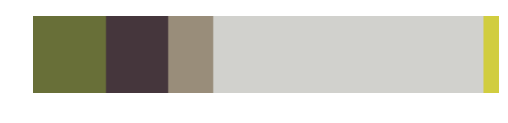

392


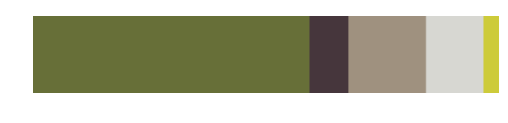

393


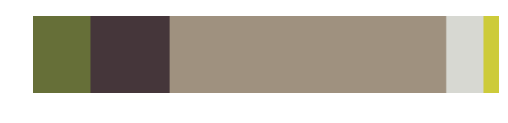

394


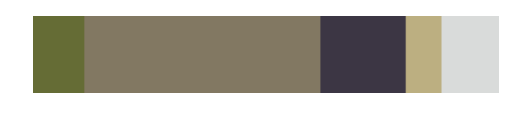

395


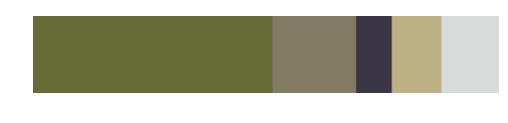

396


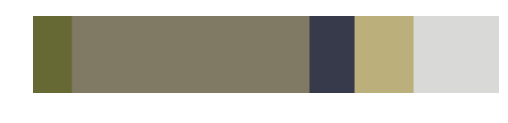

397


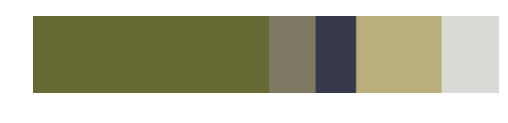

398


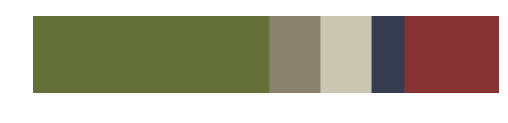

399


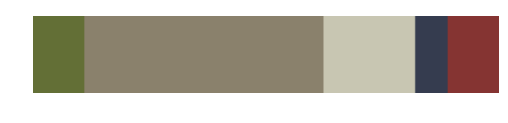

400


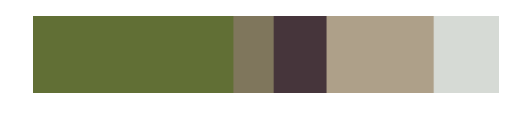

401


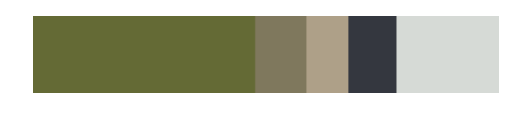

402


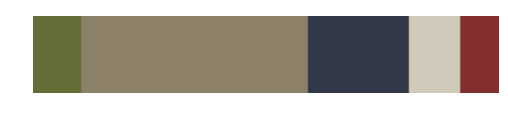

403


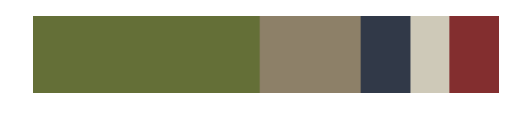

404


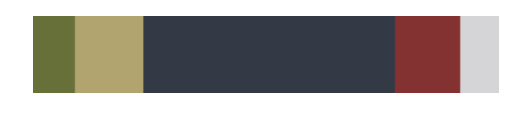

405


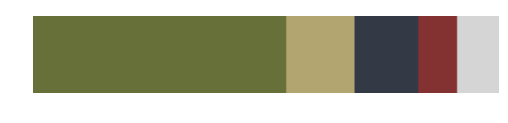

406


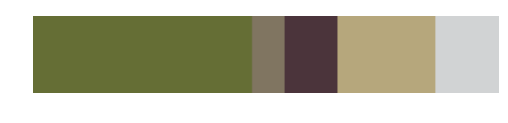

407


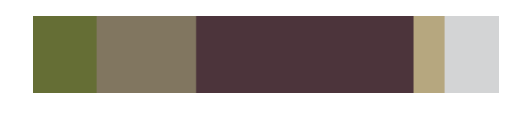

408


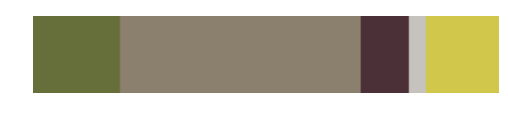

409


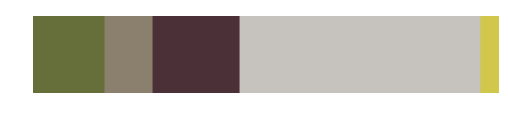

410


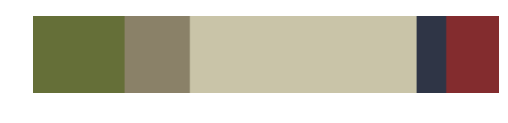

411


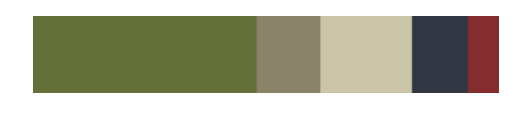

412


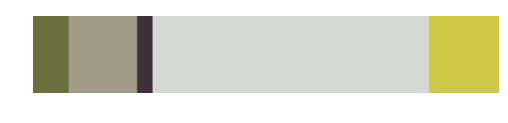

413


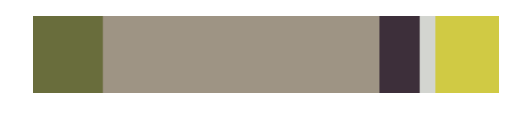

414


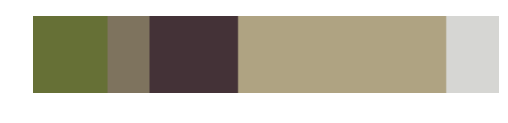

415


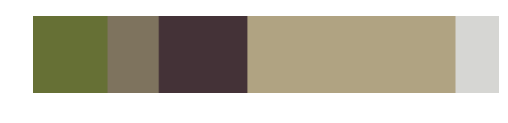

416


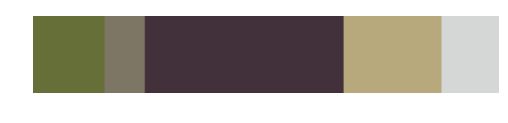

417


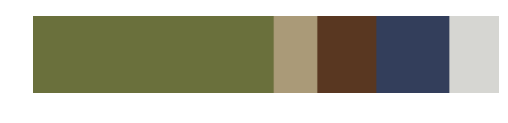

418


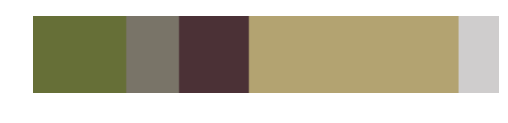

419


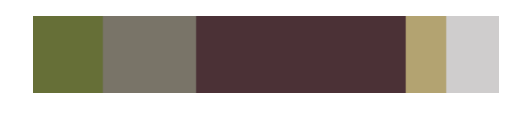

420


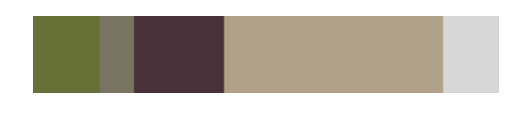

421


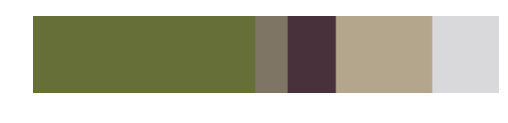

422


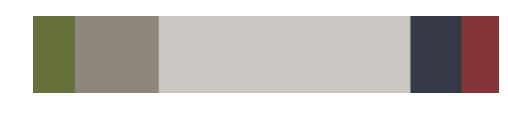

423


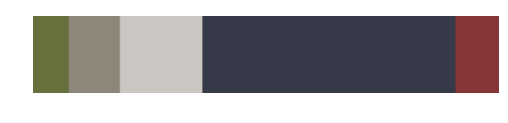

424


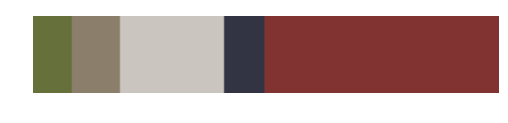

425


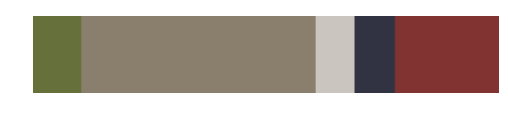

426


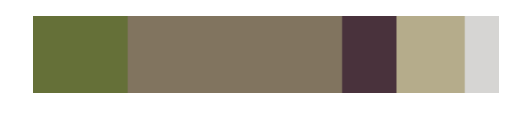

427


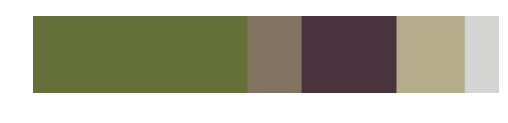

428


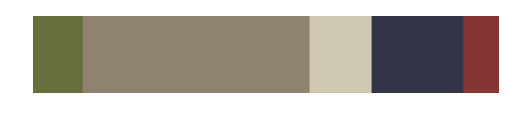

429


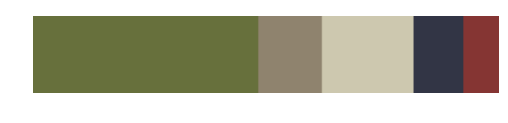

430


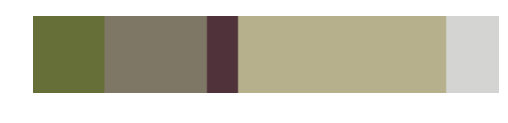

431


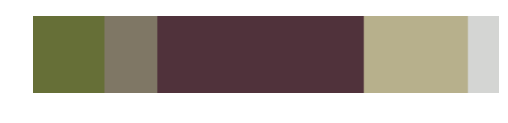

432


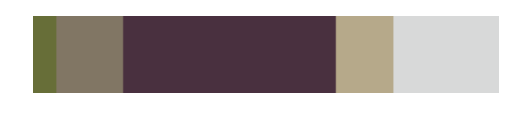

433


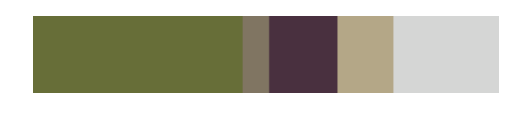

434


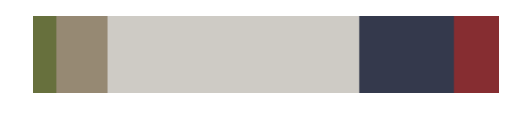

435


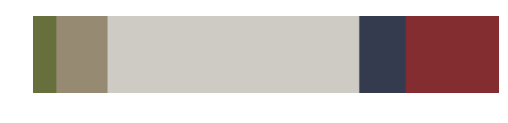

436


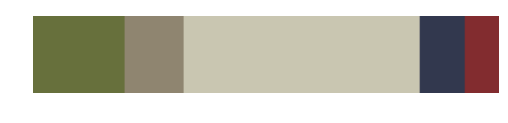

437


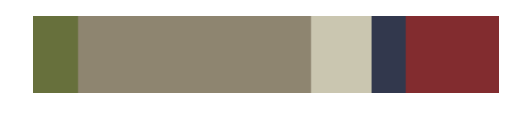

438


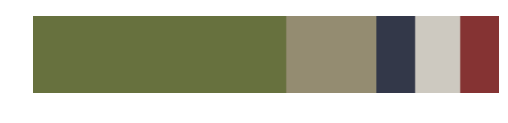

439


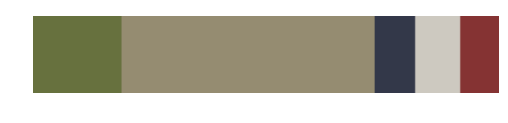

440


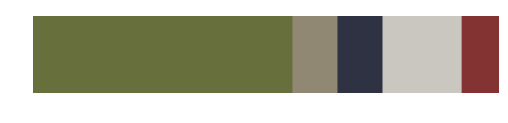

441


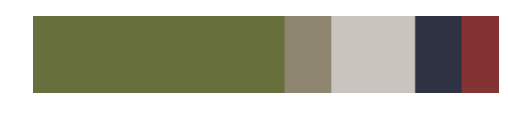

442


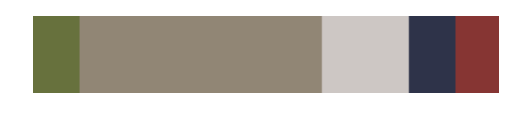

443


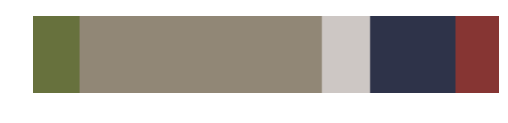

444


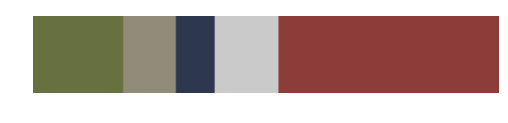

445


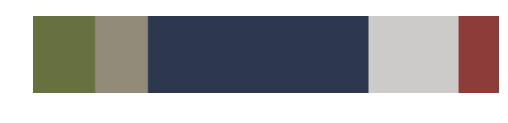

446


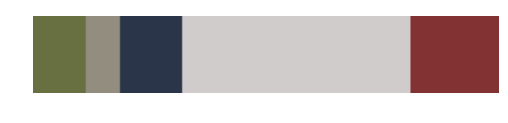

447


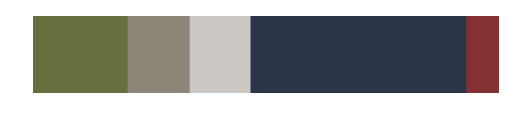

448


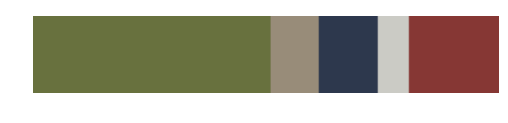

449


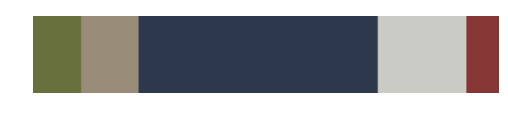

450


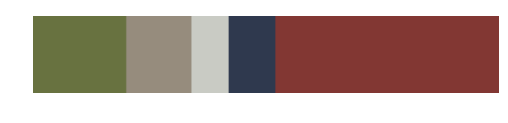

451


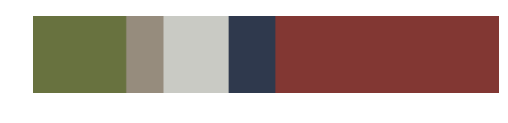

452


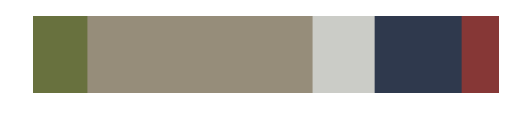

453


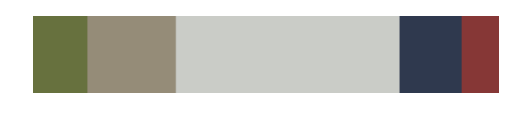

454


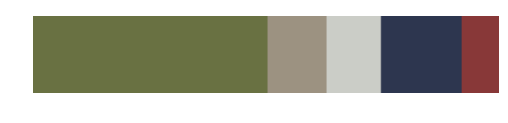

455


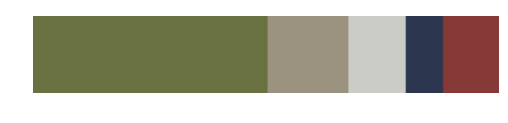

456


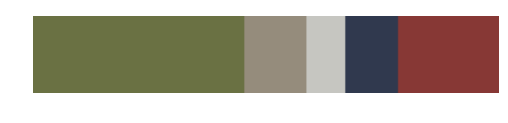

457


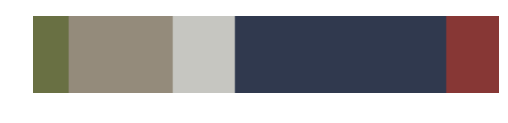

458


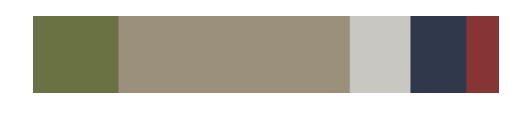

459


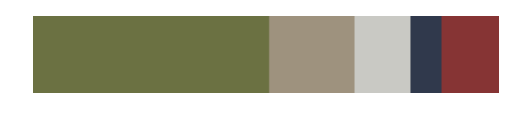

460


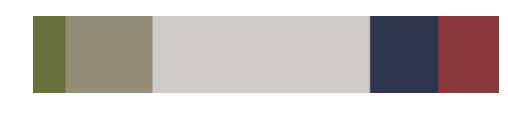

461


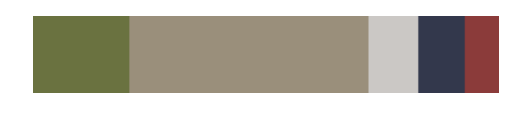

462


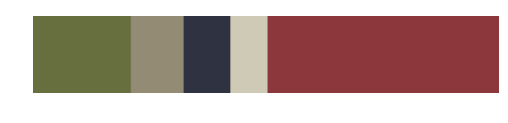

463


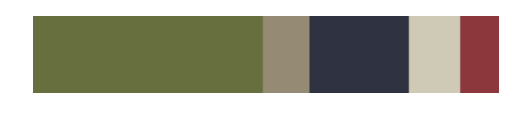

464


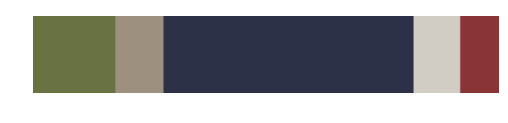

465


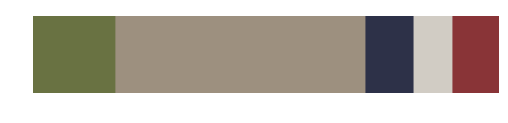

466


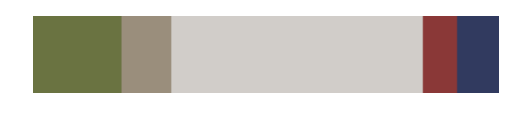

467


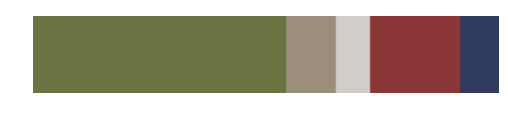

468


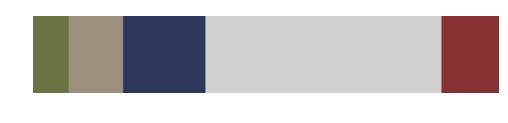

469


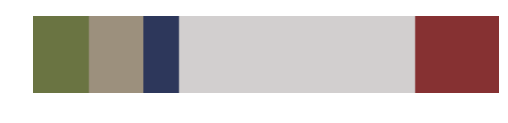

470


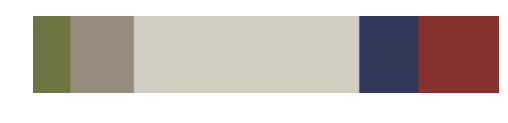

471


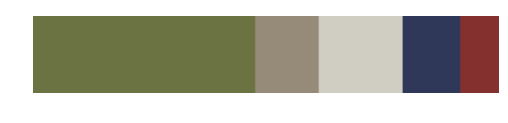

472


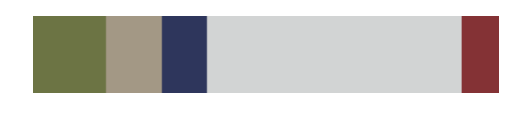

473


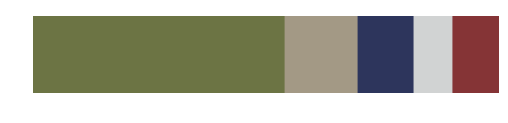

474


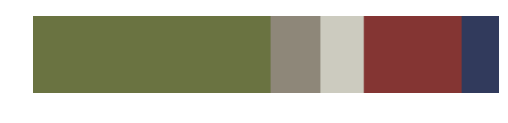

475


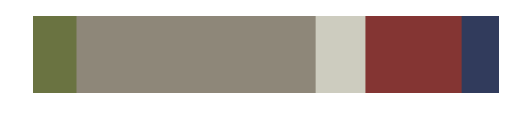

476


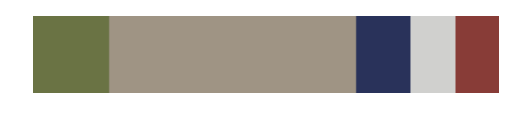

477


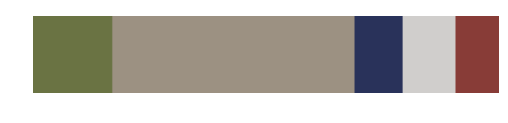

478


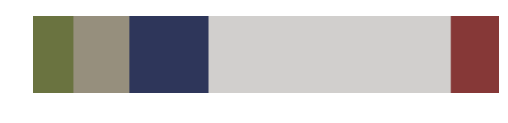

479


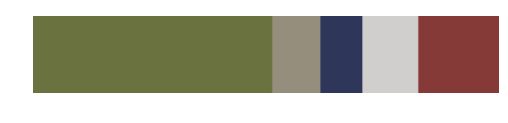

480


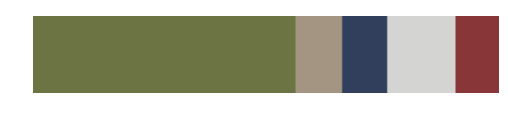

481


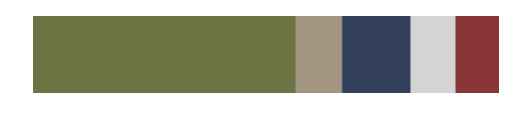

482


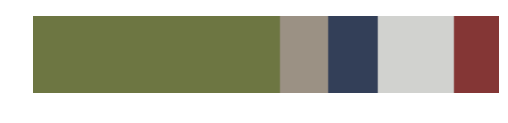

483


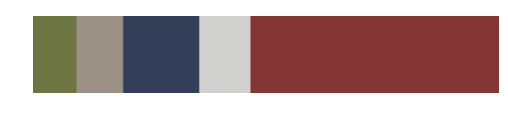

484


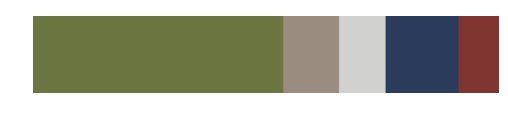

485


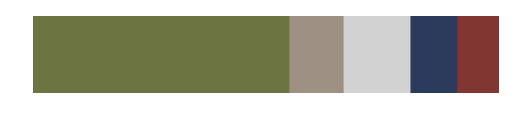

486


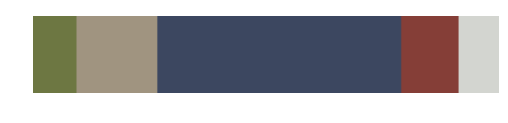

487


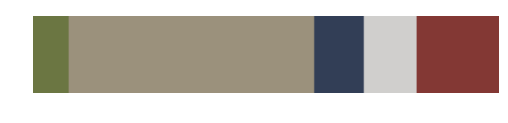

488


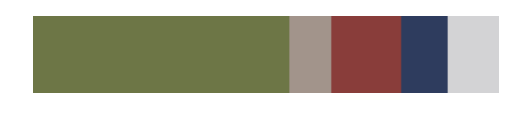

489


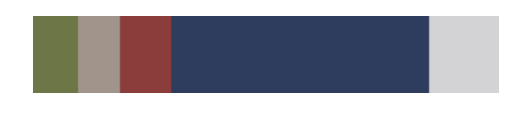

490


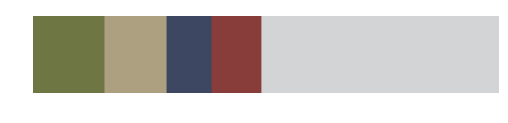

491


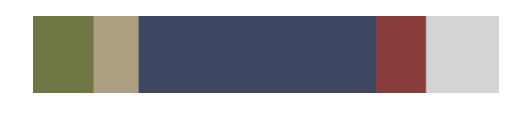

492


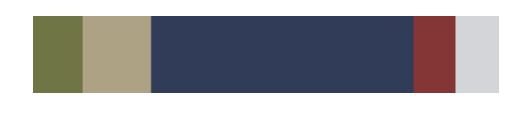

493


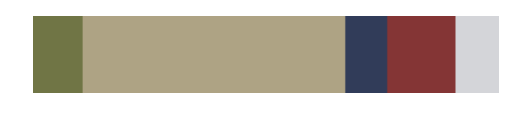

494


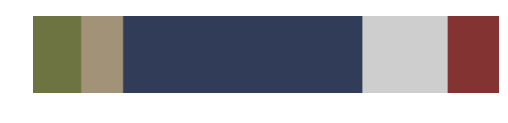

495


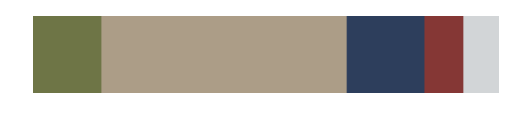

496


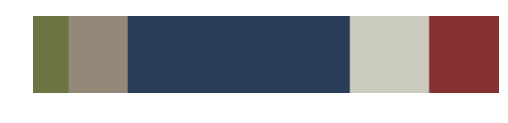

497


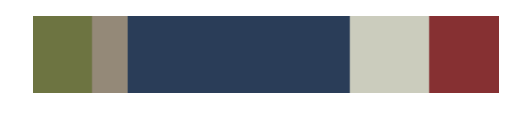

498


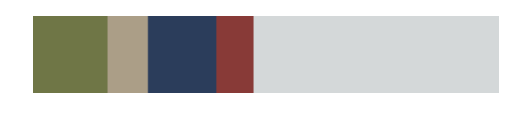

499


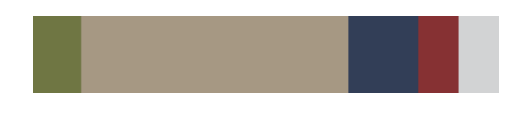

500


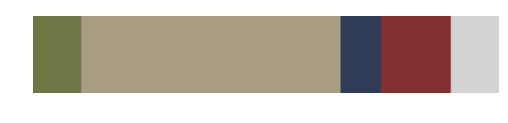

501


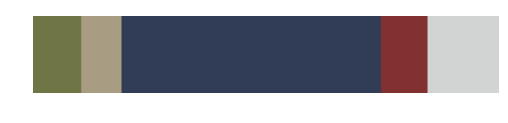

502


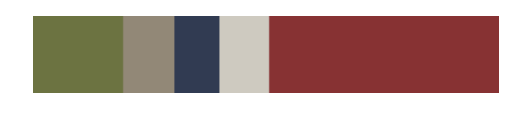

503


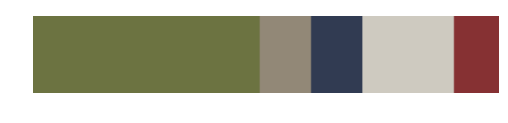

504


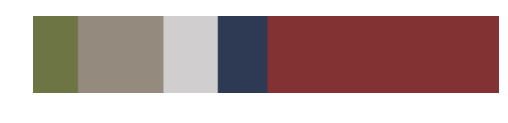

505


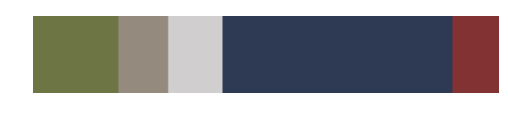

506


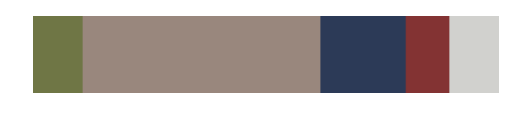

507


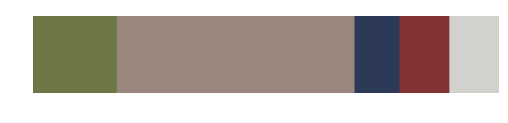

508


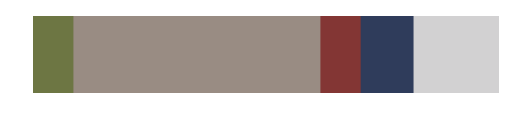

509


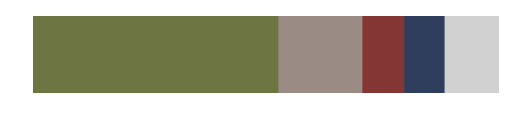

510


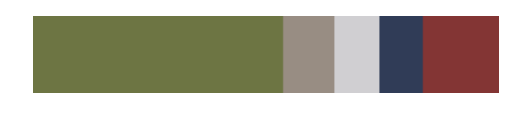

511


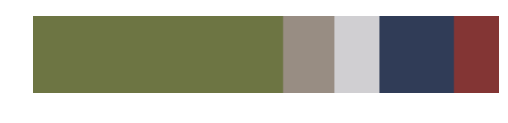

512


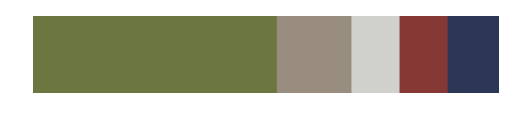

513


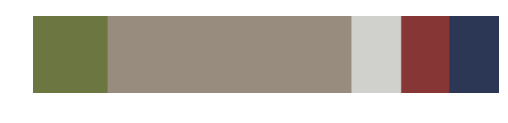

514


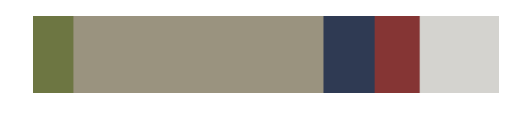

515


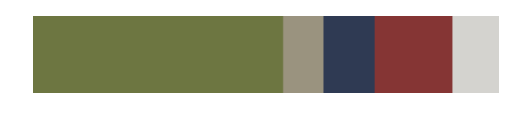

516


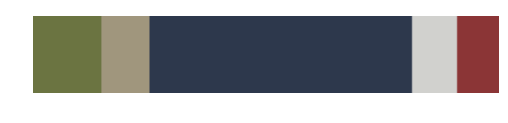

517


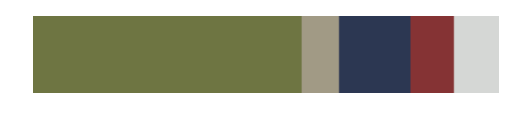

518


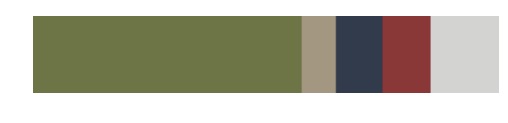

519


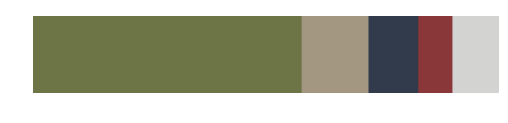

520


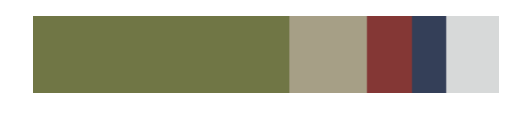

521


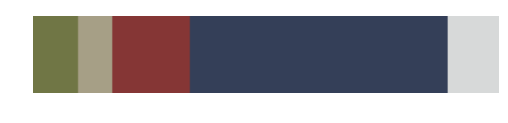

522


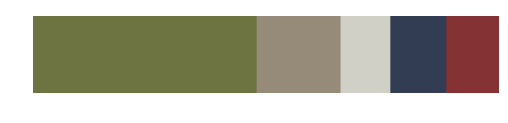

523


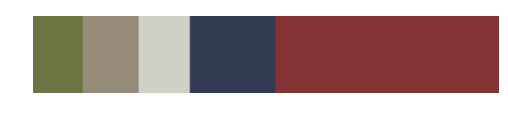

524


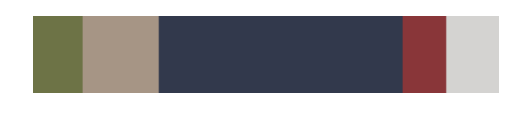

525


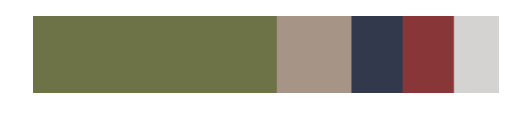

526


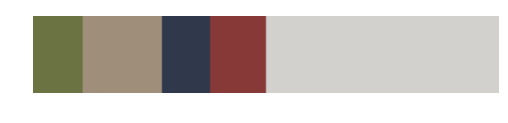

527


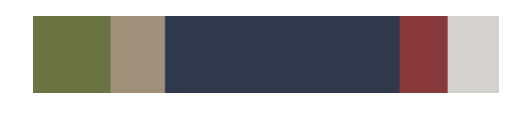

528


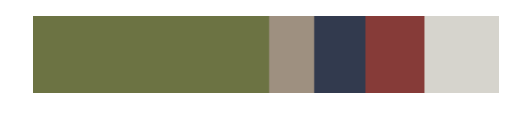

529


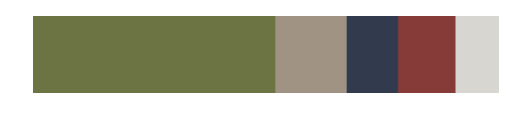

530


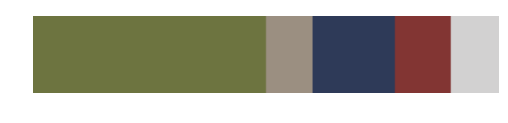

531


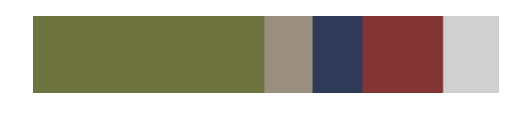

532


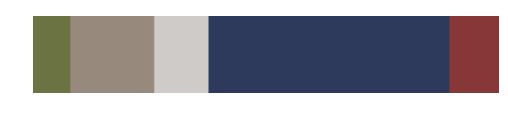

533


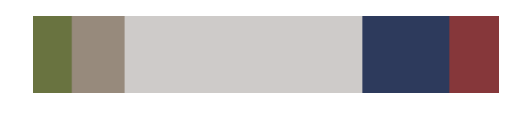

534


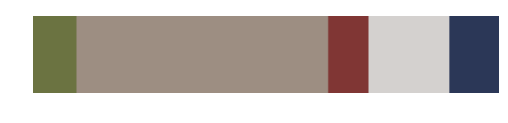

535


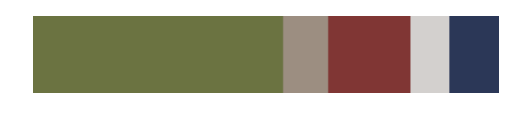

536


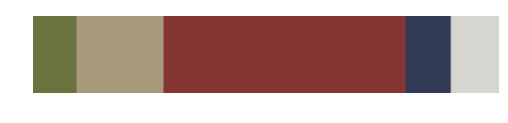

537


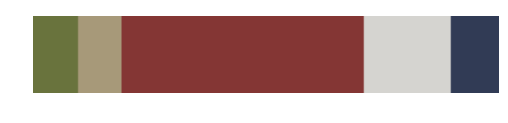

538


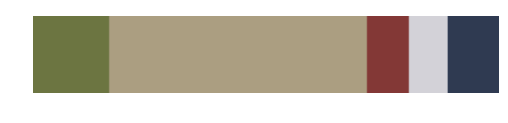

539


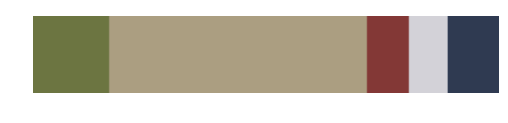

540


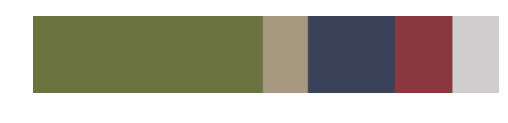

541


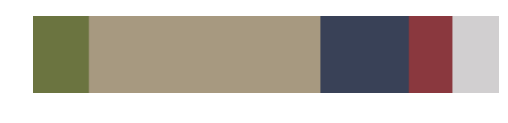

542


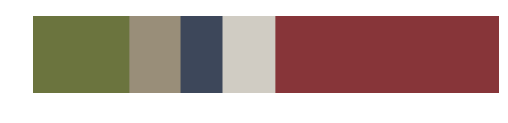

543


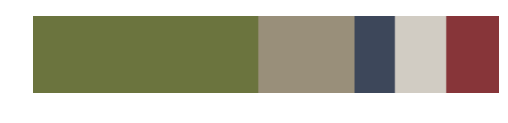

544


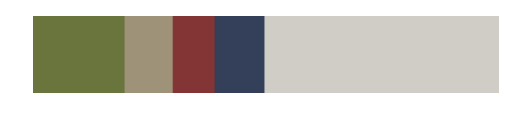

545


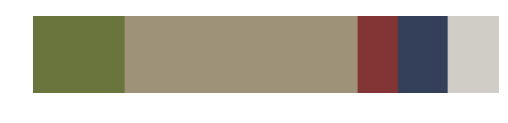

546


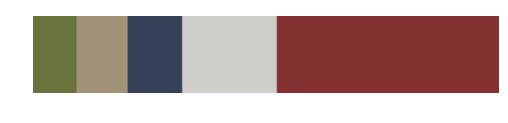

547


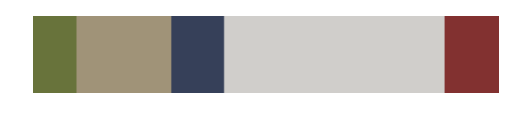

548


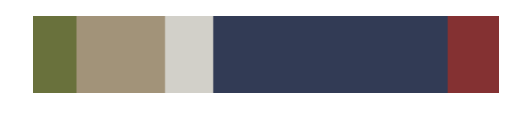

549


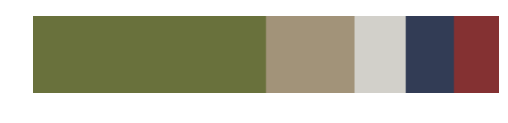

550


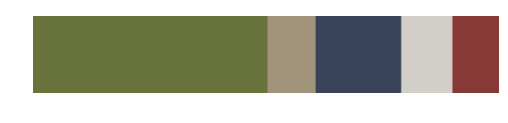

551


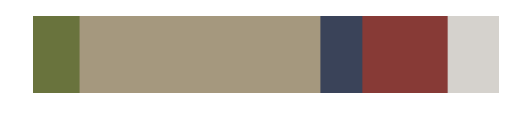

552


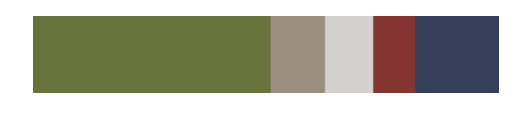

553


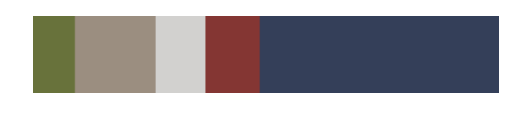

554


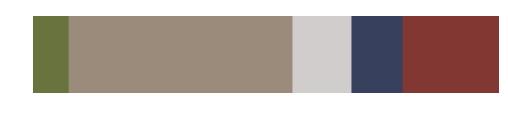

555


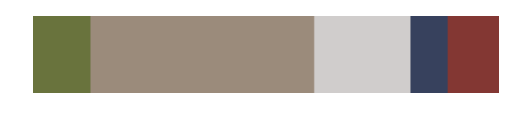

556


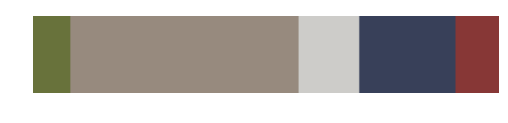

557


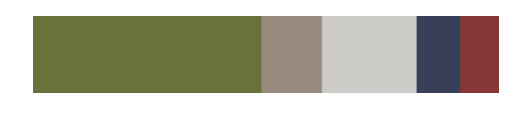

558


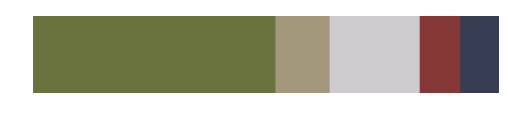

559


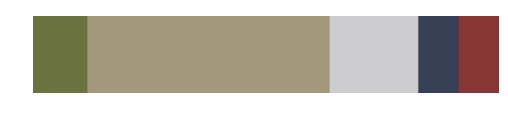

560


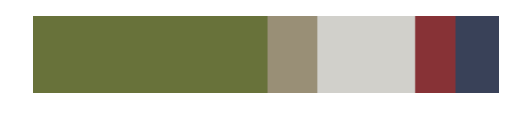

561


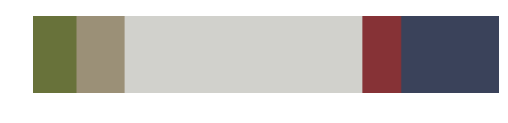

562


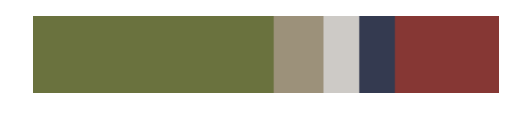

563


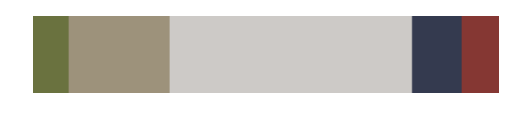

564


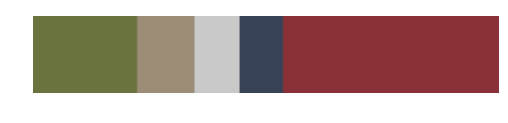

565


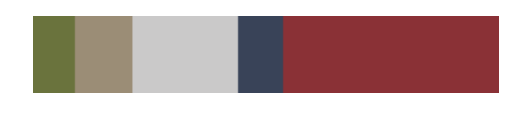

566


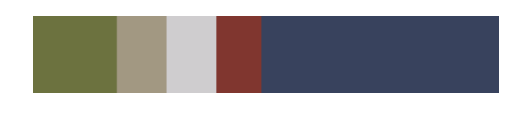

567


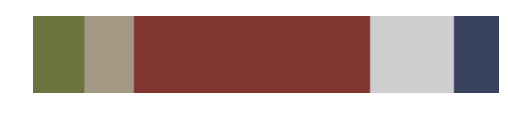

568


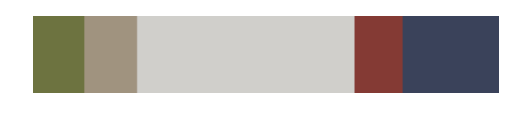

569


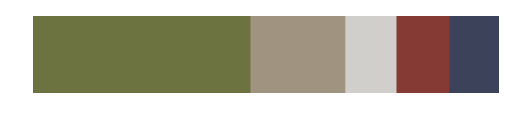

570


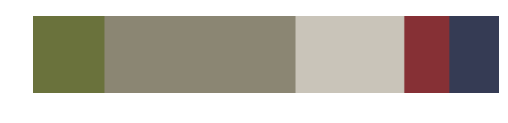

571


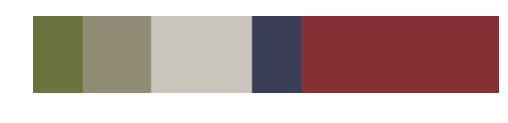

572


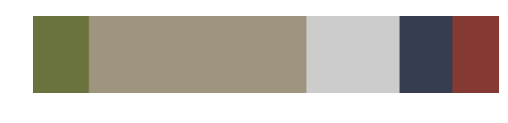

573


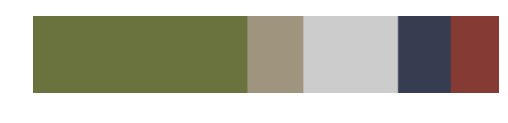

574


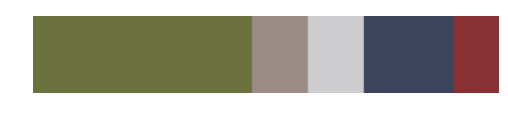

575


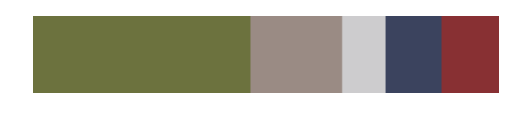

576


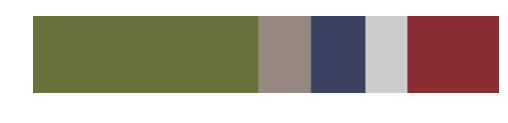

577


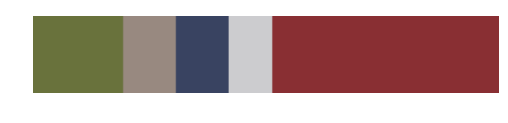

578


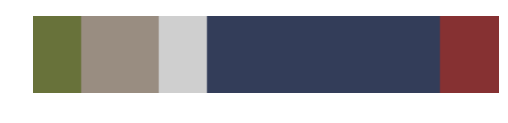

579


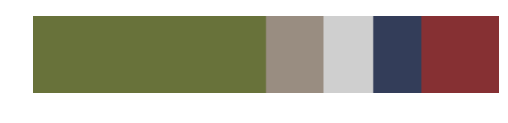

580


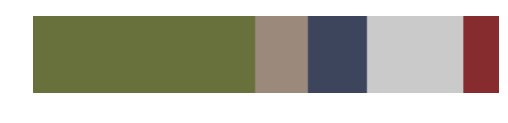

581


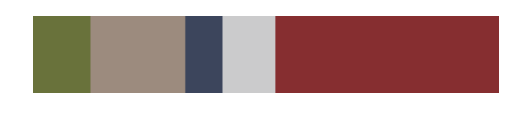

582


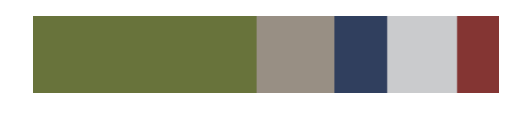

583


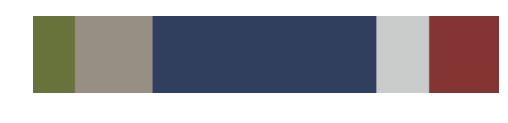

584


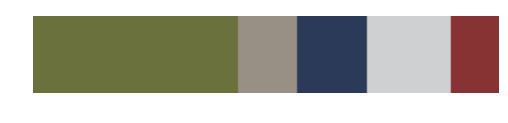

585


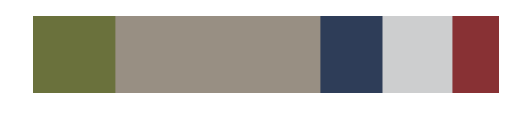

586


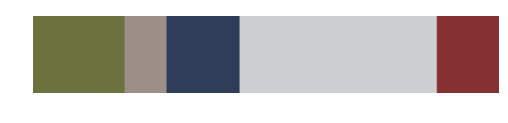

587


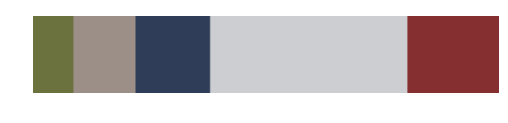

588


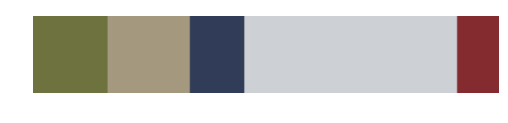

589


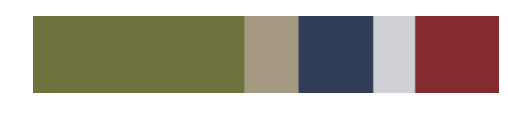

590


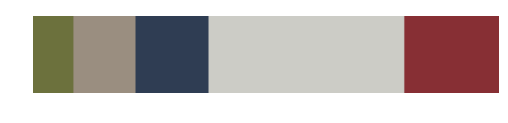

591


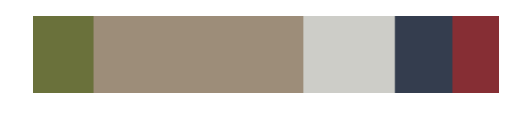

592


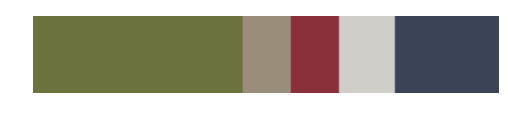

593


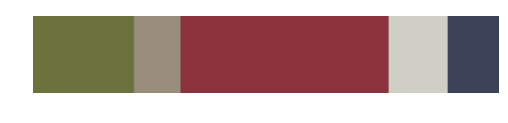

594


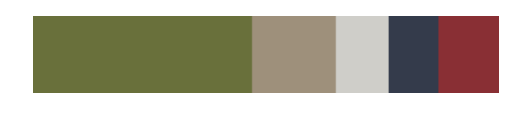

595


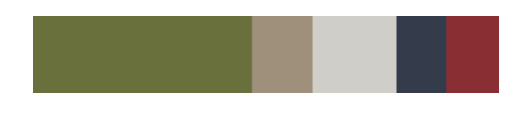

596


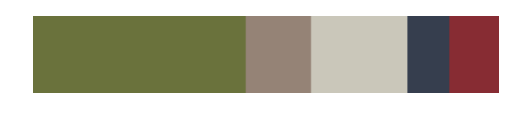

597


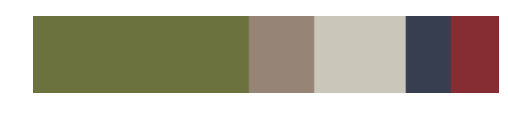

598


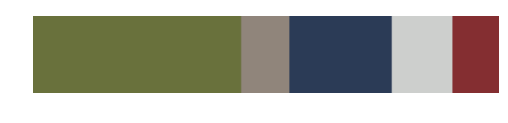

599


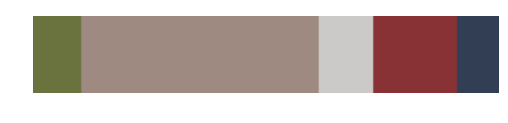

600


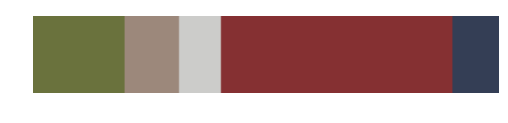

601


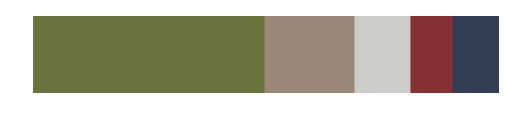

602


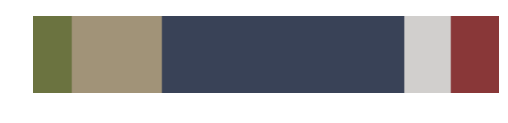

603


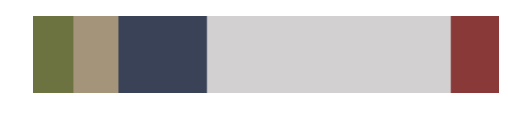

604


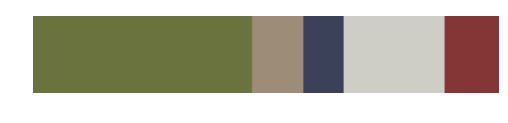

605


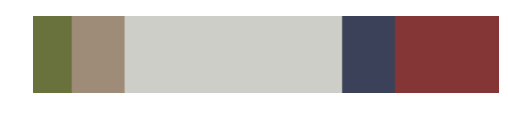

606


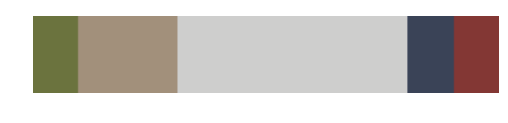

607


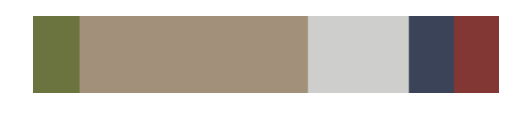

608


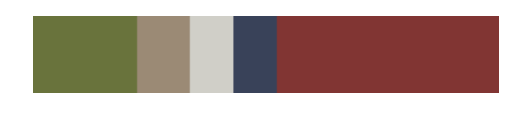

609


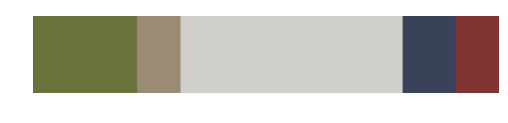

610


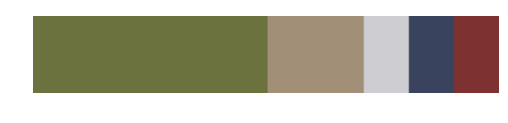

611


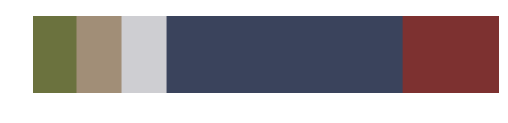

612


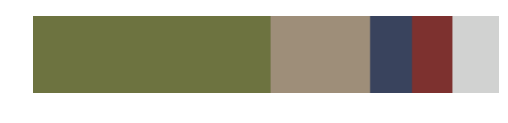

613


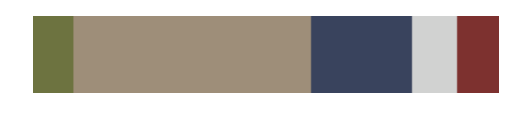

614


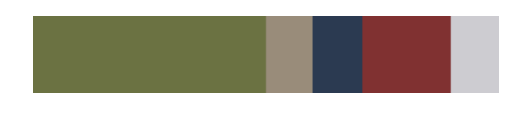

615


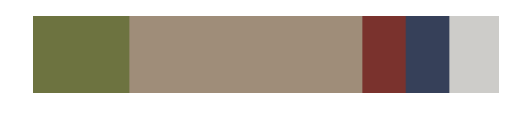

616


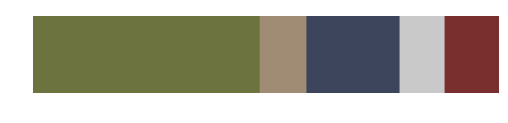

617


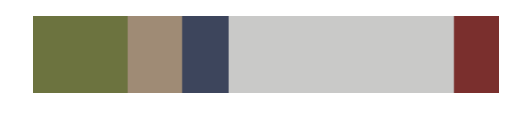

618


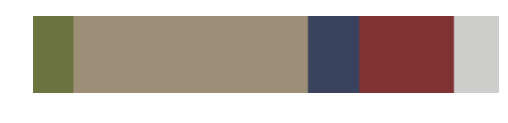

619


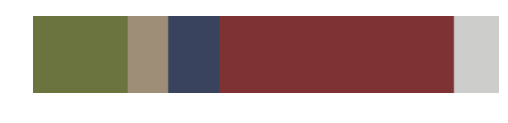

620


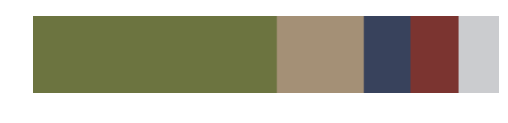

621


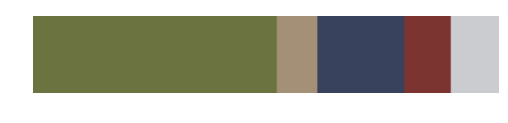

622


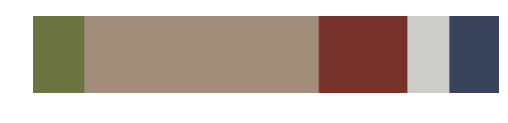

623


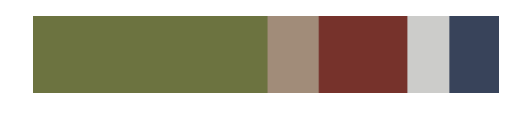

624


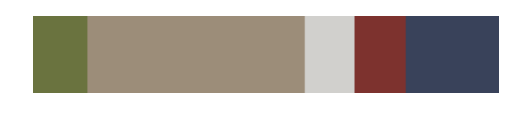

625


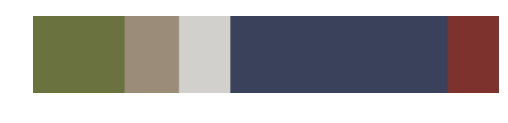

626


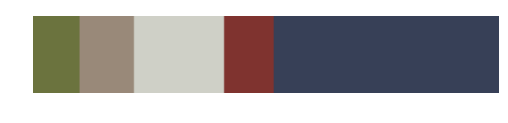

627


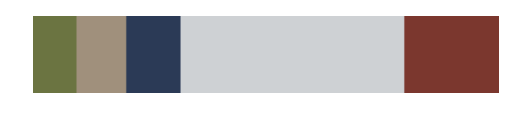

628


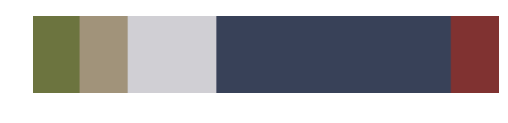

629


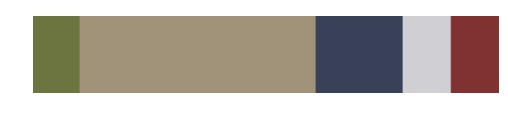

630


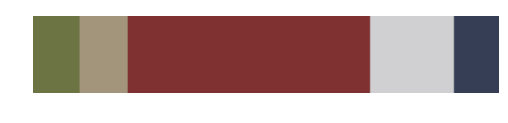

631


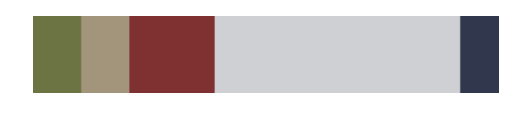

632


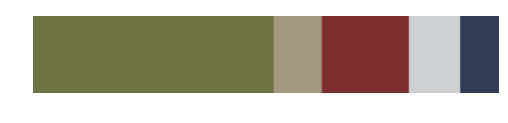

633


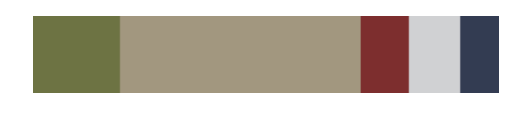

634


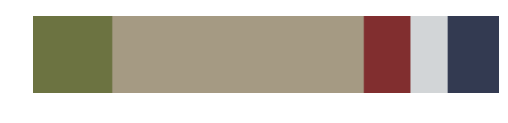

635


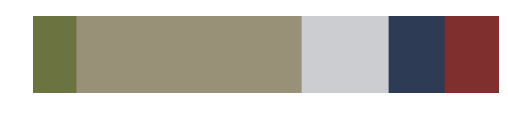

636


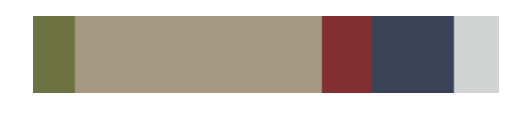

637


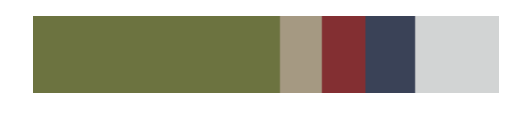

638


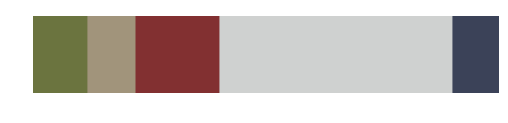

639


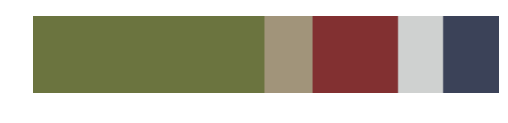

640


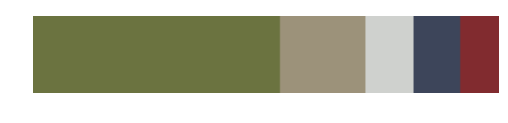

641


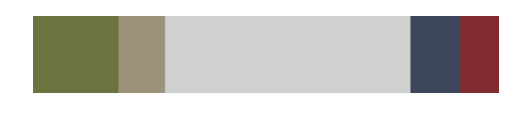

642


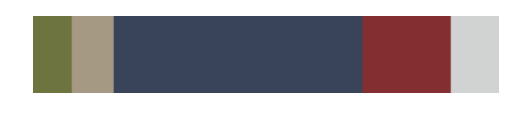

643


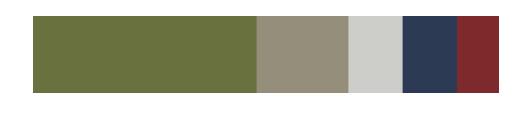

644


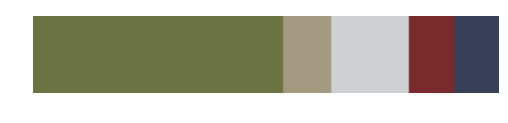

645


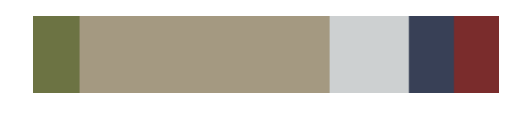

646


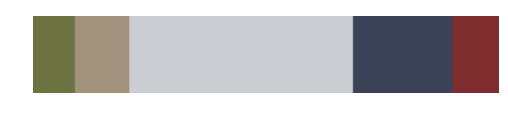

647


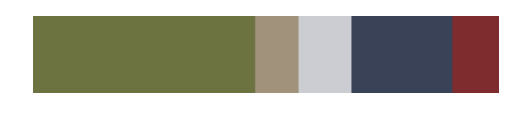

648


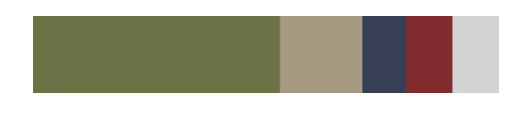

649


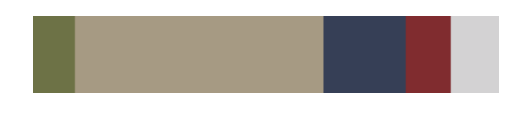

650


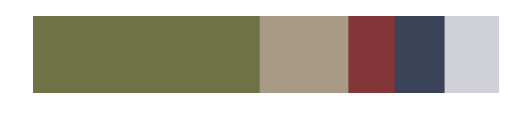

651


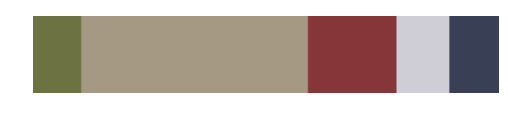

652


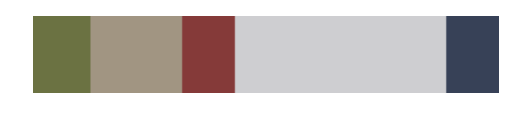

653


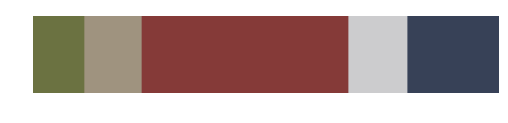

654


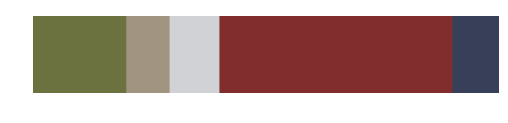

655


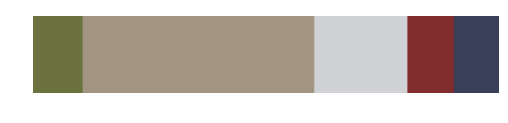

656


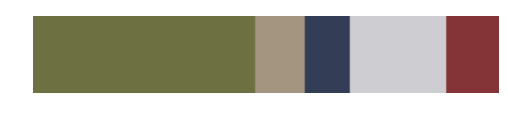

657


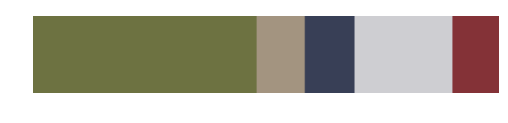

658


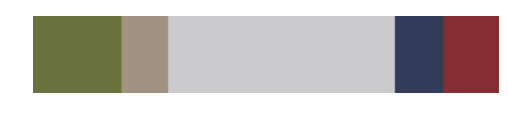

659


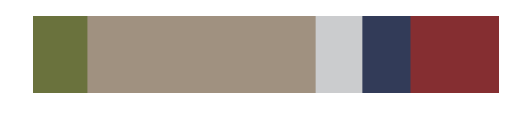

660


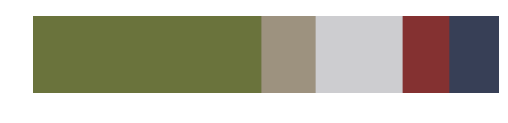

661


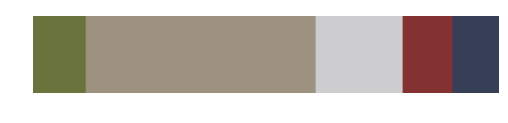

662


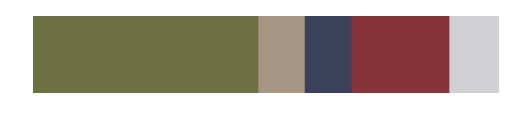

663


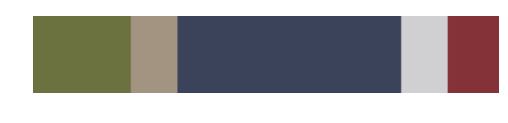

664


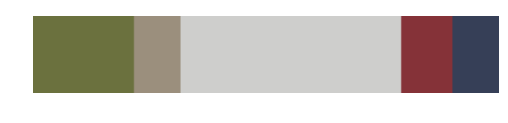

665


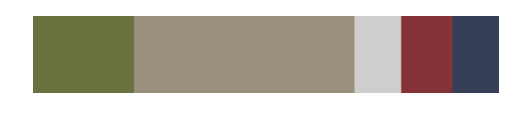

666


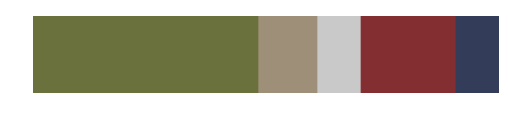

667


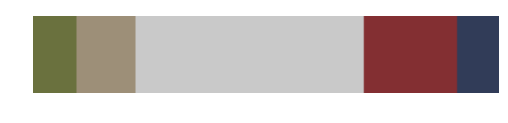

668


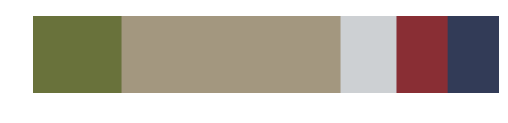

669


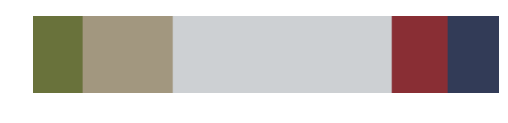

670


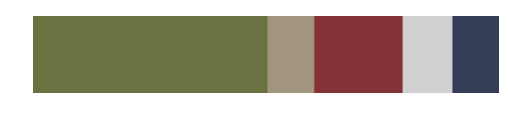

671


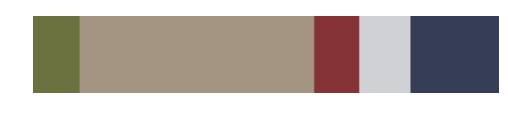

672


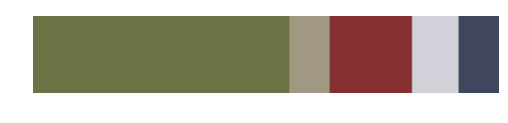

673


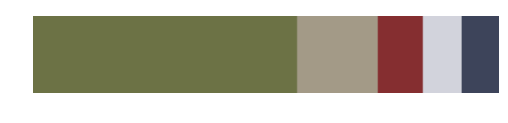

674


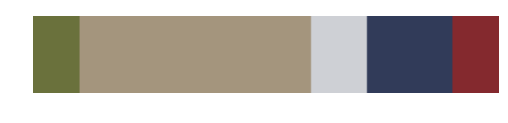

675


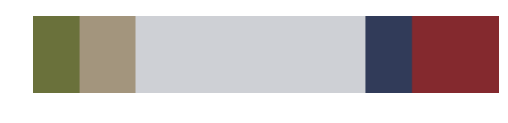

676


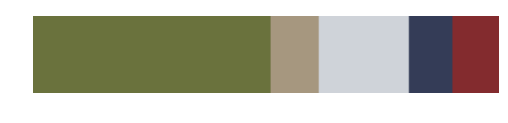

677


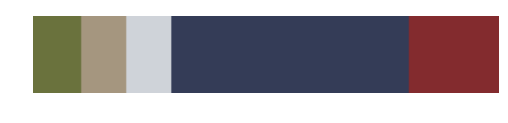

678


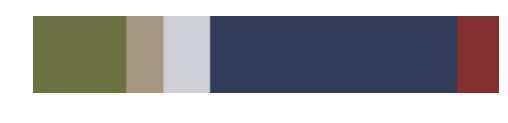

679


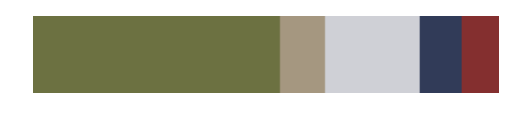

680


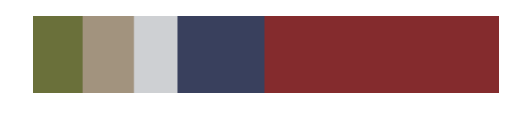

681


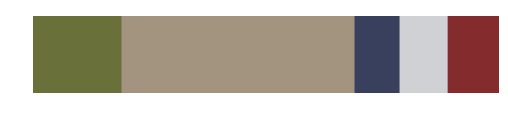

682


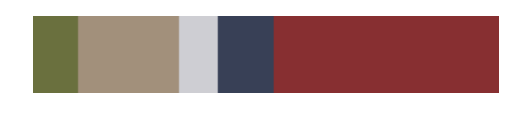

683


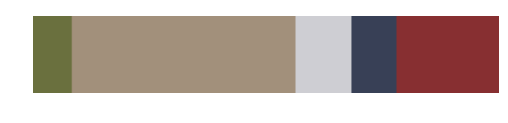

684


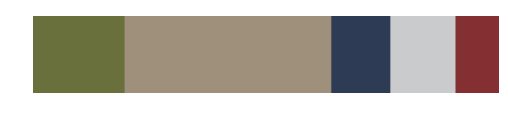

685


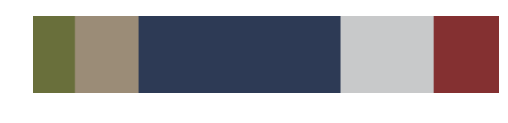

686


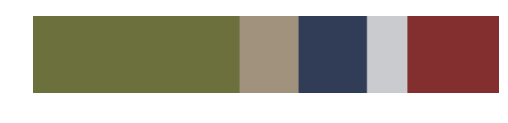

687


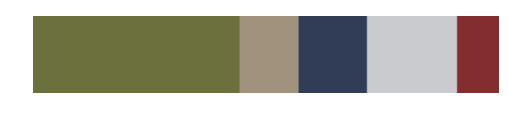

688


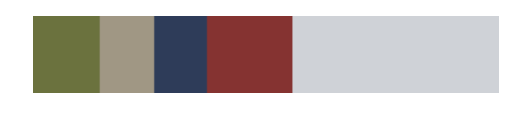

689


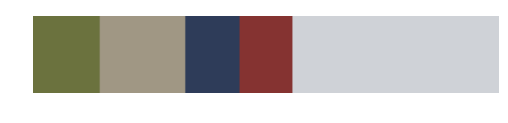

690


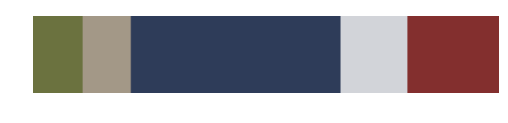

691


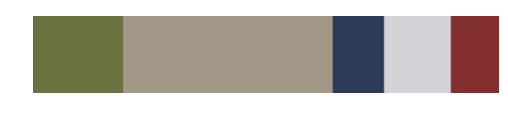

692


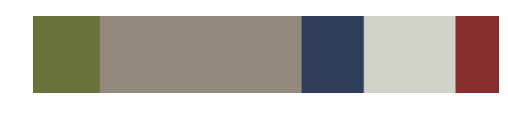

693


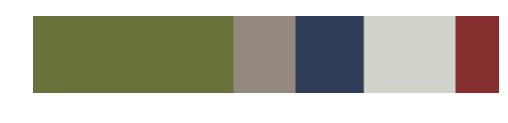

694


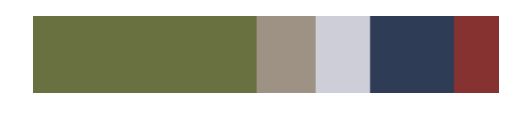

695


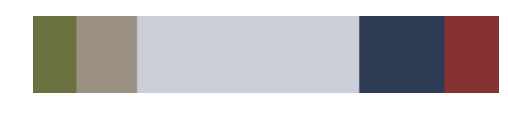

696


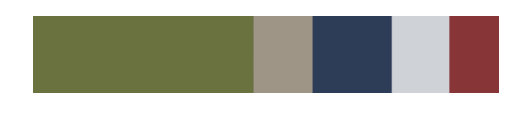

697


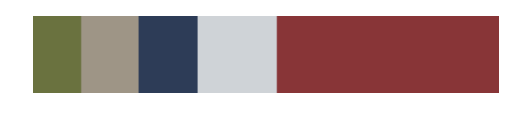

698


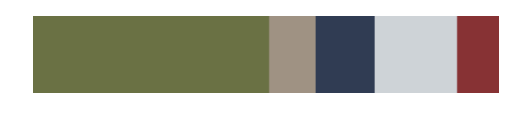

699


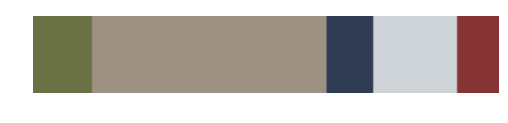

700


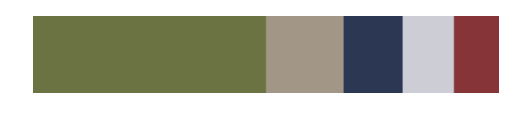

701


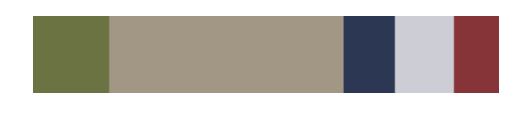

702


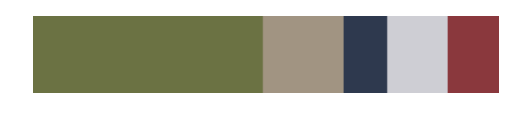

703


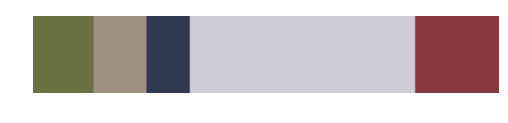

704


In [29]:
lower=np.array([30,60,40])
upper=np.array([100,255,150])
kernel = np.ones((5,5))

### Export video with circles
while(video.isOpened()):
    try:
        ok, img = video.read()
        if not ok:
            break
        else:
            #frame number in video
            vidframe = int(video.get(1))-1
            #rgb
            frame = cv.cvtColor(img, cv.COLOR_BGR2RGB)
            
            vidframe = int(video.get(1))-1

            frame = cv.cvtColor(img, cv.COLOR_BGR2RGB)
            #convert BGR to HSV
            hsv= cv.cvtColor(img,cv.COLOR_BGR2HSV)
            # create the Mask
            mask=cv.inRange(hsv,lower,upper)
            #invert mask to find everything that ISNT green
            mask = cv.bitwise_not(mask)
            erode = cv.erode(mask, kernel)
            dilate = cv.dilate(erode, kernel)
            
            #initiate player_frames, and boxes
            player_frames = np.empty(shape=[0, 20, 3])
            boxes = []
            
            #find contours and add to boxes/player frames
            _, conts,_=cv.findContours(dilate,cv.RETR_TREE,cv.CHAIN_APPROX_SIMPLE)
            for i in range(len(conts)):
                x,y,w,h=cv.boundingRect(conts[i])
                #print(w,h) check
                if (w < 200) and (w >= 20) and (h < 200) and (h>=20):
                    #coordinates of player, width height of bounding box, and team, 0 is unknown
                    player_coords[vidframe].append([x,y,w,h,0])
                    player = frame[y:y+h, x:x+w]
                    player = cv.resize(player, (20,80))
                    player_frames = np.concatenate((player_frames,player), axis = 0)
            
            #get most dominant colors, append to list of total colors across all frames
            total_colors = get_dominant_colors(player_frames, 5)
            for color in total_colors:
                colors.append(color)
                
                
            print(vidframe)
            out.write(cv.cvtColor(frame, cv.COLOR_BGR2RGB))

    except KeyboardInterrupt:
        video.release()

video.release()
out.release()

In [31]:
colors = np.reshape(colors, (len(colors), 3))

In [32]:
total_colors = get_dominant_colors(colors, 5)

In [ ]:
total_colors

In [33]:
video = cv.VideoCapture('example.mp4')

In [34]:
frame_width = int(video.get(3)) #get frame width from vid
frame_height= int(video.get(4)) #get frame height from vid
fps = video.get(5)
font = cv.FONT_HERSHEY_COMPLEX

In [35]:
out = cv.VideoWriter('teamselection.avi',cv.VideoWriter_fourcc('M','J','P','G'), fps, (frame_width,frame_height))

In [36]:
team1 = [total_colors[4]]
team2 = [total_colors[3], total_colors[2]]


In [37]:
### Export video with circles
while(video.isOpened()):
    try:
        ok, img = video.read()
        if not ok:
            break
        else:
            #frame number in video
            vidframe = int(video.get(1))-1
            #rgb
            frame = cv.cvtColor(img, cv.COLOR_BGR2RGB)
            
            boxes = player_coords[vidframe]

            for player in boxes:
                has_team = False
                x,y,w,h,_ = player
                image = frame[y:y+h, x:x+w]
                image_colors = get_dominant_colors(image, 3)
                #assign team color to second most dominant color within bounding box
                kit_colors = image_colors
                
                for color in kit_colors:
                    if get_color_similarity(color, team1[0]) < 10:
                        player[4] = 1
                        cv.rectangle(frame,(x,y),(x+w,y+h),(255,0,0), 2)
                        cv.putText(frame, "TEAM 1",(x,y),font,2,(255,0,0), thickness = 3)
                        has_team = True
                    elif get_color_similarity(color, team2[0]) < 10 or get_color_similarity(color, team2[1]) < 10:
                        player[4] = 2
                        cv.rectangle(frame,(x,y),(x+w,y+h),(0,0,255), 2)
                        cv.putText(frame, "TEAM 2",(x,y),font,2,(0,0,255), thickness = 3)
                        has_team = True
                if has_team is False:
                    cv.rectangle(frame,(x,y),(x+w,y+h),(0,255,0), 2)
                    cv.putText(frame, "UNKNOWN",(x,y),font,2,(0,255,0), thickness = 3)
            print(vidframe)
            out.write(cv.cvtColor(frame, cv.COLOR_BGR2RGB))

    except KeyboardInterrupt:
        video.release()

video.release()
out.release()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

# EXPORT FOR SMOOTHING

In [2]:
import pickle

In [78]:
# with open('coords.pkl', 'wb') as f:
#     pickle.dump(player_coords, f)
    
# with open('box.pkl', 'wb') as f:
#     pickle.dump(boxPoints, f)

In [3]:
with open("coords.pkl", "rb") as f:
    player_coords = pickle.load(f)
    
with open("box.pkl", "rb") as f:
    box_points = pickle.load(f)
    

# DRAW TO FRAME

In [43]:
fps = video.get(5)
length = video.get(7) / video.get(5)

0
[[319, 89], [912, 479], [754, 111], [1097, 278]]
[MoviePy] >>>> Building video mapping_x.mp4
[MoviePy] Writing video mapping_x.mp4


  0%|          | 2/706 [00:00<00:43, 16.14it/s]

0
[[319, 89], [912, 479], [754, 111], [1097, 278]]
1
[[319, 89], [912, 479], [754, 111], [1097, 278]]
2
[[319, 89], [912, 479], [754, 111], [1097, 278]]
3
[[319, 89], [912, 479], [754, 111], [1097, 278]]


  1%|          | 6/706 [00:00<00:44, 15.79it/s]

4
[[319, 89], [912, 479], [754, 111], [1097, 278]]
5
[[319, 89], [912, 479], [754, 111], [1097, 278]]
6
[[319, 89], [912, 479], [754, 111], [1097, 278]]
7
[[319, 89], [912, 479], [754, 111], [1097, 278]]


  1%|          | 8/706 [00:00<00:44, 15.61it/s]

8
[[319, 89], [912, 479], [754, 111], [1097, 278]]


  2%|▏         | 12/706 [00:00<00:44, 15.60it/s]

9
[[319, 89], [912, 479], [754, 111], [1097, 278]]
10
[[319, 89], [912, 479], [754, 111], [1097, 278]]
11
[[319, 89], [912, 479], [754, 111], [1097, 278]]
12
[[319, 89], [912, 479], [754, 111], [1097, 278]]


  2%|▏         | 16/706 [00:01<00:44, 15.59it/s]

13
[[319, 89], [912, 479], [754, 111], [1097, 278]]
14
[[319, 89], [912, 479], [754, 111], [1097, 278]]
15
[[319, 89], [912, 479], [754, 111], [1097, 278]]
16
[[319, 89], [912, 479], [754, 111], [1097, 278]]
17
[[319, 89], [912, 479], [754, 111], [1097, 278]]


  3%|▎         | 22/706 [00:01<00:44, 15.41it/s]

18
[[319, 89], [912, 479], [754, 111], [1097, 278]]
19
[[319, 89], [912, 479], [754, 111], [1097, 278]]
20
[[319, 89], [912, 479], [754, 111], [1097, 278]]
21
[[319, 89], [912, 479], [754, 111], [1097, 278]]
22
[[319, 89], [912, 479], [754, 111], [1097, 278]]


  4%|▎         | 26/706 [00:01<00:44, 15.42it/s]

23
[[319, 89], [912, 479], [754, 111], [1097, 278]]
24
[[319, 89], [912, 479], [754, 111], [1097, 278]]
25
[[319, 89], [912, 479], [754, 111], [1097, 278]]
26
[[319, 89], [912, 479], [754, 111], [1097, 278]]
27
[[319, 89], [912, 479], [754, 111], [1097, 278]]


  5%|▍         | 32/706 [00:02<00:43, 15.37it/s]

28
[[319, 89], [912, 479], [754, 111], [1097, 278]]
29
[[319, 89], [912, 479], [754, 111], [1097, 278]]
30
[[319, 89], [912, 479], [754, 111], [1097, 278]]
30
[[319, 89], [912, 479], [754, 111], [1097, 278]]
32
[[319, 89], [912, 479], [754, 111], [1097, 278]]


  5%|▌         | 36/706 [00:02<00:43, 15.49it/s]

33
[[319, 89], [912, 479], [754, 111], [1097, 278]]
34
[[319, 89], [912, 479], [754, 111], [1097, 278]]
35
[[319, 89], [912, 479], [754, 111], [1097, 278]]
36
[[319, 89], [912, 479], [754, 111], [1097, 278]]
37
[[319, 89], [912, 479], [754, 111], [1097, 278]]


  6%|▌         | 42/706 [00:02<00:42, 15.50it/s]

38
[[319, 89], [912, 479], [754, 111], [1097, 278]]
39
[[319, 89], [912, 479], [754, 111], [1097, 278]]
40
[[319, 89], [912, 479], [754, 111], [1097, 278]]
41
[[319, 89], [912, 479], [754, 111], [1097, 278]]
42
[[319, 89], [912, 479], [754, 111], [1097, 278]]


  7%|▋         | 46/706 [00:02<00:42, 15.60it/s]

43
[[319, 89], [912, 479], [754, 111], [1097, 278]]
44
[[319, 89], [912, 479], [754, 111], [1097, 278]]
45
[[319, 89], [912, 479], [754, 111], [1097, 278]]
46
[[319, 89], [912, 479], [754, 111], [1097, 278]]
47
[[319, 89], [912, 479], [754, 111], [1097, 278]]


  7%|▋         | 50/706 [00:03<00:42, 15.58it/s]

48
[[319, 89], [912, 479], [754, 111], [1097, 278]]
49
[[319, 89], [912, 479], [754, 111], [1097, 278]]
50
[[319, 89], [912, 479], [754, 111], [1097, 278]]
51
[[319, 89], [912, 479], [754, 111], [1097, 278]]


  8%|▊         | 56/706 [00:03<00:41, 15.58it/s]

52
[[319, 89], [912, 479], [754, 111], [1097, 278]]
53
[[319, 89], [912, 479], [754, 111], [1097, 278]]
54
[[319, 89], [912, 479], [754, 111], [1097, 278]]
55
[[319, 89], [912, 479], [754, 111], [1097, 278]]
56
[[319, 89], [912, 479], [754, 111], [1097, 278]]


  8%|▊         | 60/706 [00:03<00:41, 15.65it/s]

57
[[319, 89], [912, 479], [754, 111], [1097, 278]]
58
[[319, 89], [912, 479], [754, 111], [1097, 278]]
59
[[319, 89], [912, 479], [754, 111], [1097, 278]]
60
[[319, 89], [912, 479], [754, 111], [1097, 278]]


  9%|▉         | 64/706 [00:04<00:41, 15.65it/s]

61
[[319, 89], [912, 479], [754, 111], [1097, 278]]
61
[[319, 89], [912, 479], [754, 111], [1097, 278]]
63
[[319, 89], [912, 479], [754, 111], [1097, 278]]
64
[[319, 89], [912, 479], [754, 111], [1097, 278]]
65
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 10%|▉         | 70/706 [00:04<00:40, 15.65it/s]

66
[[319, 89], [912, 479], [754, 111], [1097, 278]]
67
[[319, 89], [912, 479], [754, 111], [1097, 278]]
68
[[319, 89], [912, 479], [754, 111], [1097, 278]]
69
[[319, 89], [912, 479], [754, 111], [1097, 278]]
70
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 10%|█         | 74/706 [00:04<00:40, 15.56it/s]

71
[[319, 89], [912, 479], [754, 111], [1097, 278]]
72
[[319, 89], [912, 479], [754, 111], [1097, 278]]
73
[[319, 89], [912, 479], [754, 111], [1097, 278]]
74
[[319, 89], [912, 479], [754, 111], [1097, 278]]
75
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 11%|█▏        | 80/706 [00:05<00:40, 15.57it/s]

76
[[319, 89], [912, 479], [754, 111], [1097, 278]]
77
[[319, 89], [912, 479], [754, 111], [1097, 278]]
78
[[319, 89], [912, 479], [754, 111], [1097, 278]]
79
[[319, 89], [912, 479], [754, 111], [1097, 278]]
80
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 12%|█▏        | 84/706 [00:05<00:40, 15.43it/s]

81
[[319, 89], [912, 479], [754, 111], [1097, 278]]
82
[[319, 89], [912, 479], [754, 111], [1097, 278]]
83
[[319, 89], [912, 479], [754, 111], [1097, 278]]
84
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 12%|█▏        | 88/706 [00:05<00:40, 15.37it/s]

85
[[319, 89], [912, 479], [754, 111], [1097, 278]]
86
[[319, 89], [912, 479], [754, 111], [1097, 278]]
87
[[319, 89], [912, 479], [754, 111], [1097, 278]]
88
[[319, 89], [912, 479], [754, 111], [1097, 278]]
89
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 13%|█▎        | 94/706 [00:06<00:39, 15.48it/s]

90
[[319, 89], [912, 479], [754, 111], [1097, 278]]
91
[[319, 89], [912, 479], [754, 111], [1097, 278]]
92
[[319, 89], [912, 479], [754, 111], [1097, 278]]
93
[[319, 89], [912, 479], [754, 111], [1097, 278]]
94
[[319, 89], [912, 479], [754, 111], [1097, 278]]
95
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 14%|█▍        | 100/706 [00:09<03:12,  3.14it/s]

96
[[319, 89], [912, 479], [754, 111], [1097, 278]]
97
[[319, 89], [912, 479], [754, 111], [1097, 278]]
98
[[319, 89], [912, 479], [754, 111], [1097, 278]]
99
[[319, 89], [912, 479], [754, 111], [1097, 278]]
100
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 15%|█▍        | 104/706 [00:10<01:53,  5.31it/s]

101
[[319, 89], [912, 479], [754, 111], [1097, 278]]
102
[[319, 89], [912, 479], [754, 111], [1097, 278]]
103
[[319, 89], [912, 479], [754, 111], [1097, 278]]
104
[[319, 89], [912, 479], [754, 111], [1097, 278]]
105
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 16%|█▌        | 110/706 [00:10<01:03,  9.34it/s]

106
[[319, 89], [912, 479], [754, 111], [1097, 278]]
107
[[319, 89], [912, 479], [754, 111], [1097, 278]]
108
[[319, 89], [912, 479], [754, 111], [1097, 278]]
109
[[319, 89], [912, 479], [754, 111], [1097, 278]]
110
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 16%|█▌        | 114/706 [00:10<00:50, 11.73it/s]

110
[[319, 89], [912, 479], [754, 111], [1097, 278]]
112
[[319, 89], [912, 479], [754, 111], [1097, 278]]
113
[[319, 89], [912, 479], [754, 111], [1097, 278]]
114
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 17%|█▋        | 118/706 [00:11<00:43, 13.37it/s]

115
[[319, 89], [912, 479], [754, 111], [1097, 278]]
116
[[319, 89], [912, 479], [754, 111], [1097, 278]]
117
[[319, 89], [912, 479], [754, 111], [1097, 278]]
118
[[319, 89], [912, 479], [754, 111], [1097, 278]]
119
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 17%|█▋        | 122/706 [00:11<00:39, 14.64it/s]

120
[[319, 89], [912, 479], [754, 111], [1097, 278]]
121
[[319, 89], [912, 479], [754, 111], [1097, 278]]
122
[[319, 89], [912, 479], [754, 111], [1097, 278]]
122
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 18%|█▊        | 126/706 [00:11<00:38, 15.15it/s]

123
[[319, 89], [912, 479], [754, 111], [1097, 278]]
125
[[319, 89], [912, 479], [754, 111], [1097, 278]]
126
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 18%|█▊        | 130/706 [00:12<00:55, 10.40it/s]

127
[[319, 89], [912, 479], [754, 111], [1097, 278]]
128
[[319, 89], [912, 479], [754, 111], [1097, 278]]
129
[[319, 89], [912, 479], [754, 111], [1097, 278]]
130
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 19%|█▉        | 134/706 [00:12<00:45, 12.48it/s]

131
[[319, 89], [912, 479], [754, 111], [1097, 278]]
132
[[319, 89], [912, 479], [754, 111], [1097, 278]]
133
[[319, 89], [912, 479], [754, 111], [1097, 278]]
134
[[319, 89], [912, 479], [754, 111], [1097, 278]]
135
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 20%|█▉        | 140/706 [00:12<00:39, 14.26it/s]

136
[[319, 89], [912, 479], [754, 111], [1097, 278]]
137
[[319, 89], [912, 479], [754, 111], [1097, 278]]
138
[[319, 89], [912, 479], [754, 111], [1097, 278]]
139
[[319, 89], [912, 479], [754, 111], [1097, 278]]
140


 20%|██        | 144/706 [00:13<00:37, 14.88it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
141
[[319, 89], [912, 479], [754, 111], [1097, 278]]
142
[[319, 89], [912, 479], [754, 111], [1097, 278]]
143
[[319, 89], [912, 479], [754, 111], [1097, 278]]
144
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 21%|██        | 148/706 [00:13<00:36, 15.21it/s]

145
[[319, 89], [912, 479], [754, 111], [1097, 278]]
146
[[319, 89], [912, 479], [754, 111], [1097, 278]]
147
[[319, 89], [912, 479], [754, 111], [1097, 278]]
148
[[319, 89], [912, 479], [754, 111], [1097, 278]]
149


 22%|██▏       | 152/706 [00:13<00:35, 15.43it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
150
[[319, 89], [912, 479], [754, 111], [1097, 278]]
151
[[319, 89], [912, 479], [754, 111], [1097, 278]]
152
[[319, 89], [912, 479], [754, 111], [1097, 278]]
153
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 22%|██▏       | 156/706 [00:13<00:35, 15.48it/s]

154
[[319, 89], [912, 479], [754, 111], [1097, 278]]
155
[[319, 89], [912, 479], [754, 111], [1097, 278]]
156
[[319, 89], [912, 479], [754, 111], [1097, 278]]
157
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 23%|██▎       | 162/706 [00:14<00:35, 15.38it/s]

158
[[319, 89], [912, 479], [754, 111], [1097, 278]]
159
[[319, 89], [912, 479], [754, 111], [1097, 278]]
160
[[319, 89], [912, 479], [754, 111], [1097, 278]]
161
[[319, 89], [912, 479], [754, 111], [1097, 278]]
162


 23%|██▎       | 164/706 [00:14<00:35, 15.39it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
163
[[319, 89], [912, 479], [754, 111], [1097, 278]]
164
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 24%|██▍       | 168/706 [00:14<00:56,  9.47it/s]

165
[[319, 89], [912, 479], [754, 111], [1097, 278]]
166
[[319, 89], [912, 479], [754, 111], [1097, 278]]
167
[[319, 89], [912, 479], [754, 111], [1097, 278]]
168
[[319, 89], [912, 479], [754, 111], [1097, 278]]
169
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 25%|██▍       | 174/706 [00:15<00:41, 12.83it/s]

170
[[319, 89], [912, 479], [754, 111], [1097, 278]]
171
[[319, 89], [912, 479], [754, 111], [1097, 278]]
172
[[319, 89], [912, 479], [754, 111], [1097, 278]]
173
[[319, 89], [912, 479], [754, 111], [1097, 278]]
174


 25%|██▌       | 178/706 [00:15<00:37, 14.09it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
175
[[319, 89], [912, 479], [754, 111], [1097, 278]]
176
[[319, 89], [912, 479], [754, 111], [1097, 278]]
177
[[319, 89], [912, 479], [754, 111], [1097, 278]]
178
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 26%|██▌       | 182/706 [00:15<00:35, 14.83it/s]

179
[[319, 89], [912, 479], [754, 111], [1097, 278]]
180
[[319, 89], [912, 479], [754, 111], [1097, 278]]
181
[[319, 89], [912, 479], [754, 111], [1097, 278]]
182
[[319, 89], [912, 479], [754, 111], [1097, 278]]
183


 26%|██▋       | 186/706 [00:16<00:33, 15.35it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
184
[[319, 89], [912, 479], [754, 111], [1097, 278]]
185
[[319, 89], [912, 479], [754, 111], [1097, 278]]
186
[[319, 89], [912, 479], [754, 111], [1097, 278]]
187
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 27%|██▋       | 190/706 [00:16<00:33, 15.58it/s]

188
[[319, 89], [912, 479], [754, 111], [1097, 278]]
189
[[319, 89], [912, 479], [754, 111], [1097, 278]]
190
[[319, 89], [912, 479], [754, 111], [1097, 278]]
191
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 28%|██▊       | 196/706 [00:16<00:33, 15.45it/s]

192
[[319, 89], [912, 479], [754, 111], [1097, 278]]
193
[[319, 89], [912, 479], [754, 111], [1097, 278]]
194
[[319, 89], [912, 479], [754, 111], [1097, 278]]
195
[[319, 89], [912, 479], [754, 111], [1097, 278]]
196
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 28%|██▊       | 200/706 [00:17<00:32, 15.49it/s]

197
[[319, 89], [912, 479], [754, 111], [1097, 278]]
198
[[319, 89], [912, 479], [754, 111], [1097, 278]]
199
[[319, 89], [912, 479], [754, 111], [1097, 278]]
200
[[319, 89], [912, 479], [754, 111], [1097, 278]]
201
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 29%|██▉       | 206/706 [00:17<00:32, 15.58it/s]

202
[[319, 89], [912, 479], [754, 111], [1097, 278]]
203
[[319, 89], [912, 479], [754, 111], [1097, 278]]
204
[[319, 89], [912, 479], [754, 111], [1097, 278]]
205
[[319, 89], [912, 479], [754, 111], [1097, 278]]
206
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 30%|██▉       | 210/706 [00:17<00:32, 15.43it/s]

206
[[319, 89], [912, 479], [754, 111], [1097, 278]]
208
[[319, 89], [912, 479], [754, 111], [1097, 278]]
209
[[319, 89], [912, 479], [754, 111], [1097, 278]]
210
[[319, 89], [912, 479], [754, 111], [1097, 278]]
211
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 30%|███       | 214/706 [00:18<01:07,  7.28it/s]

212
[[319, 89], [912, 479], [754, 111], [1097, 278]]
213
[[319, 89], [912, 479], [754, 111], [1097, 278]]
214
[[319, 89], [912, 479], [754, 111], [1097, 278]]
215
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 31%|███       | 220/706 [00:18<00:43, 11.17it/s]

216
[[319, 89], [912, 479], [754, 111], [1097, 278]]
217
[[319, 89], [912, 479], [754, 111], [1097, 278]]
218
[[319, 89], [912, 479], [754, 111], [1097, 278]]
219
[[319, 89], [912, 479], [754, 111], [1097, 278]]
220
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 32%|███▏      | 224/706 [00:19<00:37, 12.98it/s]

221
[[319, 89], [912, 479], [754, 111], [1097, 278]]
221
[[319, 89], [912, 479], [754, 111], [1097, 278]]
223
[[319, 89], [912, 479], [754, 111], [1097, 278]]
224
[[319, 89], [912, 479], [754, 111], [1097, 278]]
225


 32%|███▏      | 228/706 [00:19<00:33, 14.11it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
226
[[319, 89], [912, 479], [754, 111], [1097, 278]]
227
[[319, 89], [912, 479], [754, 111], [1097, 278]]
228
[[319, 89], [912, 479], [754, 111], [1097, 278]]
229


 33%|███▎      | 232/706 [00:19<00:32, 14.68it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
230
[[319, 89], [912, 479], [754, 111], [1097, 278]]
231
[[319, 89], [912, 479], [754, 111], [1097, 278]]
232
[[319, 89], [912, 479], [754, 111], [1097, 278]]
233
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 34%|███▎      | 238/706 [00:19<00:30, 15.33it/s]

234
[[319, 89], [912, 479], [754, 111], [1097, 278]]
235
[[319, 89], [912, 479], [754, 111], [1097, 278]]
236
[[319, 89], [912, 479], [754, 111], [1097, 278]]
236
[[319, 89], [912, 479], [754, 111], [1097, 278]]
238
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 34%|███▍      | 242/706 [00:20<00:30, 15.30it/s]

239
[[319, 89], [912, 479], [754, 111], [1097, 278]]
240
[[319, 89], [912, 479], [754, 111], [1097, 278]]
241
[[319, 89], [912, 479], [754, 111], [1097, 278]]
242
[[319, 89], [912, 479], [754, 111], [1097, 278]]
243


 35%|███▍      | 246/706 [00:20<00:30, 15.15it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
244
[[319, 89], [912, 479], [754, 111], [1097, 278]]
244
[[319, 89], [912, 479], [754, 111], [1097, 278]]
245
[[319, 89], [912, 479], [754, 111], [1097, 278]]
246


 35%|███▌      | 250/706 [00:20<00:29, 15.27it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
247
[[319, 89], [912, 479], [754, 111], [1097, 278]]
249
[[319, 89], [912, 479], [754, 111], [1097, 278]]
250
[[319, 89], [912, 479], [754, 111], [1097, 278]]
251
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 36%|███▋      | 256/706 [00:21<00:29, 15.48it/s]

252
[[319, 89], [912, 479], [754, 111], [1097, 278]]
253
[[319, 89], [912, 479], [754, 111], [1097, 278]]
254
[[319, 89], [912, 479], [754, 111], [1097, 278]]
255
[[319, 89], [912, 479], [754, 111], [1097, 278]]
256
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 37%|███▋      | 260/706 [00:21<00:28, 15.61it/s]

257
[[319, 89], [912, 479], [754, 111], [1097, 278]]
258
[[319, 89], [912, 479], [754, 111], [1097, 278]]
259
[[319, 89], [912, 479], [754, 111], [1097, 278]]
260
[[319, 89], [912, 479], [754, 111], [1097, 278]]
261
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 38%|███▊      | 266/706 [00:21<00:28, 15.49it/s]

262
[[319, 89], [912, 479], [754, 111], [1097, 278]]
263
[[319, 89], [912, 479], [754, 111], [1097, 278]]
264
[[319, 89], [912, 479], [754, 111], [1097, 278]]
265
[[319, 89], [912, 479], [754, 111], [1097, 278]]
266
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 38%|███▊      | 270/706 [00:22<00:27, 15.61it/s]

267
[[319, 89], [912, 479], [754, 111], [1097, 278]]
268
[[319, 89], [912, 479], [754, 111], [1097, 278]]
269
[[319, 89], [912, 479], [754, 111], [1097, 278]]
270
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 39%|███▉      | 274/706 [00:22<00:27, 15.69it/s]

271
[[319, 89], [912, 479], [754, 111], [1097, 278]]
272
[[319, 89], [912, 479], [754, 111], [1097, 278]]
273
[[319, 89], [912, 479], [754, 111], [1097, 278]]
274
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 39%|███▉      | 278/706 [00:23<00:54,  7.88it/s]

275
[[319, 89], [912, 479], [754, 111], [1097, 278]]
276
[[319, 89], [912, 479], [754, 111], [1097, 278]]
277
[[319, 89], [912, 479], [754, 111], [1097, 278]]
278
[[319, 89], [912, 479], [754, 111], [1097, 278]]
279
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 40%|███▉      | 282/706 [00:23<00:40, 10.58it/s]

280
[[319, 89], [912, 479], [754, 111], [1097, 278]]
281
[[319, 89], [912, 479], [754, 111], [1097, 278]]
282
[[319, 89], [912, 479], [754, 111], [1097, 278]]
283
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 41%|████      | 288/706 [00:23<00:31, 13.30it/s]

284
[[319, 89], [912, 479], [754, 111], [1097, 278]]
285
[[319, 89], [912, 479], [754, 111], [1097, 278]]
286
[[319, 89], [912, 479], [754, 111], [1097, 278]]
287
[[319, 89], [912, 479], [754, 111], [1097, 278]]
288
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 41%|████▏     | 292/706 [00:24<00:28, 14.40it/s]

289
[[319, 89], [912, 479], [754, 111], [1097, 278]]
290
[[319, 89], [912, 479], [754, 111], [1097, 278]]
291
[[319, 89], [912, 479], [754, 111], [1097, 278]]
292
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 42%|████▏     | 296/706 [00:24<00:27, 14.77it/s]

293
[[319, 89], [912, 479], [754, 111], [1097, 278]]
294
[[319, 89], [912, 479], [754, 111], [1097, 278]]
295
[[319, 89], [912, 479], [754, 111], [1097, 278]]
296
[[319, 89], [912, 479], [754, 111], [1097, 278]]
297


 42%|████▏     | 300/706 [00:24<00:26, 15.33it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
298
[[319, 89], [912, 479], [754, 111], [1097, 278]]
299
[[319, 89], [912, 479], [754, 111], [1097, 278]]
300
[[319, 89], [912, 479], [754, 111], [1097, 278]]
301
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 43%|████▎     | 304/706 [00:24<00:25, 15.74it/s]

302
[[319, 89], [912, 479], [754, 111], [1097, 278]]
303
[[319, 89], [912, 479], [754, 111], [1097, 278]]
304
[[319, 89], [912, 479], [754, 111], [1097, 278]]
305
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 44%|████▍     | 310/706 [00:25<00:25, 15.54it/s]

306
[[319, 89], [912, 479], [754, 111], [1097, 278]]
307
[[319, 89], [912, 479], [754, 111], [1097, 278]]
308
[[319, 89], [912, 479], [754, 111], [1097, 278]]
309
[[319, 89], [912, 479], [754, 111], [1097, 278]]
310
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 44%|████▍     | 314/706 [00:25<00:25, 15.62it/s]

311
[[319, 89], [912, 479], [754, 111], [1097, 278]]
312
[[319, 89], [912, 479], [754, 111], [1097, 278]]
313
[[319, 89], [912, 479], [754, 111], [1097, 278]]
314
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 45%|████▌     | 318/706 [00:25<00:24, 15.65it/s]

315
[[319, 89], [912, 479], [754, 111], [1097, 278]]
316
[[319, 89], [912, 479], [754, 111], [1097, 278]]
317
[[319, 89], [912, 479], [754, 111], [1097, 278]]
318
[[319, 89], [912, 479], [754, 111], [1097, 278]]
319
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 46%|████▌     | 324/706 [00:26<00:24, 15.56it/s]

320
[[319, 89], [912, 479], [754, 111], [1097, 278]]
321
[[319, 89], [912, 479], [754, 111], [1097, 278]]
322
[[319, 89], [912, 479], [754, 111], [1097, 278]]
323
[[319, 89], [912, 479], [754, 111], [1097, 278]]
324
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 46%|████▋     | 328/706 [00:26<00:24, 15.55it/s]

325
[[319, 89], [912, 479], [754, 111], [1097, 278]]
326
[[319, 89], [912, 479], [754, 111], [1097, 278]]
327
[[319, 89], [912, 479], [754, 111], [1097, 278]]
328


 47%|████▋     | 332/706 [00:26<00:24, 15.50it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
329
[[319, 89], [912, 479], [754, 111], [1097, 278]]
330
[[319, 89], [912, 479], [754, 111], [1097, 278]]
331
[[319, 89], [912, 479], [754, 111], [1097, 278]]
332


 48%|████▊     | 336/706 [00:26<00:23, 15.71it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
333
[[319, 89], [912, 479], [754, 111], [1097, 278]]
334
[[319, 89], [912, 479], [754, 111], [1097, 278]]
335
[[319, 89], [912, 479], [754, 111], [1097, 278]]
336
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 48%|████▊     | 340/706 [00:27<00:23, 15.69it/s]

337
[[319, 89], [912, 479], [754, 111], [1097, 278]]
338
[[319, 89], [912, 479], [754, 111], [1097, 278]]
339
[[319, 89], [912, 479], [754, 111], [1097, 278]]
340
[[319, 89], [912, 479], [754, 111], [1097, 278]]
341
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 49%|████▉     | 346/706 [00:27<00:23, 15.52it/s]

342
[[319, 89], [912, 479], [754, 111], [1097, 278]]
343
[[319, 89], [912, 479], [754, 111], [1097, 278]]
344
[[319, 89], [912, 479], [754, 111], [1097, 278]]
345
[[319, 89], [912, 479], [754, 111], [1097, 278]]
346
[[319, 89], [912, 479], [754, 111], [1097, 278]]
347
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 50%|████▉     | 352/706 [00:28<00:41,  8.45it/s]

348
[[319, 89], [912, 479], [754, 111], [1097, 278]]
349
[[319, 89], [912, 479], [754, 111], [1097, 278]]
350
[[319, 89], [912, 479], [754, 111], [1097, 278]]
351
[[319, 89], [912, 479], [754, 111], [1097, 278]]
352
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 50%|█████     | 356/706 [00:28<00:31, 10.99it/s]

353
[[319, 89], [912, 479], [754, 111], [1097, 278]]
354
[[319, 89], [912, 479], [754, 111], [1097, 278]]
355
[[319, 89], [912, 479], [754, 111], [1097, 278]]
356
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 51%|█████     | 360/706 [00:29<00:26, 12.86it/s]

357
[[319, 89], [912, 479], [754, 111], [1097, 278]]
358
[[319, 89], [912, 479], [754, 111], [1097, 278]]
359
[[319, 89], [912, 479], [754, 111], [1097, 278]]
360
[[319, 89], [912, 479], [754, 111], [1097, 278]]
361
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 52%|█████▏    | 364/706 [00:29<00:24, 14.10it/s]

362
[[319, 89], [912, 479], [754, 111], [1097, 278]]
363
[[319, 89], [912, 479], [754, 111], [1097, 278]]
364
[[319, 89], [912, 479], [754, 111], [1097, 278]]
365
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 52%|█████▏    | 368/706 [00:29<00:22, 14.72it/s]

366
[[319, 89], [912, 479], [754, 111], [1097, 278]]
367
[[319, 89], [912, 479], [754, 111], [1097, 278]]
368
[[319, 89], [912, 479], [754, 111], [1097, 278]]
369
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 53%|█████▎    | 372/706 [00:29<00:22, 14.68it/s]

370
[[319, 89], [912, 479], [754, 111], [1097, 278]]
371
[[319, 89], [912, 479], [754, 111], [1097, 278]]
372
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 53%|█████▎    | 374/706 [00:30<00:22, 14.50it/s]

373
[[319, 89], [912, 479], [754, 111], [1097, 278]]
374
[[319, 89], [912, 479], [754, 111], [1097, 278]]
375
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 54%|█████▎    | 378/706 [00:30<00:22, 14.36it/s]

376
[[319, 89], [912, 479], [754, 111], [1097, 278]]
377
[[319, 89], [912, 479], [754, 111], [1097, 278]]
378
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 54%|█████▍    | 382/706 [00:30<00:22, 14.34it/s]

379
[[319, 89], [912, 479], [754, 111], [1097, 278]]
380
[[319, 89], [912, 479], [754, 111], [1097, 278]]
381
[[319, 89], [912, 479], [754, 111], [1097, 278]]
382
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 55%|█████▍    | 386/706 [00:30<00:22, 14.32it/s]

383
[[319, 89], [912, 479], [754, 111], [1097, 278]]
384
[[319, 89], [912, 479], [754, 111], [1097, 278]]
385
[[319, 89], [912, 479], [754, 111], [1097, 278]]
386
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 55%|█████▌    | 390/706 [00:31<00:22, 14.30it/s]

387
[[319, 89], [912, 479], [754, 111], [1097, 278]]
388
[[319, 89], [912, 479], [754, 111], [1097, 278]]
389
[[319, 89], [912, 479], [754, 111], [1097, 278]]
390
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 56%|█████▌    | 394/706 [00:31<00:21, 14.23it/s]

391
[[319, 89], [912, 479], [754, 111], [1097, 278]]
392
[[319, 89], [912, 479], [754, 111], [1097, 278]]
393
[[319, 89], [912, 479], [754, 111], [1097, 278]]
394
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 56%|█████▋    | 398/706 [00:31<00:21, 14.19it/s]

395
[[319, 89], [912, 479], [754, 111], [1097, 278]]
396
[[319, 89], [912, 479], [754, 111], [1097, 278]]
397
[[319, 89], [912, 479], [754, 111], [1097, 278]]
398
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 57%|█████▋    | 402/706 [00:32<00:21, 14.04it/s]

398
[[319, 89], [912, 479], [754, 111], [1097, 278]]
400
[[319, 89], [912, 479], [754, 111], [1097, 278]]
401
[[319, 89], [912, 479], [754, 111], [1097, 278]]
402
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 58%|█████▊    | 406/706 [00:32<00:21, 14.06it/s]

403
[[319, 89], [912, 479], [754, 111], [1097, 278]]
404
[[319, 89], [912, 479], [754, 111], [1097, 278]]
405
[[319, 89], [912, 479], [754, 111], [1097, 278]]
406


 58%|█████▊    | 408/706 [00:32<00:21, 13.90it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
407
[[319, 89], [912, 479], [754, 111], [1097, 278]]
408
[[319, 89], [912, 479], [754, 111], [1097, 278]]
409
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 58%|█████▊    | 412/706 [00:32<00:20, 14.09it/s]

410
[[319, 89], [912, 479], [754, 111], [1097, 278]]
411
[[319, 89], [912, 479], [754, 111], [1097, 278]]
412
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 59%|█████▉    | 416/706 [00:33<00:20, 14.01it/s]

413
[[319, 89], [912, 479], [754, 111], [1097, 278]]
413
[[319, 89], [912, 479], [754, 111], [1097, 278]]
415
[[319, 89], [912, 479], [754, 111], [1097, 278]]
416


 59%|█████▉    | 418/706 [00:33<00:20, 13.98it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
417
[[319, 89], [912, 479], [754, 111], [1097, 278]]
418
[[319, 89], [912, 479], [754, 111], [1097, 278]]
419


 60%|█████▉    | 422/706 [00:33<00:20, 14.07it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
420
[[319, 89], [912, 479], [754, 111], [1097, 278]]
421
[[319, 89], [912, 479], [754, 111], [1097, 278]]
422
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 60%|██████    | 424/706 [00:33<00:20, 13.93it/s]

423
[[319, 89], [912, 479], [754, 111], [1097, 278]]
424
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 61%|██████    | 428/706 [00:34<00:46,  5.94it/s]

425
[[319, 89], [912, 479], [754, 111], [1097, 278]]
426
[[319, 89], [912, 479], [754, 111], [1097, 278]]
427
[[319, 89], [912, 479], [754, 111], [1097, 278]]
428
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 61%|██████    | 432/706 [00:35<00:32,  8.43it/s]

428
[[319, 89], [912, 479], [754, 111], [1097, 278]]
430
[[319, 89], [912, 479], [754, 111], [1097, 278]]
431
[[319, 89], [912, 479], [754, 111], [1097, 278]]
432
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 62%|██████▏   | 436/706 [00:35<00:25, 10.67it/s]

433
[[319, 89], [912, 479], [754, 111], [1097, 278]]
434
[[319, 89], [912, 479], [754, 111], [1097, 278]]
435
[[319, 89], [912, 479], [754, 111], [1097, 278]]
436
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 62%|██████▏   | 440/706 [00:35<00:21, 12.34it/s]

437
[[319, 89], [912, 479], [754, 111], [1097, 278]]
438
[[319, 89], [912, 479], [754, 111], [1097, 278]]
439
[[319, 89], [912, 479], [754, 111], [1097, 278]]
440
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 63%|██████▎   | 444/706 [00:35<00:19, 13.17it/s]

441
[[319, 89], [912, 479], [754, 111], [1097, 278]]
442
[[319, 89], [912, 479], [754, 111], [1097, 278]]
443
[[319, 89], [912, 479], [754, 111], [1097, 278]]
443
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 63%|██████▎   | 448/706 [00:36<00:18, 13.64it/s]

445
[[319, 89], [912, 479], [754, 111], [1097, 278]]
446
[[319, 89], [912, 479], [754, 111], [1097, 278]]
447
[[319, 89], [912, 479], [754, 111], [1097, 278]]
448
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 64%|██████▍   | 452/706 [00:36<00:18, 13.90it/s]

449
[[319, 89], [912, 479], [754, 111], [1097, 278]]
450
[[319, 89], [912, 479], [754, 111], [1097, 278]]
451
[[319, 89], [912, 479], [754, 111], [1097, 278]]
452
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 65%|██████▍   | 456/706 [00:36<00:17, 14.06it/s]

453
[[319, 89], [912, 479], [754, 111], [1097, 278]]
454
[[319, 89], [912, 479], [754, 111], [1097, 278]]
455
[[319, 89], [912, 479], [754, 111], [1097, 278]]
456


 65%|██████▍   | 458/706 [00:36<00:17, 14.14it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
457
[[319, 89], [912, 479], [754, 111], [1097, 278]]
458
[[319, 89], [912, 479], [754, 111], [1097, 278]]
458
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 65%|██████▌   | 462/706 [00:37<00:17, 14.14it/s]

460
[[319, 89], [912, 479], [754, 111], [1097, 278]]
461
[[319, 89], [912, 479], [754, 111], [1097, 278]]
462
[[319, 89], [912, 479], [754, 111], [1097, 278]]
463
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 66%|██████▌   | 466/706 [00:37<00:16, 14.27it/s]

464
[[319, 89], [912, 479], [754, 111], [1097, 278]]
465
[[319, 89], [912, 479], [754, 111], [1097, 278]]
466
[[319, 89], [912, 479], [754, 111], [1097, 278]]
467


 67%|██████▋   | 470/706 [00:37<00:16, 14.43it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
468
[[319, 89], [912, 479], [754, 111], [1097, 278]]
469
[[319, 89], [912, 479], [754, 111], [1097, 278]]
470


 67%|██████▋   | 472/706 [00:37<00:16, 14.42it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
471
[[319, 89], [912, 479], [754, 111], [1097, 278]]
472
[[319, 89], [912, 479], [754, 111], [1097, 278]]
473
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 67%|██████▋   | 476/706 [00:38<00:15, 14.38it/s]

473
[[319, 89], [912, 479], [754, 111], [1097, 278]]
475
[[319, 89], [912, 479], [754, 111], [1097, 278]]
476
[[319, 89], [912, 479], [754, 111], [1097, 278]]
477
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 68%|██████▊   | 480/706 [00:38<00:15, 14.43it/s]

478
[[319, 89], [912, 479], [754, 111], [1097, 278]]
479
[[319, 89], [912, 479], [754, 111], [1097, 278]]
480
[[319, 89], [912, 479], [754, 111], [1097, 278]]
480
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 69%|██████▊   | 484/706 [00:38<00:15, 14.63it/s]

482
[[319, 89], [912, 479], [754, 111], [1097, 278]]
483
[[319, 89], [912, 479], [754, 111], [1097, 278]]
484
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 69%|██████▉   | 488/706 [00:39<00:15, 14.48it/s]

485
[[319, 89], [912, 479], [754, 111], [1097, 278]]
486
[[319, 89], [912, 479], [754, 111], [1097, 278]]
487
[[319, 89], [912, 479], [754, 111], [1097, 278]]
488
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 70%|██████▉   | 492/706 [00:39<00:14, 14.40it/s]

489
[[319, 89], [912, 479], [754, 111], [1097, 278]]
489
[[319, 89], [912, 479], [754, 111], [1097, 278]]
491
[[319, 89], [912, 479], [754, 111], [1097, 278]]
491
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 70%|███████   | 496/706 [00:39<00:14, 14.40it/s]

493
[[319, 89], [912, 479], [754, 111], [1097, 278]]
493
[[319, 89], [912, 479], [754, 111], [1097, 278]]
495
[[319, 89], [912, 479], [754, 111], [1097, 278]]
495
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 71%|███████   | 500/706 [00:39<00:14, 14.39it/s]

497
[[319, 89], [912, 479], [754, 111], [1097, 278]]
498
[[319, 89], [912, 479], [754, 111], [1097, 278]]
499
[[319, 89], [912, 479], [754, 111], [1097, 278]]
500
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 71%|███████▏  | 504/706 [00:40<00:14, 14.35it/s]

501
[[319, 89], [912, 479], [754, 111], [1097, 278]]
502
[[319, 89], [912, 479], [754, 111], [1097, 278]]
503
[[319, 89], [912, 479], [754, 111], [1097, 278]]
504
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 72%|███████▏  | 508/706 [00:40<00:13, 14.20it/s]

504
[[319, 89], [912, 479], [754, 111], [1097, 278]]
506
[[319, 89], [912, 479], [754, 111], [1097, 278]]
506
[[319, 89], [912, 479], [754, 111], [1097, 278]]
508
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 73%|███████▎  | 512/706 [00:40<00:13, 14.27it/s]

508
[[319, 89], [912, 479], [754, 111], [1097, 278]]
510
[[319, 89], [912, 479], [754, 111], [1097, 278]]
510
[[319, 89], [912, 479], [754, 111], [1097, 278]]
512
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 73%|███████▎  | 514/706 [00:40<00:13, 14.17it/s]

513
[[319, 89], [912, 479], [754, 111], [1097, 278]]
514
[[319, 89], [912, 479], [754, 111], [1097, 278]]
515
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 73%|███████▎  | 518/706 [00:42<00:35,  5.24it/s]

516
[[319, 89], [912, 479], [754, 111], [1097, 278]]
517
[[319, 89], [912, 479], [754, 111], [1097, 278]]
518
[[319, 89], [912, 479], [754, 111], [1097, 278]]
519
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 74%|███████▍  | 522/706 [00:42<00:23,  7.73it/s]

520
[[319, 89], [912, 479], [754, 111], [1097, 278]]
521
[[319, 89], [912, 479], [754, 111], [1097, 278]]
522
[[319, 89], [912, 479], [754, 111], [1097, 278]]
523


 75%|███████▍  | 526/706 [00:42<00:17, 10.12it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
524
[[319, 89], [912, 479], [754, 111], [1097, 278]]
525
[[319, 89], [912, 479], [754, 111], [1097, 278]]
526


 75%|███████▍  | 528/706 [00:43<00:16, 11.12it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
527
[[319, 89], [912, 479], [754, 111], [1097, 278]]
528
[[319, 89], [912, 479], [754, 111], [1097, 278]]
529
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 75%|███████▌  | 532/706 [00:43<00:13, 12.56it/s]

530
[[319, 89], [912, 479], [754, 111], [1097, 278]]
531
[[319, 89], [912, 479], [754, 111], [1097, 278]]
532
[[319, 89], [912, 479], [754, 111], [1097, 278]]
533
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 76%|███████▌  | 536/706 [00:43<00:12, 13.52it/s]

534
[[319, 89], [912, 479], [754, 111], [1097, 278]]
535
[[319, 89], [912, 479], [754, 111], [1097, 278]]
536
[[319, 89], [912, 479], [754, 111], [1097, 278]]
537
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 76%|███████▋  | 540/706 [00:43<00:11, 13.98it/s]

538
[[319, 89], [912, 479], [754, 111], [1097, 278]]
539
[[319, 89], [912, 479], [754, 111], [1097, 278]]
540
[[319, 89], [912, 479], [754, 111], [1097, 278]]
541
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 77%|███████▋  | 544/706 [00:44<00:11, 14.27it/s]

542
[[319, 89], [912, 479], [754, 111], [1097, 278]]
543
[[319, 89], [912, 479], [754, 111], [1097, 278]]
544
[[319, 89], [912, 479], [754, 111], [1097, 278]]
545


 78%|███████▊  | 548/706 [00:44<00:10, 14.54it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
546
[[319, 89], [912, 479], [754, 111], [1097, 278]]
547
[[319, 89], [912, 479], [754, 111], [1097, 278]]
548
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 78%|███████▊  | 552/706 [00:44<00:10, 14.53it/s]

549
[[319, 89], [912, 479], [754, 111], [1097, 278]]
550
[[319, 89], [912, 479], [754, 111], [1097, 278]]
551
[[319, 89], [912, 479], [754, 111], [1097, 278]]
552
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 79%|███████▉  | 556/706 [00:44<00:10, 14.51it/s]

553
[[319, 89], [912, 479], [754, 111], [1097, 278]]
554
[[319, 89], [912, 479], [754, 111], [1097, 278]]
555
[[319, 89], [912, 479], [754, 111], [1097, 278]]
556
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 79%|███████▉  | 560/706 [00:45<00:10, 14.37it/s]

557
[[319, 89], [912, 479], [754, 111], [1097, 278]]
558
[[319, 89], [912, 479], [754, 111], [1097, 278]]
559
[[319, 89], [912, 479], [754, 111], [1097, 278]]
560
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 80%|███████▉  | 564/706 [00:45<00:09, 14.32it/s]

561
[[319, 89], [912, 479], [754, 111], [1097, 278]]
562
[[319, 89], [912, 479], [754, 111], [1097, 278]]
563
[[319, 89], [912, 479], [754, 111], [1097, 278]]
564
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 80%|████████  | 568/706 [00:45<00:09, 14.28it/s]

565
[[319, 89], [912, 479], [754, 111], [1097, 278]]
566
[[319, 89], [912, 479], [754, 111], [1097, 278]]
567
[[319, 89], [912, 479], [754, 111], [1097, 278]]
568
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 81%|████████  | 572/706 [00:46<00:09, 14.31it/s]

569
[[319, 89], [912, 479], [754, 111], [1097, 278]]
570
[[319, 89], [912, 479], [754, 111], [1097, 278]]
571
[[319, 89], [912, 479], [754, 111], [1097, 278]]
572
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 82%|████████▏ | 576/706 [00:46<00:09, 14.17it/s]

573
[[319, 89], [912, 479], [754, 111], [1097, 278]]
574
[[319, 89], [912, 479], [754, 111], [1097, 278]]
575
[[319, 89], [912, 479], [754, 111], [1097, 278]]
576
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 82%|████████▏ | 580/706 [00:46<00:08, 14.20it/s]

577
[[319, 89], [912, 479], [754, 111], [1097, 278]]
578
[[319, 89], [912, 479], [754, 111], [1097, 278]]
579
[[319, 89], [912, 479], [754, 111], [1097, 278]]
580
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 83%|████████▎ | 584/706 [00:46<00:08, 14.26it/s]

581
[[319, 89], [912, 479], [754, 111], [1097, 278]]
582
[[319, 89], [912, 479], [754, 111], [1097, 278]]
583
[[319, 89], [912, 479], [754, 111], [1097, 278]]
584
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 83%|████████▎ | 588/706 [00:47<00:08, 14.21it/s]

585
[[319, 89], [912, 479], [754, 111], [1097, 278]]
586
[[319, 89], [912, 479], [754, 111], [1097, 278]]
587
[[319, 89], [912, 479], [754, 111], [1097, 278]]
588
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 84%|████████▍ | 592/706 [00:47<00:08, 14.10it/s]

589
[[319, 89], [912, 479], [754, 111], [1097, 278]]
590
[[319, 89], [912, 479], [754, 111], [1097, 278]]
591
[[319, 89], [912, 479], [754, 111], [1097, 278]]
592


 84%|████████▍ | 594/706 [00:47<00:07, 14.14it/s]

[[319, 89], [912, 479], [754, 111], [1097, 278]]
593
[[319, 89], [912, 479], [754, 111], [1097, 278]]
594
[[319, 89], [912, 479], [754, 111], [1097, 278]]
595
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 85%|████████▍ | 598/706 [00:47<00:07, 14.15it/s]

596
[[319, 89], [912, 479], [754, 111], [1097, 278]]
597
[[319, 89], [912, 479], [754, 111], [1097, 278]]
598
[[319, 89], [912, 479], [754, 111], [1097, 278]]
599
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 85%|████████▌ | 602/706 [00:48<00:07, 14.18it/s]

600
[[319, 89], [912, 479], [754, 111], [1097, 278]]
601
[[319, 89], [912, 479], [754, 111], [1097, 278]]
602
[[319, 89], [912, 479], [754, 111], [1097, 278]]
603
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 86%|████████▌ | 606/706 [00:48<00:07, 14.14it/s]

604
[[319, 89], [912, 479], [754, 111], [1097, 278]]
605
[[319, 89], [912, 479], [754, 111], [1097, 278]]
606
[[319, 89], [912, 479], [754, 111], [1097, 278]]
607
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 86%|████████▋ | 610/706 [00:48<00:06, 14.16it/s]

608
[[319, 89], [912, 479], [754, 111], [1097, 278]]
609
[[319, 89], [912, 479], [754, 111], [1097, 278]]
610
[[319, 89], [912, 479], [754, 111], [1097, 278]]
611
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 87%|████████▋ | 614/706 [00:49<00:06, 14.12it/s]

612
[[319, 89], [912, 479], [754, 111], [1097, 278]]
613
[[319, 89], [912, 479], [754, 111], [1097, 278]]
614
[[319, 89], [912, 479], [754, 111], [1097, 278]]
615
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 88%|████████▊ | 618/706 [00:49<00:06, 13.95it/s]

616
[[319, 89], [912, 479], [754, 111], [1097, 278]]
617
[[319, 89], [912, 479], [754, 111], [1097, 278]]
618
[[319, 89], [912, 479], [754, 111], [1097, 278]]
619
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 88%|████████▊ | 622/706 [00:49<00:05, 14.03it/s]

620
[[319, 89], [912, 479], [754, 111], [1097, 278]]
621
[[319, 89], [912, 479], [754, 111], [1097, 278]]
622
[[319, 89], [912, 479], [754, 111], [1097, 278]]
623
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 89%|████████▊ | 626/706 [00:49<00:05, 14.00it/s]

624
[[319, 89], [912, 479], [754, 111], [1097, 278]]
625
[[319, 89], [912, 479], [754, 111], [1097, 278]]
626
[[319, 89], [912, 479], [754, 111], [1097, 278]]
627
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 89%|████████▉ | 630/706 [00:51<00:21,  3.46it/s]

628
[[319, 89], [912, 479], [754, 111], [1097, 278]]
629
[[319, 89], [912, 479], [754, 111], [1097, 278]]
630
[[319, 89], [912, 479], [754, 111], [1097, 278]]
631
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 90%|████████▉ | 634/706 [00:51<00:12,  5.62it/s]

632
[[319, 89], [912, 479], [754, 111], [1097, 278]]
633
[[319, 89], [912, 479], [754, 111], [1097, 278]]
634
[[319, 89], [912, 479], [754, 111], [1097, 278]]
635
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 90%|█████████ | 638/706 [00:52<00:08,  8.12it/s]

636
[[319, 89], [912, 479], [754, 111], [1097, 278]]
637
[[319, 89], [912, 479], [754, 111], [1097, 278]]
638
[[319, 89], [912, 479], [754, 111], [1097, 278]]
639
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 91%|█████████ | 642/706 [00:52<00:06, 10.32it/s]

640
[[319, 89], [912, 479], [754, 111], [1097, 278]]
641
[[319, 89], [912, 479], [754, 111], [1097, 278]]
642
[[319, 89], [912, 479], [754, 111], [1097, 278]]
643
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 92%|█████████▏| 646/706 [00:52<00:05, 11.98it/s]

644
[[319, 89], [912, 479], [754, 111], [1097, 278]]
645
[[319, 89], [912, 479], [754, 111], [1097, 278]]
646
[[319, 89], [912, 479], [754, 111], [1097, 278]]
647
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 92%|█████████▏| 650/706 [00:53<00:04, 13.03it/s]

648
[[319, 89], [912, 479], [754, 111], [1097, 278]]
649
[[319, 89], [912, 479], [754, 111], [1097, 278]]
650
[[319, 89], [912, 479], [754, 111], [1097, 278]]
651
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 93%|█████████▎| 654/706 [00:53<00:03, 13.62it/s]

652
[[319, 89], [912, 479], [754, 111], [1097, 278]]
653
[[319, 89], [912, 479], [754, 111], [1097, 278]]
654
[[319, 89], [912, 479], [754, 111], [1097, 278]]
655
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 93%|█████████▎| 658/706 [00:53<00:03, 13.85it/s]

656
[[319, 89], [912, 479], [754, 111], [1097, 278]]
657
[[319, 89], [912, 479], [754, 111], [1097, 278]]
658
[[319, 89], [912, 479], [754, 111], [1097, 278]]
659
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 94%|█████████▍| 662/706 [00:53<00:03, 13.94it/s]

660
[[319, 89], [912, 479], [754, 111], [1097, 278]]
661
[[319, 89], [912, 479], [754, 111], [1097, 278]]
662
[[319, 89], [912, 479], [754, 111], [1097, 278]]
663
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 94%|█████████▍| 666/706 [00:54<00:02, 14.07it/s]

664
[[319, 89], [912, 479], [754, 111], [1097, 278]]
665
[[319, 89], [912, 479], [754, 111], [1097, 278]]
666
[[319, 89], [912, 479], [754, 111], [1097, 278]]
667
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 95%|█████████▍| 670/706 [00:54<00:02, 14.20it/s]

668
[[319, 89], [912, 479], [754, 111], [1097, 278]]
669
[[319, 89], [912, 479], [754, 111], [1097, 278]]
670
[[319, 89], [912, 479], [754, 111], [1097, 278]]
671
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 95%|█████████▌| 674/706 [00:54<00:02, 14.23it/s]

672
[[319, 89], [912, 479], [754, 111], [1097, 278]]
673
[[319, 89], [912, 479], [754, 111], [1097, 278]]
674
[[319, 89], [912, 479], [754, 111], [1097, 278]]
675
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 96%|█████████▌| 678/706 [00:55<00:01, 14.22it/s]

676
[[319, 89], [912, 479], [754, 111], [1097, 278]]
677
[[319, 89], [912, 479], [754, 111], [1097, 278]]
678
[[319, 89], [912, 479], [754, 111], [1097, 278]]
679
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 97%|█████████▋| 682/706 [00:55<00:01, 14.27it/s]

680
[[319, 89], [912, 479], [754, 111], [1097, 278]]
681
[[319, 89], [912, 479], [754, 111], [1097, 278]]
682
[[319, 89], [912, 479], [754, 111], [1097, 278]]
683
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 97%|█████████▋| 686/706 [00:55<00:01, 14.10it/s]

684
[[319, 89], [912, 479], [754, 111], [1097, 278]]
685
[[319, 89], [912, 479], [754, 111], [1097, 278]]
686
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 98%|█████████▊| 690/706 [00:55<00:01, 14.22it/s]

687
[[319, 89], [912, 479], [754, 111], [1097, 278]]
688
[[319, 89], [912, 479], [754, 111], [1097, 278]]
689
[[319, 89], [912, 479], [754, 111], [1097, 278]]
690
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 98%|█████████▊| 694/706 [00:56<00:00, 14.08it/s]

691
[[319, 89], [912, 479], [754, 111], [1097, 278]]
692
[[319, 89], [912, 479], [754, 111], [1097, 278]]
693
[[319, 89], [912, 479], [754, 111], [1097, 278]]
694
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 99%|█████████▉| 698/706 [00:56<00:00, 13.97it/s]

695
[[319, 89], [912, 479], [754, 111], [1097, 278]]
696
[[319, 89], [912, 479], [754, 111], [1097, 278]]
697
[[319, 89], [912, 479], [754, 111], [1097, 278]]
698
[[319, 89], [912, 479], [754, 111], [1097, 278]]


 99%|█████████▉| 702/706 [00:56<00:00, 13.87it/s]

699
[[319, 89], [912, 479], [754, 111], [1097, 278]]
700
[[319, 89], [912, 479], [754, 111], [1097, 278]]
701
[[319, 89], [912, 479], [754, 111], [1097, 278]]
702
[[319, 89], [912, 479], [754, 111], [1097, 278]]


100%|█████████▉| 705/706 [00:56<00:00, 12.37it/s]

703
[[319, 89], [912, 479], [754, 111], [1097, 278]]
704
[[319, 89], [912, 479], [754, 111], [1097, 278]]
[MoviePy] Done.
[MoviePy] >>>> Video ready: mapping_x.mp4 



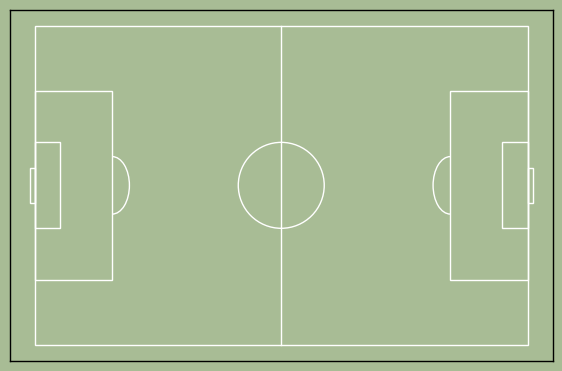

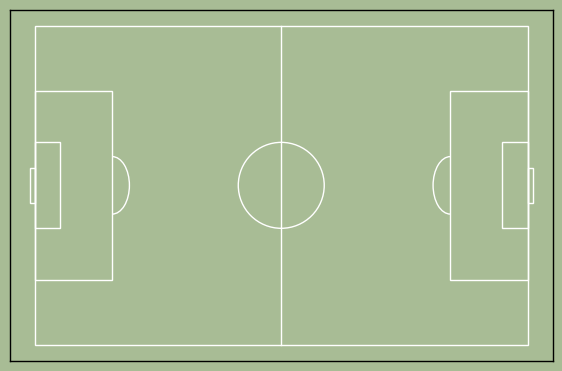

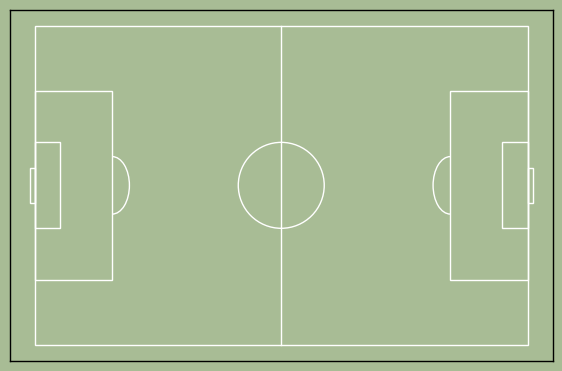

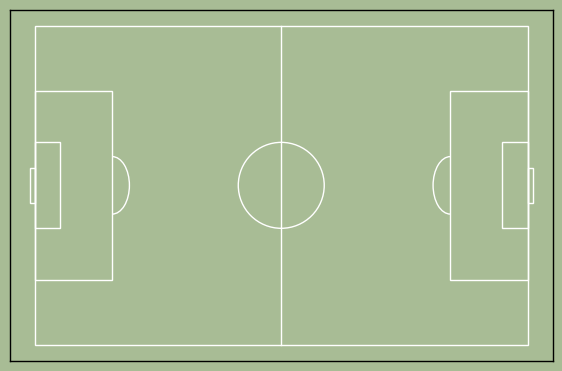

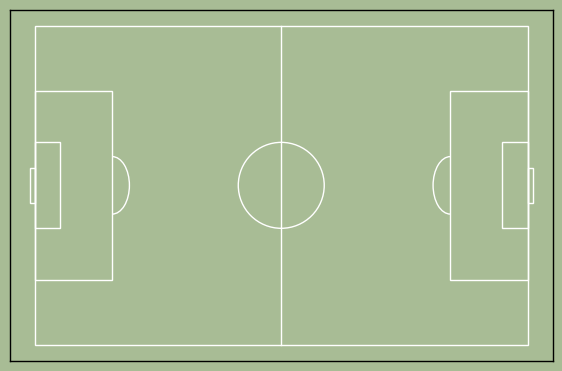

...

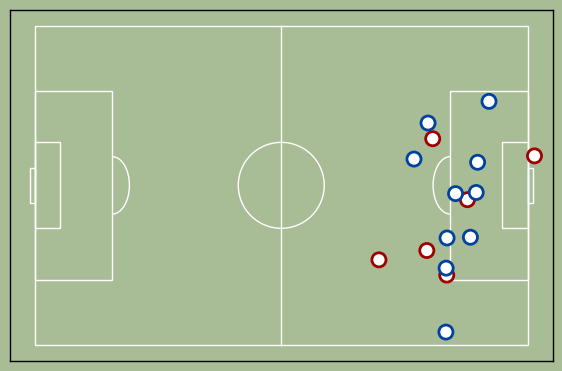

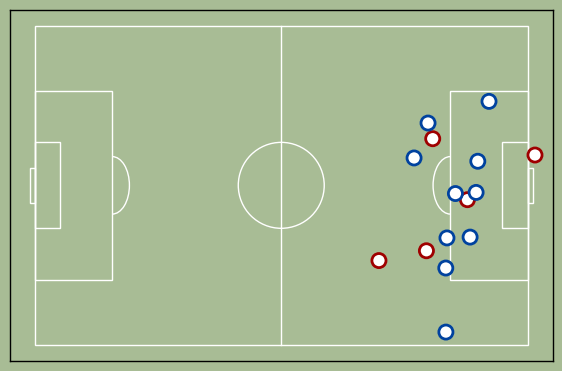

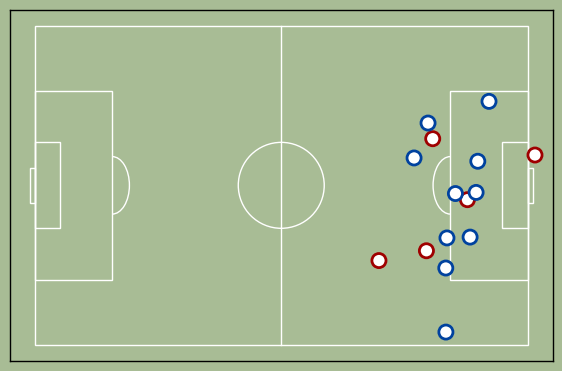

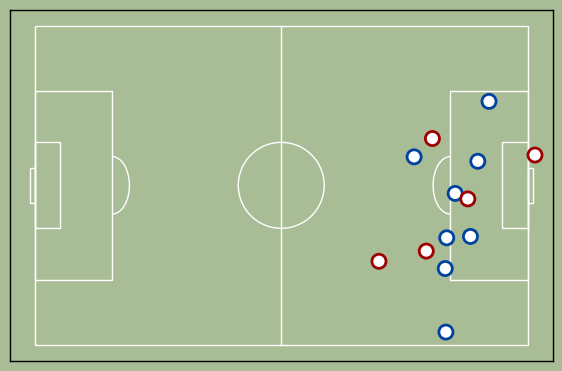

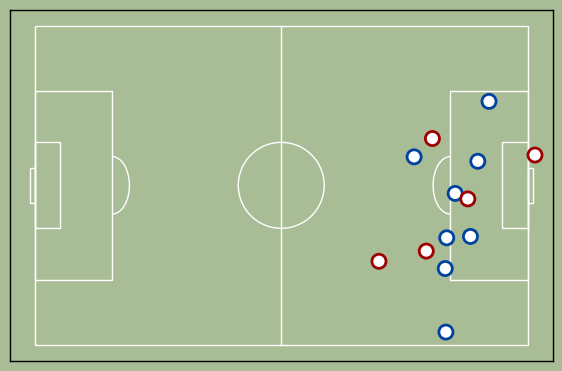

In [44]:
def draw_frame(t, display_num=False):
    f = int(t*fps)
    print(f)
    fig, ax = draw_pitch()
    box_points = boxPoints[f]
    players = player_coords[f]
    xy = [[x[0],x[1]] for x in players]
    team = [x[4] for x in players]
    print(v)
    if f >= first_frame_to_draw:     
        top_pen_pt = box_points[0]
        bot_pen_pt = box_points[1]
        top_sixyd_pt = box_points[2]
        bot_sixyd_pt = box_points[3]

        t = ProjectiveTransform()
        src = np.asarray([top_pen_pt, bot_pen_pt, top_sixyd_pt, bot_sixyd_pt])
        #unit matrix
        dst = np.asarray([[100-BOX_WIDTH, 80], [100-BOX_WIDTH, 20], 
                          [95, (100+GOAL_AREA_HEIGHT)/2], [95, (100-GOAL_AREA_HEIGHT)/2]])

        if not t.estimate(src, dst): raise Exception("estimate failed")

        data = np.asarray(xy)

        data_local = t(data)

        for i in range(len(data_local)):
            if team[i] == 1:
                ax.add_artist(Ellipse((data_local[i][0], data_local[i][1]), 3/X_SIZE*100, 3/Y_SIZE*100,
                                              edgecolor='#9F0000',
                                              linewidth=2,
                                              facecolor='white',
                                              alpha=1,
                                              zorder=20))
            elif team[i] == 2:
                ax.add_artist(Ellipse((data_local[i][0], data_local[i][1]), 3/X_SIZE*100, 3/Y_SIZE*100,
                                              edgecolor='#00429F',
                                              linewidth=2,
                                              facecolor='white',
                                              alpha=1,
                                              zorder=20))
    
    return fig

anim = VideoClip(lambda x: mplfig_to_npimage(draw_frame(x)), duration=length)

#to save the animation to a file, uncomment the next line 
anim.to_videofile('mapping.mp4', fps=fps)